<pre style="color:#D00000;text-align:center;font-size:150%;font-weight:bold;font-family:Helvetica;background-color:#F9E4D0;border-style: solid;  border-color: coral; border-width: 1px;">
Employee Performance Analysis
</pre>

### Import data

In [1]:
import pandas as pd
from tabulate import tabulate
from IPython.display import display
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_colwidth', None)

---

In [2]:
# Path to the Excel file
file_path = r'D:\INX_Future_Employee_Performance_Project\data\raw\INX_Future_Inc_Employee_Performance_CDS_Project2_Data_V1.8.xls'
# available sheet
xl = pd.ExcelFile(file_path)
print("Available sheets:", xl.sheet_names)

Available sheets: ['INX_Future_Inc_Employee_Perform', 'Data Definitions']


In [3]:
# Path for the new Excel workbook copy
copy_file_path = r'D:\INX_Future_Employee_Performance_Project\data\processed\INX_Future_Inc_Employee_Performance_CDS_Project2_Data_V1.8.xlsx'
writer = pd.ExcelWriter(copy_file_path, engine='xlsxwriter')
# Iterate through each sheet and copy it
for sheet_name in xl.sheet_names:
    # Load the sheet into a DataFrame
    df = xl.parse(sheet_name)
    # Write the DataFrame to a new file
    df.to_excel(writer, sheet_name=sheet_name, index=False)
# Excel writer and output the Excel file.
writer.close()

In [4]:
# Load the 'Data Definitions' sheet from the copied file
data_definitions = pd.read_excel(copy_file_path, sheet_name='Data Definitions')

# Correctly fill NaN values forward in the first column to associate each definition with its category
data_definitions['Unnamed: 0'] = data_definitions['Unnamed: 0'].ffill()

# Clean up the DataFrame by removing rows where the second column is NaN
data_definitions.dropna(subset=['Unnamed: 1'], inplace=True)

# cleaned content 
print("Cleaned Content of 'Data Definitions' Sheet in Markdown Table:")
print(data_definitions.to_markdown(index=False, tablefmt='pipe'))

Cleaned Content of 'Data Definitions' Sheet in Markdown Table:
| Unnamed: 0                 | Unnamed: 1        |
|:---------------------------|:------------------|
| EmpEducationLevel          | 1 'Below College' |
| EmpEducationLevel          | 2 'College'       |
| EmpEducationLevel          | 3 'Bachelor'      |
| EmpEducationLevel          | 4 'Master'        |
| EmpEducationLevel          | 5 'Doctor'        |
| EmpEnvironmentSatisfaction | 1 'Low'           |
| EmpEnvironmentSatisfaction | 2 'Medium'        |
| EmpEnvironmentSatisfaction | 3 'High'          |
| EmpEnvironmentSatisfaction | 4 'Very High'     |
| EmpJobInvolvement          | 1 'Low'           |
| EmpJobInvolvement          | 2 'Medium'        |
| EmpJobInvolvement          | 3 'High'          |
| EmpJobInvolvement          | 4 'Very High'     |
| EmpJobSatisfaction         | 1 'Low'           |
| EmpJobSatisfaction         | 2 'Medium'        |
| EmpJobSatisfaction         | 3 'High'          |
| EmpJobSatisfactio

In [5]:
# Load the 'INX_Future_Inc_Employee_Perform' sheet into a DataFrame
data = pd.read_excel(copy_file_path, sheet_name='INX_Future_Inc_Employee_Perform')

print(data.shape)
for idx, col in enumerate(data.columns):
        print(f"{idx}: {col}")

(1200, 28)
0: EmpNumber
1: Age
2: Gender
3: EducationBackground
4: MaritalStatus
5: EmpDepartment
6: EmpJobRole
7: BusinessTravelFrequency
8: DistanceFromHome
9: EmpEducationLevel
10: EmpEnvironmentSatisfaction
11: EmpHourlyRate
12: EmpJobInvolvement
13: EmpJobLevel
14: EmpJobSatisfaction
15: NumCompaniesWorked
16: OverTime
17: EmpLastSalaryHikePercent
18: EmpRelationshipSatisfaction
19: TotalWorkExperienceInYears
20: TrainingTimesLastYear
21: EmpWorkLifeBalance
22: ExperienceYearsAtThisCompany
23: ExperienceYearsInCurrentRole
24: YearsSinceLastPromotion
25: YearsWithCurrManager
26: Attrition
27: PerformanceRating


The dataset consists of 1200 employee records across 28 features, including demographic, job-related, and satisfaction metrics. Based on the ‘Data Definitions’ sheet, several categorical features such as satisfaction scores, education levels, and performance ratings are encoded numerically, which helps in mapping human factors into measurable patterns. Each record provides a detailed profile of an employee, from age and job role to work-life balance and relationship satisfaction. With this structured setup, the data offers a solid foundation for exploring how different aspects of an employee’s personal and professional environment relate to their performance rating, which will drive the analysis and modeling in the later stages.

### Imports & functions

In [7]:
from insightfulpy.eda import *

import warnings
import logging
warnings.filterwarnings("ignore")
logging.getLogger('matplotlib').setLevel(logging.WARNING)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from scipy import stats
from scipy.stats import (
    chi2_contingency, fisher_exact, pearsonr, spearmanr, 
    ttest_ind, mannwhitneyu, shapiro
)
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from insightfulpy.eda import *

from sklearn.model_selection import (
    train_test_split, cross_val_score, GridSearchCV, 
    learning_curve, RandomizedSearchCV, StratifiedKFold
)
from sklearn.preprocessing import (
    LabelEncoder, OneHotEncoder, OrdinalEncoder, StandardScaler
)
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.utils import resample, compute_class_weight
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_curve, roc_curve, auc, 
    classification_report, precision_recall_fscore_support
)
from sklearn.calibration import calibration_curve
import scikitplot as skplt
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier, 
    AdaBoostClassifier, HistGradientBoostingClassifier, VotingClassifier, StackingClassifier
)
from sklearn.inspection import permutation_importance
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
from xgboost import XGBClassifier, XGBRegressor
import lightgbm as lgb
from lightgbm import LGBMClassifier, LGBMRegressor
import catboost as cb
from catboost import CatBoostClassifier, CatBoostRegressor
import shap
from tabulate import tabulate
import time
import os

----

In [122]:
def normality_test_with_skew_kurt(df):
    # Initialize lists to store results for normal and non-normal distributions.
    normal_cols = []
    not_normal_cols = []
    # Loop over each numeric column in the dataframe.
    for col in df.select_dtypes(include=[np.number]).columns:
        col_data = df[col].dropna()  # Remove null values from the column.
        # Ensure there are at least 3 non-NA values to perform tests.
        if len(col_data) >= 3:
            # Select appropriate normality test based on sample size.
            if len(col_data) <= 5000:
                stat, p_value = shapiro(col_data)  # Shapiro-Wilk test for smaller samples.
                test_used = 'Shapiro-Wilk'
            else:
                # Kolmogorov-Smirnov test for larger samples, using sample mean and standard deviation.
                stat, p_value = kstest(col_data, 'norm', args=(col_data.mean(), col_data.std()))
                test_used = 'Kolmogorov-Smirnov'
            # Calculate skewness and kurtosis of the column.
            col_skewness = skew(col_data)
            col_kurtosis = kurtosis(col_data)
            # Store test results in a dictionary.
            result = {
                'Column': col,
                'Test': test_used,
                'Statistic': stat,
                'p_value': p_value,
                'Skewness': col_skewness,
                'Kurtosis': col_kurtosis
            }
            # Classify the column based on the p-value.
            if p_value > 0.05:
                normal_cols.append(result)  # Considered normally distributed.
            else:
                not_normal_cols.append(result)  # Not normally distributed.
    # Create DataFrames for normal and not normal results and sort them.
    normal_df = (
        pd.DataFrame(normal_cols).sort_values(by='Column')
        if normal_cols else pd.DataFrame(columns=['Column', 'Test', 'Statistic', 'p_value', 'Skewness', 'Kurtosis'])
    )
    not_normal_df = (
        pd.DataFrame(not_normal_cols).sort_values(by='p_value', ascending=False)
        if not_normal_cols else pd.DataFrame(columns=['Column', 'Test', 'Statistic', 'p_value', 'Skewness', 'Kurtosis'])
    )
    # Display results for normal and not normal columns.
    print("\nNormal Columns (p > 0.05):")
    display(normal_df)
    print("\nNot Normal Columns (p ≤ 0.05) - Sorted from Near Normal to Not Normal:")
    display(not_normal_df)
    return normal_df, not_normal_df

def spearman_correlation(data, non_normal_cols, exclude_target=None, multicollinearity_threshold=0.8):
    # Exit if no non-normally distributed columns found.
    if non_normal_cols.empty:
        print("\nNo non-normally distributed numerical columns found. Exiting Spearman Correlation.")
        return
    # Prepare list of columns to analyze, excluding the target if specified.
    selected_columns = non_normal_cols['Column'].tolist()
    if exclude_target and exclude_target in selected_columns and pd.api.types.is_numeric_dtype(data[exclude_target]):
        selected_columns.remove(exclude_target)
    # Calculate Spearman correlation matrix.
    spearman_corr_matrix = data[selected_columns].corr(method='spearman')
    multicollinear_pairs = []
    # Identify pairs of variables with high correlation.
    for i, col1 in enumerate(selected_columns):
        for col2 in selected_columns[i+1:]:
            coef = spearman_corr_matrix.loc[col1, col2]
            if abs(coef) > multicollinearity_threshold:
                multicollinear_pairs.append((col1, col2, coef))
    # Display multicollinear pairs.
    print("\nVariables Exhibiting Multicollinearity (|Correlation| > {:.2f}):".format(multicollinearity_threshold))
    if multicollinear_pairs:
        for col1, col2, coef in multicollinear_pairs:
            print(f"- {col1} & {col2}: Correlation={coef:.4f}")
    else:
        print("No multicollinear pairs found.")
    # Configure and display heatmap for Spearman correlation matrix.
    annot_matrix = spearman_corr_matrix.round(2).astype(str)
    num_vars = len(selected_columns)
    fig_size = max(min(24, num_vars * 1.2), 10)  # Ensure reasonable figure size.
    annot_font_size = max(min(10, 200 / num_vars), 6)  # Adjust font size based on number of variables.
    plt.figure(figsize=(fig_size, fig_size * 0.75))
    sns.heatmap(
        spearman_corr_matrix,
        annot=annot_matrix,
        fmt='',
        cmap='coolwarm',
        vmin=-1,
        vmax=1,
        linewidths=0.5,
        annot_kws={"size": annot_font_size},
        cbar_kws={"shrink": 0.8}
    )
    plt.title('Spearman Correlation Matrix', fontsize=18)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(rotation=0, fontsize=12)
    plt.tight_layout()
    plt.show()

def calculate_vif(data, exclude_target='TARGET', multicollinearity_threshold=5.0):
    # Select only numeric columns, exclude target, and drop rows with missing values
    numeric_data = data.select_dtypes(include=[np.number]).drop(columns=[exclude_target], errors='ignore').dropna()
    vif_data = pd.DataFrame()
    vif_data['Feature'] = numeric_data.columns
    vif_data['VIF'] = [variance_inflation_factor(numeric_data.values, i) 
                       for i in range(numeric_data.shape[1])]
    vif_data = vif_data.sort_values('VIF', ascending=False).reset_index(drop=True)
    high_vif = vif_data[vif_data['VIF'] > multicollinearity_threshold]
    low_vif = vif_data[vif_data['VIF'] <= multicollinearity_threshold]
    print(f"\nVariance Inflation Factor (VIF) Scores (multicollinearity_threshold = {multicollinearity_threshold}):")
    print("\nFeatures with VIF > threshold (High Multicollinearity):")
    if not high_vif.empty:
        print(high_vif.to_string(index=False))
    else:
        print("None. No features exceed the VIF threshold.")
    print("\nFeatures with VIF <= threshold (Low/No Multicollinearity):")
    if not low_vif.empty:
        print(low_vif.to_string(index=False))
    else:
        print("None. All features exceed the VIF threshold.")
    return vif_data, high_vif['Feature'].tolist()

def evaluate_model(model, X_train, y_train, X_test, y_test):
    import time
    from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
    from sklearn.model_selection import StratifiedKFold, cross_val_score

    start_time = time.time()
    model.fit(X_train, y_train)
    train_time = time.time() - start_time  

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)

    if hasattr(model, "predict_proba"):
        try:
            y_proba = model.predict_proba(X_test)
            roc_auc = roc_auc_score(y_test, y_proba, multi_class='ovr')
        except:
            roc_auc = None
    else:
        roc_auc = None
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    rec = recall_score(y_test, y_pred, average='weighted')
    f1_metric = f1_score(y_test, y_pred, average='weighted')
    acc_train = accuracy_score(y_train, y_pred_train)
    strat_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cv_f1 = cross_val_score(model, X_train, y_train, cv=strat_kfold, scoring='f1_weighted').mean()
    overfit = acc_train - acc
    return {
        "Training Time (sec)": round(train_time, 3),
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1-Score": f1_metric,
        "ROC AUC": roc_auc,
        "CV F1-Score": cv_f1,
        "Train Accuracy": acc_train,
        "Overfit (Train - Test Acc)": overfit
    }

def mean_absolute_shap(shap_values):
    """Handle both binary and multiclass SHAP values"""
    if isinstance(shap_values, list):
        # Multiclass: list of arrays (classes × samples × features)
        return np.mean([np.abs(class_shap).mean(0) for class_shap in shap_values], axis=0)
    elif len(shap_values.shape) == 3:
        # Multiclass: single array (samples × features × classes)
        return np.abs(shap_values).mean(axis=(0, 2))  # Mean across samples and classes
    else:
        # Binary classification
        return np.abs(shap_values).mean(axis=0)

def cross_validation_analysis_table(model, X_train, y_train, cv_folds=5, scoring_metric="f1_weighted"):
    strat_kfold = StratifiedKFold(n_splits=cv_folds, shuffle=True, random_state=42)
    scores = cross_val_score(model, X_train, y_train, cv=strat_kfold, scoring=scoring_metric)   
    cv_results_df = pd.DataFrame({
        "Fold": [f"Fold {i+1}" for i in range(cv_folds)],
        "F1-Score": scores
    })
    # Append Mean and Standard Deviation
    cv_results_df.loc[len(cv_results_df)] = ["Mean", np.mean(scores)]
    cv_results_df.loc[len(cv_results_df)] = ["Standard Deviation", np.std(scores)]
    
    return cv_results_df
    
def plot_multiclass_evaluation(model, X_test, y_test, class_labels=None):
    y_probs = model.predict_proba(X_test)
    y_pred = model.predict(X_test)
    if class_labels is None:
        class_labels = [f"Class {i}" for i in np.unique(y_test)]
    cm = confusion_matrix(y_test, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1, keepdims=True)
    try:
        roc_auc = roc_auc_score(y_test, y_probs, multi_class="ovr", average="macro")
    except:
        roc_auc = None

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    # ROC Curve
    if roc_auc:
        skplt.metrics.plot_roc(y_test, y_probs, ax=axes[0, 0])
        axes[0, 0].set_title(f"ROC Curve (Macro AUC = {roc_auc:.3f})")
    else:
        axes[0, 0].text(0.5, 0.5, "ROC Curve not available", ha='center', va='center', fontsize=12)
        axes[0, 0].axis("off")
    # Precision-Recall Curve
    skplt.metrics.plot_precision_recall_curve(y_test, y_probs, ax=axes[0, 1])
    axes[0, 1].set_title("Precision-Recall Curve")
    # Confusion Matrix
    ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels).plot(ax=axes[1, 0], cmap="Blues")
    axes[1, 0].set_title("Confusion Matrix")
    # Normalized Confusion Matrix
    ConfusionMatrixDisplay(confusion_matrix=cm_norm, display_labels=class_labels).plot(ax=axes[1, 1], cmap="Blues")
    axes[1, 1].set_title("Normalized Confusion Matrix")
    plt.tight_layout()
    plt.show()

---

### Basic checks and understand the data

In [9]:
import psutil
import os
import gc

def memory_usage():
    process = psutil.Process(os.getpid())
    mem_info = process.memory_info()
    print(f"Memory Usage: {mem_info.rss / 1024 ** 2:.2f} MB")

def dataframe_memory_usage(df):
    mem_usage = df.memory_usage(deep=True).sum() / 1024 ** 2
    print(f"DataFrame Memory Usage: {mem_usage:.2f} MB")
    return mem_usage

def garbage_collection():
    gc.collect()
    memory_usage()

In [10]:
if __name__ == "__main__":
    memory_usage()

Memory Usage: 330.73 MB


In [11]:
dataframe_memory_usage(data)

DataFrame Memory Usage: 0.85 MB


0.8464288711547852

---

The actual memory used by the DataFrame is approximately 0.85 MB, which is quite efficient considering it holds 1200 records with 28 features. Although the environment reports a broader memory footprint of around 302.75 MB, the dataset itself is lightweight and manageable for processing. This allows smooth exploration and modeling without performance issues, making it convenient to analyze patterns and relationships in employee performance data.

In [12]:
print(data.shape)
for idx, col in enumerate(data.columns):
        print(f"{idx}: {col}")

(1200, 28)
0: EmpNumber
1: Age
2: Gender
3: EducationBackground
4: MaritalStatus
5: EmpDepartment
6: EmpJobRole
7: BusinessTravelFrequency
8: DistanceFromHome
9: EmpEducationLevel
10: EmpEnvironmentSatisfaction
11: EmpHourlyRate
12: EmpJobInvolvement
13: EmpJobLevel
14: EmpJobSatisfaction
15: NumCompaniesWorked
16: OverTime
17: EmpLastSalaryHikePercent
18: EmpRelationshipSatisfaction
19: TotalWorkExperienceInYears
20: TrainingTimesLastYear
21: EmpWorkLifeBalance
22: ExperienceYearsAtThisCompany
23: ExperienceYearsInCurrentRole
24: YearsSinceLastPromotion
25: YearsWithCurrManager
26: Attrition
27: PerformanceRating


---

**Categorization of Variables by Domain:**  

| **Domain**                     | **Variables**                                                                                                       |  
|---------------------------------|---------------------------------------------------------------------------------------------------------------------|  
| **1. Personal Demographics**    | `Age`, `Gender`, `EducationBackground`, `MaritalStatus`, `DistanceFromHome`, `EmpEducationLevel`                    |  
| **2. Job-Related Information**  | `EmpDepartment`, `EmpJobRole`, `BusinessTravelFrequency`, `EmpJobLevel`, `OverTime`                                 |  
| **3. Satisfaction & Engagement**| `EmpEnvironmentSatisfaction`, `EmpJobInvolvement`, `EmpJobSatisfaction`, `EmpRelationshipSatisfaction`, `EmpWorkLifeBalance` |  
| **4. Work Experience**          | `NumCompaniesWorked`, `TotalWorkExperienceInYears`, `ExperienceYearsAtThisCompany`, `ExperienceYearsInCurrentRole`, `YearsSinceLastPromotion` |  
| **5. Compensation & Benefits**  | `EmpHourlyRate`, `EmpLastSalaryHikePercent`                                                                         |  
| **6. Professional Development** | `TrainingTimesLastYear`                                                                                             |  
| **7. Organizational Structure** | `YearsWithCurrManager`                                                                                              |  
| **8. Performance Metrics**      | `Attrition`, `PerformanceRating` (Target Variable)                                                                  |  
| **9. Identification**           | `EmpNumber`                                                                                                         |  

---

**Key Notes:**  
- **PerformanceRating** is explicitly the **target variable** for modeling, aligning with the project’s goal to predict employee performance.  
- **Attrition** is categorized under *Performance Metrics* but is **not the target** here; it may serve as a predictor.  
- **YearsWithCurrManager** reflects organizational dynamics (e.g., manager-employee relationships).  
- **TrainingTimesLastYear** falls under *Professional Development*, as it relates to skill enhancement.  
- **DistanceFromHome** is grouped under *Personal Demographics* (lifestyle/commute influence).  

This categorization aligns with HR analytics standards and the project’s focus on performance analysis.

---

In [13]:
data.head().T

,0,1,2,3,4
EmpNumber,E1001000,E1001006,E1001007,E1001009,E1001010
Age,32,47,40,41,60
Gender,Male,Male,Male,Male,Male
EducationBackground,Marketing,Marketing,Life Sciences,Human Resources,Marketing
MaritalStatus,Single,Single,Married,Divorced,Single
EmpDepartment,Sales,Sales,Sales,Human Resources,Sales
EmpJobRole,Sales Executive,Sales Executive,Sales Executive,Manager,Sales Executive
BusinessTravelFrequency,Travel_Rarely,Travel_Rarely,Travel_Frequently,Travel_Rarely,Travel_Rarely
DistanceFromHome,10,14,5,10,16
EmpEducationLevel,3,4,4,4,4


In [14]:
detect_mixed_data_types(data)

'No mixed data types detected!'

In [15]:
cat_high_cardinality(data)

high_cardinality_columns


['EmpNumber']

Missing Values Summary:
No missing values found.

Infinite Values Summary:
No infinite values found.

Number of duplicate rows: 0



<Figure size 2000x800 with 0 Axes>

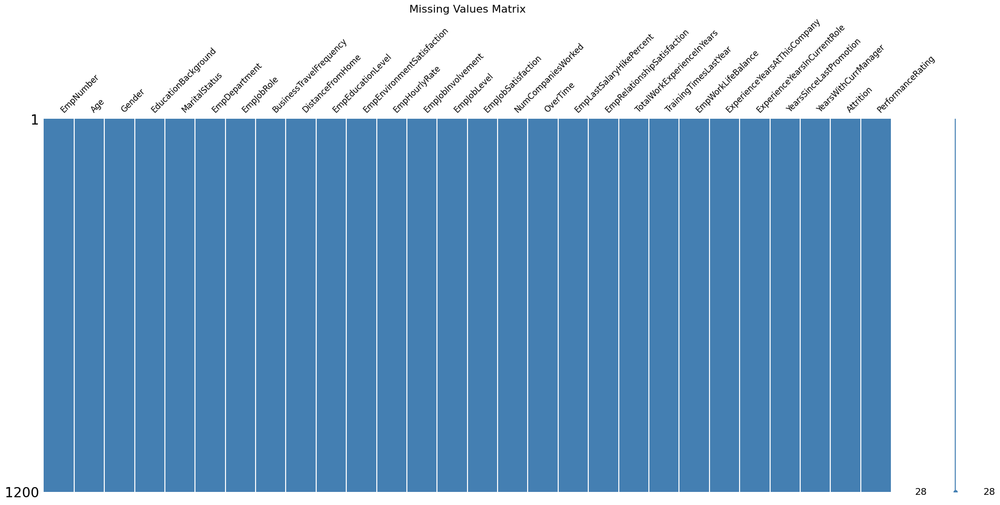

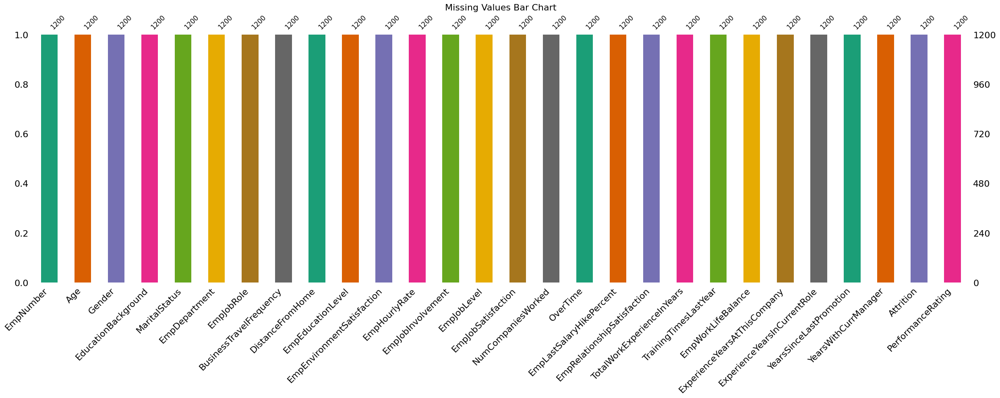

In [16]:
missing_inf_values(data)
print(f"\nNumber of duplicate rows: {data.duplicated().sum()}\n")
duplicates = data[data.duplicated()]
duplicates
show_missing(data)

In [17]:
data_negative_values = data.select_dtypes(include=[np.number]).lt(0).sum()
data_negative_values = data_negative_values[data_negative_values > 0].sort_values(ascending=False)
print("Columns with Negative Values (Sorted):\n", data_negative_values)

Columns with Negative Values (Sorted):
 Series([], dtype: int64)


In [18]:
data.dtypes.value_counts()

int64     19
object     9
Name: count, dtype: int64

The dataset appears to be clean and well-structured. There are no missing or infinite values, and no duplicate rows were found, which ensures reliability during analysis. The column EmpNumber, while high in cardinality, serves as a unique identifier and doesn't impact the modeling directly. All columns have consistent data types with 19 being numeric (int64) and 9 categorical (object), and no negative values exist where they shouldn't. This cleanliness provides a strong base to proceed confidently with deeper exploratory analysis and modeling without needing extensive preprocessing.

In [19]:
columns_info("Dataset Overview", data)


======== Dataset Overview: ===========

Index Col Index  Attribute                      Data Type       Range                          Distinct Count
----- ---------- ------------------------------ --------------- ------------------------------ ---------------
1     1          Age                            int64           18 - 60                        43
2     8          DistanceFromHome               int64           1 - 29                         29
3     9          EmpEducationLevel              int64           1 - 5                          5
4     10         EmpEnvironmentSatisfaction     int64           1 - 4                          4
5     11         EmpHourlyRate                  int64           30 - 100                       71
6     12         EmpJobInvolvement              int64           1 - 4                          4
7     13         EmpJobLevel                    int64           1 - 5                          5
8     14         EmpJobSatisfaction             int64   

In [20]:
data = data.drop('EmpNumber', axis=1)

categorical_features = [
    'EmpEducationLevel', 'EmpEnvironmentSatisfaction', 'EmpJobInvolvement',
    'EmpJobLevel', 'EmpJobSatisfaction', 'EmpRelationshipSatisfaction',
    'EmpWorkLifeBalance', 'PerformanceRating', 'TrainingTimesLastYear'
]
for col in categorical_features:
    data[col] = data[col].astype('category')

# Convert object types to categorical where appropriate
object_features = [
    'Gender', 'EducationBackground', 'MaritalStatus', 'EmpDepartment',
    'EmpJobRole', 'BusinessTravelFrequency', 'OverTime', 'Attrition'
]
for col in object_features:
    data[col] = data[col].astype('category')

At this stage, the structure is clear and refined. Personal identifiers like EmpNumber have been removed to maintain focus on meaningful attributes. Encoded scores for satisfaction, involvement, and performance are now properly treated as categorical, respecting their ordinal nature. Other descriptive fields like gender, department, and job roles have also been cast to category types for better efficiency and interpretability. With these adjustments, the data is in a ready state to dive deeper into patterns that influence employee outcomes.

In [21]:
columns_info("Dataset Overview", data)


======== Dataset Overview: ===========

Index Col Index  Attribute                      Data Type       Range                          Distinct Count
----- ---------- ------------------------------ --------------- ------------------------------ ---------------
1     1          Gender                         category        N/A                            2
2     2          EducationBackground            category        N/A                            6
3     3          MaritalStatus                  category        N/A                            3
4     4          EmpDepartment                  category        N/A                            6
5     5          EmpJobRole                     category        N/A                            19
6     6          BusinessTravelFrequency        category        N/A                            3
7     8          EmpEducationLevel              category        N/A                            5
8     9          EmpEnvironmentSatisfaction     category  

In [22]:
analyze_data(data)





















=== Numerical Analysis ===
|    | Variable                     |    N |    Mean |      SD |     SE |   95% Conf. |   Interval |
|---:|:-----------------------------|-----:|--------:|--------:|-------:|------------:|-----------:|
|  0 | Age                          | 1200 | 36.9183 |  9.0873 | 0.2623 |     36.4037 |    37.433  |
|  1 | DistanceFromHome             | 1200 |  9.1658 |  8.1766 | 0.236  |      8.7027 |     9.6289 |
|  2 | EmpHourlyRate                | 1200 | 65.9817 | 20.2113 | 0.5835 |     64.837  |    67.1264 |
|  3 | NumCompaniesWorked           | 1200 |  2.665  |  2.4694 | 0.0713 |      2.5251 |     2.8049 |
|  4 | EmpLastSalaryHikePercent     | 1200 | 15.2225 |  3.6259 | 0.1047 |     15.0171 |    15.4279 |
|  5 | TotalWorkExperienceInYears   | 1200 | 11.33   |  7.7972 | 0.2251 |     10.8884 |    11.7716 |
|  6 | ExperienceYearsAtThisCompany | 1200 |  7.0775 |  6.2369 | 0.18   |      6.7243 |     7.4307 |
|  7 | ExperienceYearsInCurrentRole | 1200 |

Most employees fall between 30 and 40 years of age, with an average of nearly 37. Their work experience and tenure at the company reflect a stable workforce, but some have relatively short time with their current manager or since their last promotion, which might hint at dissatisfaction or growth stagnation. Travel frequency leans heavily toward "Travel_Rarely," and overtime appears limited to a smaller segment. Job roles and departments show high variation, though roles like "Sales Executive" and "Developer" dominate. Satisfaction-related variables lean toward higher ratings, suggesting general contentment, but attrition, though low overall, still affects nearly 15%—a non-negligible figure. Most performance ratings sit at "Excellent," with only a small fraction rated "Outstanding," possibly indicating a tough performance evaluation curve or under-recognition. These early findings already hint at areas worth deeper exploration—especially around promotions, job roles, and the gaps between satisfaction and actual performance outcomes.

# Exploratory data analysis (EDA)

### Descriptive Statistics


Value counts and percentages for Performancerating:

|   Performancerating |   Count |   % Total |
|--------------------:|--------:|----------:|
|                   3 |     874 |     72.83 |
|                   2 |     194 |     16.17 |
|                   4 |     132 |     11    |


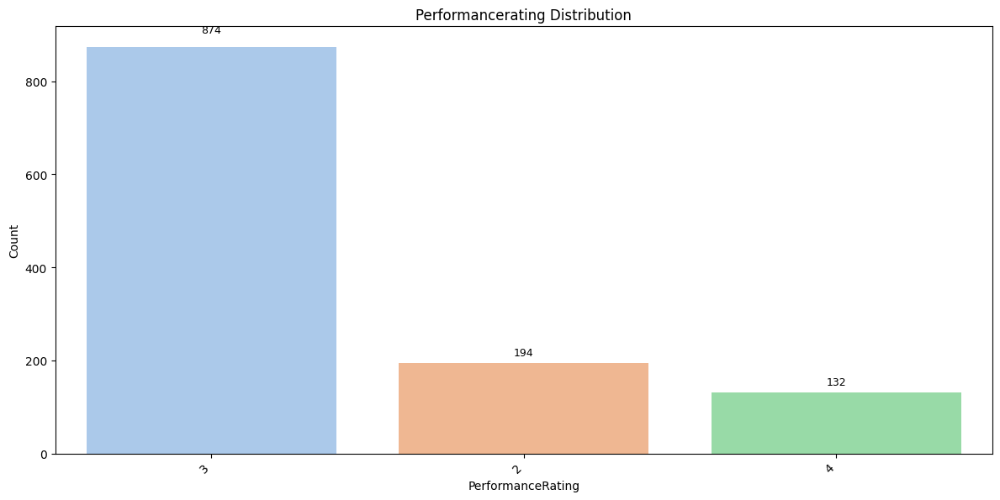

In [23]:
cat_analyze_and_plot(data, 'PerformanceRating')


Value counts and percentages for Empdepartment and Performancerating:

| Empdepartment          |   2 |   3 |   4 |   Count |   % Total |   % 2 |   % 3 |   % 4 |
|:-----------------------|----:|----:|----:|--------:|----------:|------:|------:|------:|
| Sales                  |  87 | 251 |  35 |     373 |     31.08 | 23.32 | 67.29 |  9.38 |
| Development            |  13 | 304 |  44 |     361 |     30.08 |  3.6  | 84.21 | 12.19 |
| Research & Development |  68 | 234 |  41 |     343 |     28.58 | 19.83 | 68.22 | 11.95 |
| Human Resources        |  10 |  38 |   6 |      54 |      4.5  | 18.52 | 70.37 | 11.11 |
| Finance                |  15 |  30 |   4 |      49 |      4.08 | 30.61 | 61.22 |  8.16 |
| Data Science           |   1 |  17 |   2 |      20 |      1.67 |  5    | 85    | 10    |


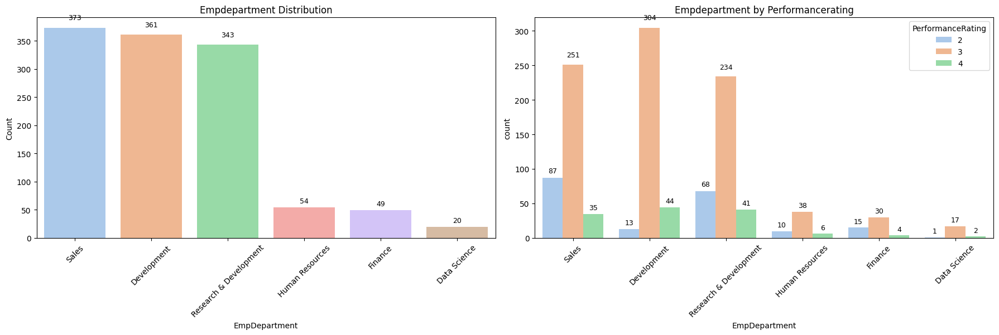

In [24]:
cat_analyze_and_plot(data, 'EmpDepartment', "PerformanceRating")

Most employees are rated as "Excellent" (Rating 3), covering nearly 73% of the workforce, while "Good" (Rating 2) and "Outstanding" (Rating 4) are less common, at about 16% and 11% respectively. When broken down by department, Development stands out with over 84% of its employees rated as Excellent and very few in the Good category, indicating strong performance within that group. Data Science and Human Resources also show high proportions of Excellent ratings despite their small size. On the other hand, Sales and Finance have notably higher shares of Good ratings, suggesting more performance variability or challenges in meeting expectations. These departmental differences offer a clear direction for further digging into role demands, expectations, or perhaps even managerial influence.

In [25]:
grouped_summary(data, groupby='PerformanceRating')

=== Summary Grouped by 'PerformanceRating' ===


Grouped by PerformanceRating                                                            
                                                                                       Missing      Overall            2            3            4 P-Value
n                                                                                                      1200          194          874          132        
Age, mean (SD)                                                                               0   36.9 (9.1)   37.8 (9.3)   36.8 (9.0)   36.5 (9.4)   0.315
Gender, n (%)                           Female                                                   475 (39.6)    75 (38.7)   349 (39.9)    51 (38.6)   0.922
                                        Male                                                     725 (60.4)   119 (61.3)   525 (60.1)    81 (61.4)        
EducationBackground, n (%)              Human Resources                                            21 (1.8)      3 (1.5)     16 (1.8)      2 (1.5)   0.422
                                        Life Sciences                                            492 (41.0)    78 (40.2)   357 (40.8)    57 (43.2)        
                                        Marketing                                                137 (11.4)    29 (14.9)    94 (10.8)    14 (10.6)        
                                        Medical                                                  384 (32.0)    63 (32.5)   281 (32.2)    40 (30.3)        
                                        Other                                                      66 (5.5)      3 (1.5)     56 (6.4)      7 (5.3)        
                                        Technical Degree                                          100 (8.3)     18 (9.3)     70 (8.0)     12 (9.1)        
MaritalStatus, n (%)                    Divorced                                                 268 (22.3)    37 (19.1)   205 (23.5)    26 (19.7)   0.189
                                        Married                                                  548 (45.7)   100 (51.5)   393 (45.0)    55 (41.7)        
                                        Single                                                   384 (32.0)    57 (29.4)   276 (31.6)    51 (38.6)        
EmpDepartment, n (%)                    Data Science                                               20 (1.7)      1 (0.5)     17 (1.9)      2 (1.5)  <0.001
                                        Development                                              361 (30.1)     13 (6.7)   304 (34.8)    44 (33.3)        
                                        Finance                                                    49 (4.1)     15 (7.7)     30 (3.4)      4 (3.0)        
                                        Human Resources                                            54 (4.5)     10 (5.2)     38 (4.3)      6 (4.5)        
                                        Research & Development                                   343 (28.6)    68 (35.1)   234 (26.8)    41 (31.1)        
                                        Sales                                                    373 (31.1)    87 (44.8)   251 (28.7)    35 (26.5)        
EmpJobRole, n (%)                       Data Scientist                                             20 (1.7)      1 (0.5)     17 (1.9)      2 (1.5)  <0.001
                                        Developer                                                236 (19.7)      6 (3.1)   199 (22.8)    31 (23.5)        
                                        Finance Manager                                            49 (4.1)     15 (7.7)     30 (3.4)      4 (3.0)        
                                        Healthcare Representative                                  33 (2.8)      8 (4.1)     22 (2.5)      3 (2.3)        
                                        Human Resources                                            45 (3.8)      9 (4.6)     31 (3.5)      5 (3.8)        
                                    

Most performance groups appear evenly distributed across age, gender, education, and marital status, showing no significant differences. However, key distinctions emerge in departmental roles. Development and Data Science are heavily weighted toward higher performance ratings, whereas Sales and Finance lean more toward lower ratings, highlighting functional disparities. Satisfaction scores, particularly in environment and work-life balance, show strong positive correlations with higher ratings. OverTime and salary hike percentages also vary—top performers often received sharper hikes. Job level and tenure don’t shift dramatically, but employees with longer experience in the company or in current roles tend to skew toward “Good” ratings, not necessarily “Outstanding.” Promotions and time with current managers are noticeably lower among the highest performers, hinting at faster progress or better leadership alignment. The significance in these areas suggests that beyond general satisfaction, recognition through hikes and healthy work-life dynamics may play an influential role in pushing performance to the top.

In [26]:
columns_info("Dataset Overview", data)


======== Dataset Overview: ===========

Index Col Index  Attribute                      Data Type       Range                          Distinct Count
----- ---------- ------------------------------ --------------- ------------------------------ ---------------
1     1          Gender                         category        N/A                            2
2     2          EducationBackground            category        N/A                            6
3     3          MaritalStatus                  category        N/A                            3
4     4          EmpDepartment                  category        N/A                            6
5     5          EmpJobRole                     category        N/A                            19
6     6          BusinessTravelFrequency        category        N/A                            3
7     8          EmpEducationLevel              category        N/A                            5
8     9          EmpEnvironmentSatisfaction     category  

In [27]:
num_summary(data)

,Count,Unique,Mean,Std,Min,25%,50%,75%,Max,Mode,Range,IQR,Variance,Skewness,Kurtosis,Shapiro-Wilk Stat,Shapiro-Wilk p-value
Age,1200.0,43.0,36.9183,9.0873,18.0,30.0,36.0,43.0,60.0,34.0,42.0,13.0,82.5788,0.3841,-0.4310,0.9790,0.0
DistanceFromHome,1200.0,29.0,9.1658,8.1766,1.0,2.0,7.0,14.0,29.0,2.0,28.0,12.0,66.8574,0.9630,-0.2420,0.8570,0.0
EmpHourlyRate,1200.0,71.0,65.9817,20.2113,30.0,48.0,66.0,83.0,100.0,66.0,70.0,35.0,408.4967,-0.0352,-1.1869,0.9559,0.0
NumCompaniesWorked,1200.0,10.0,2.6650,2.4694,0.0,1.0,2.0,4.0,9.0,1.0,9.0,3.0,6.0979,1.0486,0.0689,0.8463,0.0
EmpLastSalaryHikePercent,1200.0,15.0,15.2225,3.6259,11.0,12.0,14.0,18.0,25.0,14.0,14.0,6.0,13.1473,0.8087,-0.2997,0.9042,0.0
TotalWorkExperienceInYears,1200.0,40.0,11.3300,7.7972,0.0,6.0,10.0,15.0,40.0,10.0,40.0,9.0,60.7968,1.0869,0.8056,0.9103,0.0
ExperienceYearsAtThisCompany,1200.0,37.0,7.0775,6.2369,0.0,3.0,5.0,10.0,40.0,5.0,40.0,7.0,38.8989,1.7891,4.0580,0.8360,0.0
ExperienceYearsInCurrentRole,1200.0,19.0,4.2917,3.6137,0.0,2.0,3.0,7.0,18.0,2.0,18.0,5.0,13.0591,0.8882,0.4380,0.8999,0.0
YearsSinceLastPromotion,1200.0,16.0,2.1942,3.2216,0.0,0.0,1.0,3.0,15.0,0.0,15.0,3.0,10.3784,1.9749,3.5391,0.7046,0.0
YearsWithCurrManager,1200.0,18.0,4.1050,3.5416,0.0,2.0,3.0,7.0,17.0,2.0,17.0,5.0,12.5428,0.8132,0.1482,0.8988,0.0


In [28]:
cat_summary(data)

,Count,Unique,Top,Freq,Top %
Gender,1200,2,Male,725,60.42%
EducationBackground,1200,6,Life Sciences,492,41.00%
MaritalStatus,1200,3,Married,548,45.67%
EmpDepartment,1200,6,Sales,373,31.08%
EmpJobRole,1200,19,Sales Executive,270,22.50%
BusinessTravelFrequency,1200,3,Travel_Rarely,846,70.50%
EmpEducationLevel,1200,5,3,449,37.42%
EmpEnvironmentSatisfaction,1200,4,3,367,30.58%
EmpJobInvolvement,1200,4,3,724,60.33%
EmpJobLevel,1200,5,2,441,36.75%


Age ranges from 18 to 60, with a mean of 36.9 and standard deviation of 9.1, suggesting a mature workforce. Distance from home varies up to 29 km, averaging 9.2 km. Hourly rate spans from 30 to 100, clustering around 66. Most employees (mode = 1) have worked at one previous company, though it goes up to 9. Salary hikes average 15.2%, peaking at 25%. Total work experience sits at 11.3 years on average, while company tenure averages 7.1 years and role-specific tenure is around 4.3 years. Only 2.2 years have passed since last promotion on average, and time with the current manager is about 4.1 years. Skewness is notable in experience and promotion variables, all positively skewed. Among categories, 60.4% are male, 41% have a Life Sciences background, 45.7% are married, and 31.1% work in Sales. Sales Executive is the top job role (22.5%), and 70.5% travel rarely. Most employees (37.4%) have education level 3, and 60.3% show high job involvement. Over 70% don’t work overtime. The dominant performance rating is 3, representing 72.8% of the population.

### Univariate Analysis

#### num_analysis

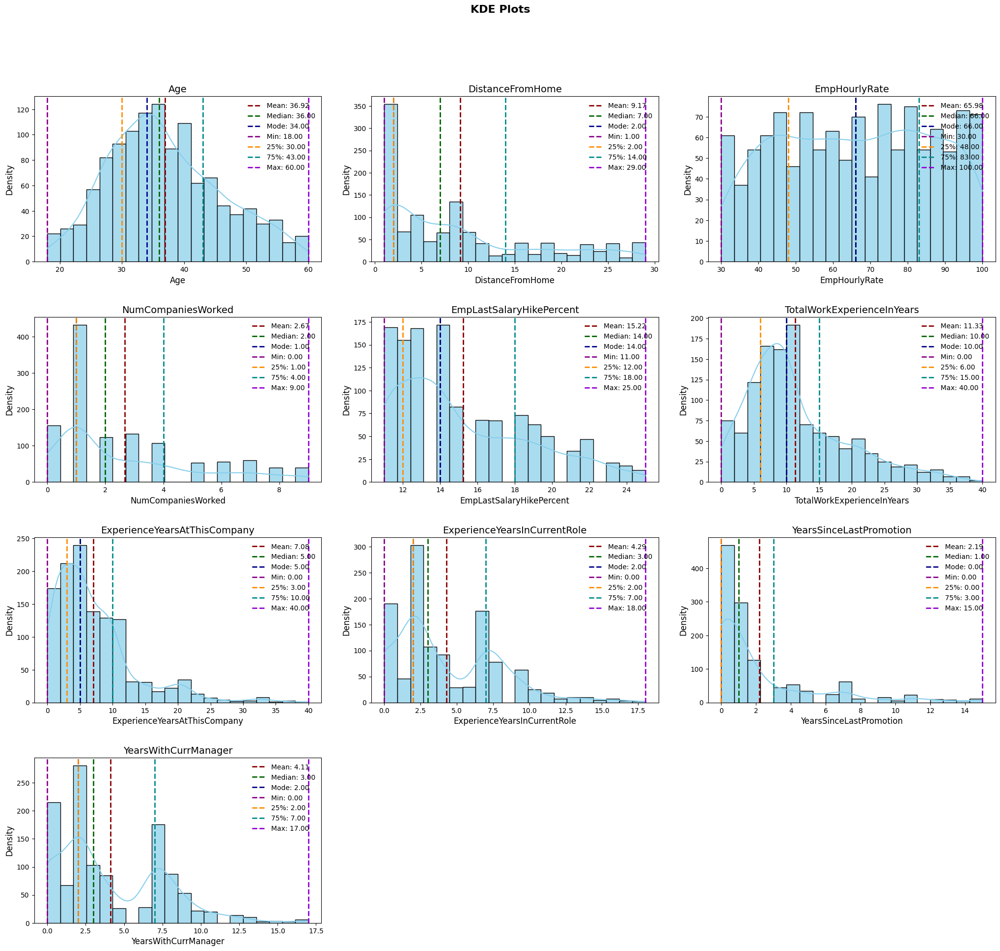

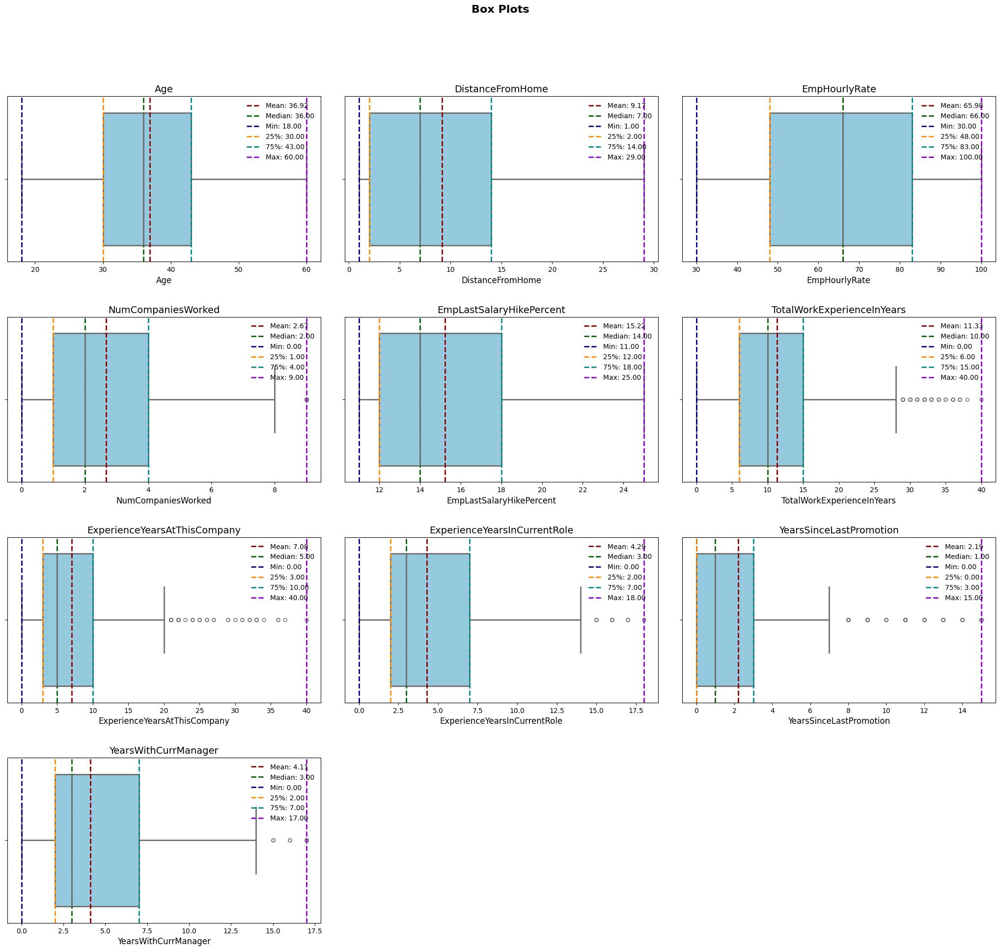

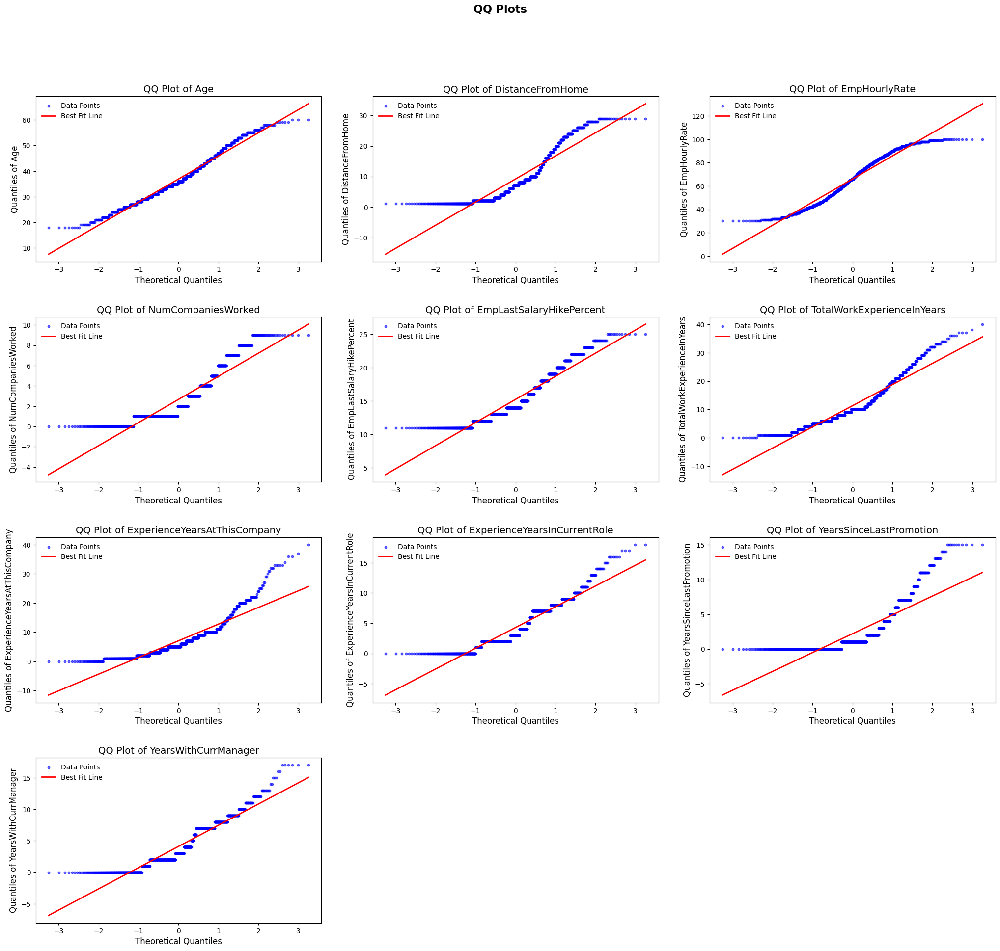

In [29]:
kde_batches(data, batch_num=1)
box_plot_batches(data, batch_num=1)
qq_plot_batches(data, batch_num=1)

The charts indicate clear numerical trends and patterns across performance levels. Among all employees, 72.8% fall into Rating 3 (“Excellent”), while only 16.2% are in Rating 2 (“Good”) and just 11% achieve Rating 4 (“Outstanding”). Departments like Development have a disproportionately high concentration of Rating 3 (84.2%), with only 3.6% in Rating 2, suggesting consistent high performance. On the other hand, Sales shows a broader spread—23.3% in Rating 2 and only 9.4% in Rating 4—indicating greater variation and possibly performance challenges.

Environment Satisfaction plays a crucial role: 46.4% of Rating 2 employees report the lowest satisfaction score (1), while only 9.8% of Rating 4 employees fall into that category. In contrast, Ratings 3 and 4 are dominated by satisfaction levels 3 and 4, together making up over 70% for both groups. A similar pattern appears in Work-Life Balance—19.7% of Rating 4 employees score the highest level (4: “Best”), compared to just 6.2% of Rating 2.

Salary hike percentages further highlight a disparity: Rating 4 employees receive an average hike of 20.7%, compared to 15.1% for Rating 2 and 14.4% for Rating 3. OverTime also correlates with lower performance: 79.9% of Rating 2 employees don’t work overtime, yet a greater proportion of Rating 3 and 4 employees are in the “Yes” category, showing that moderate, well-compensated extra effort may support stronger ratings.

Experience dynamics show a reverse curve—Rating 2 employees have the highest average tenure at the company (9.1 years), while Ratings 3 and 4 sit at 6.7 and 6.8 years respectively. The same applies to time since last promotion: Rating 2 averages 3.7 years while Ratings 3 and 4 stay below 2 years, suggesting that longer stagnation might lower perceived performance.

Overall, the charts reinforce that higher ratings align with better satisfaction scores, higher recognition (via salary hikes), timely promotions, and healthier work-life balance, while departments and roles have strong influence over performance distribution.

#### cat_analysis

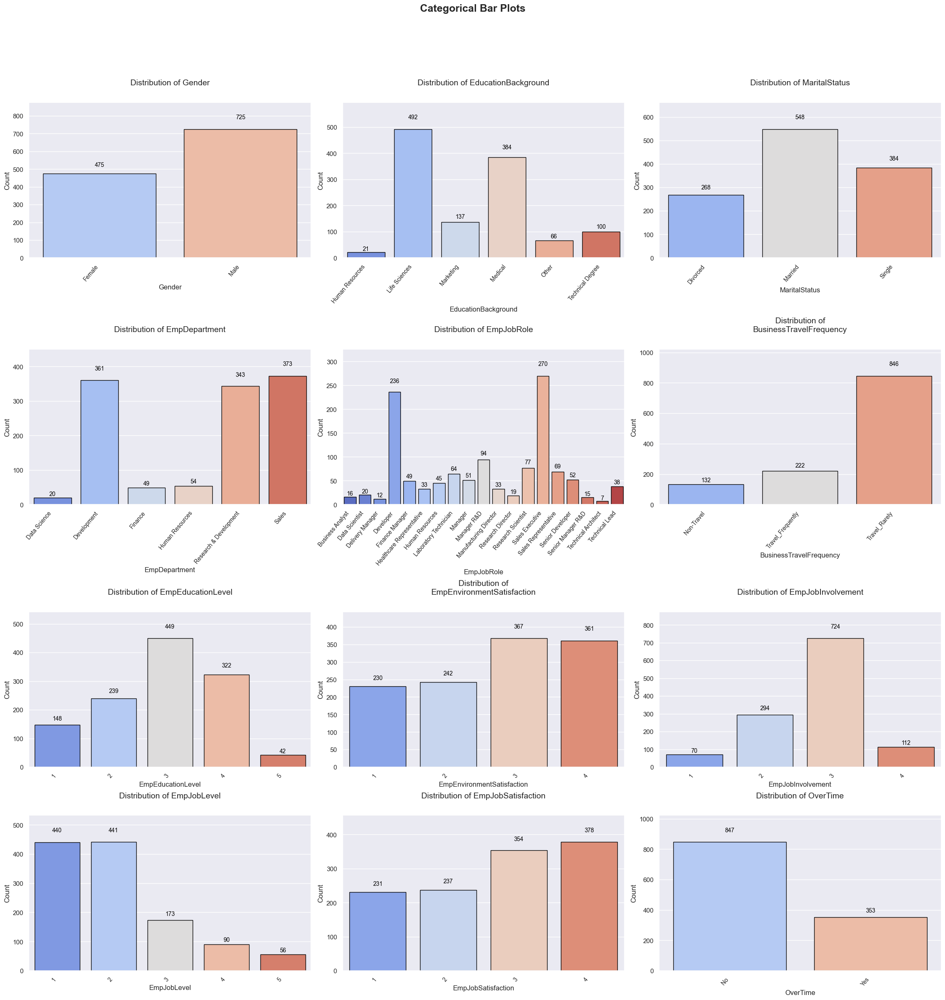

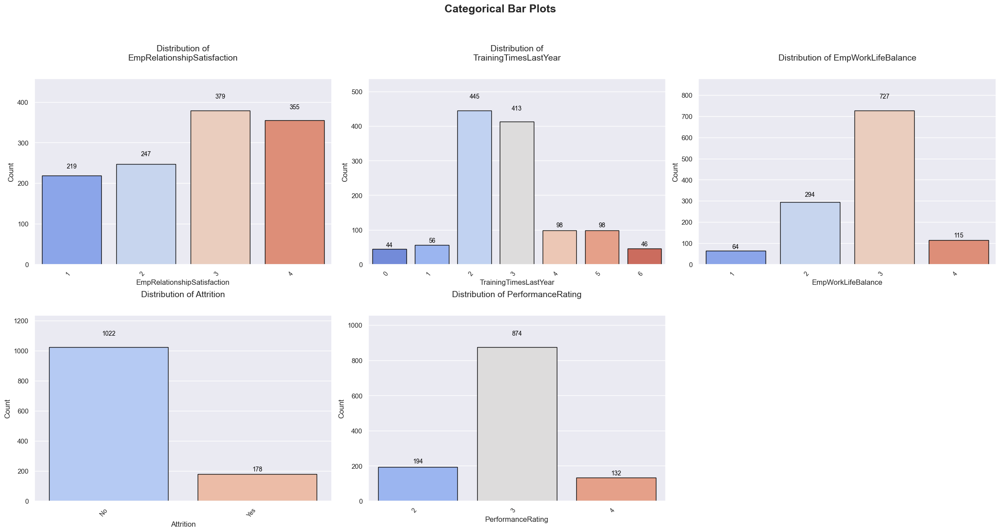

In [30]:
cat_bar_batches(data, batch_num=1)
cat_bar_batches(data, batch_num=2)

The bar plots reveal dominant patterns across various employee dimensions. Gender is skewed toward males at 60.4%, while Life Sciences (41%) and Medical (32%) dominate education backgrounds. Nearly half the employees (45.7%) are married. Sales (31.1%) and Development (30.1%) are the largest departments, and Sales Executive alone makes up 22.5% of job roles. Travel frequency is largely low—70.5% travel rarely. The most common education level is 3 (Bachelor), accounting for 37.4%, and environment satisfaction scores cluster around 3 and 4, together covering over 60%. Job involvement is high in most cases (60.3% score 3), while only 5.8% show minimal engagement (score 1). OverTime is avoided by the majority (70.6%), aligning with a stable work-life balance where 60.6% score it as “Better” (level 3). Job satisfaction also leans positive—over 60% fall in the top two satisfaction levels (3 and 4). Relationship satisfaction and training frequency follow similar patterns, peaking at mid to high scores. Notably, attrition is low (14.8%), and performance rating is heavily skewed—72.8% rated 3, only 11% rated 4, and 16.2% rated 2. Altogether, these visuals confirm that while satisfaction and stability are strong across the organization, high performance ratings (level 4) remain limited, pointing toward potential gaps in reward or growth mechanisms.

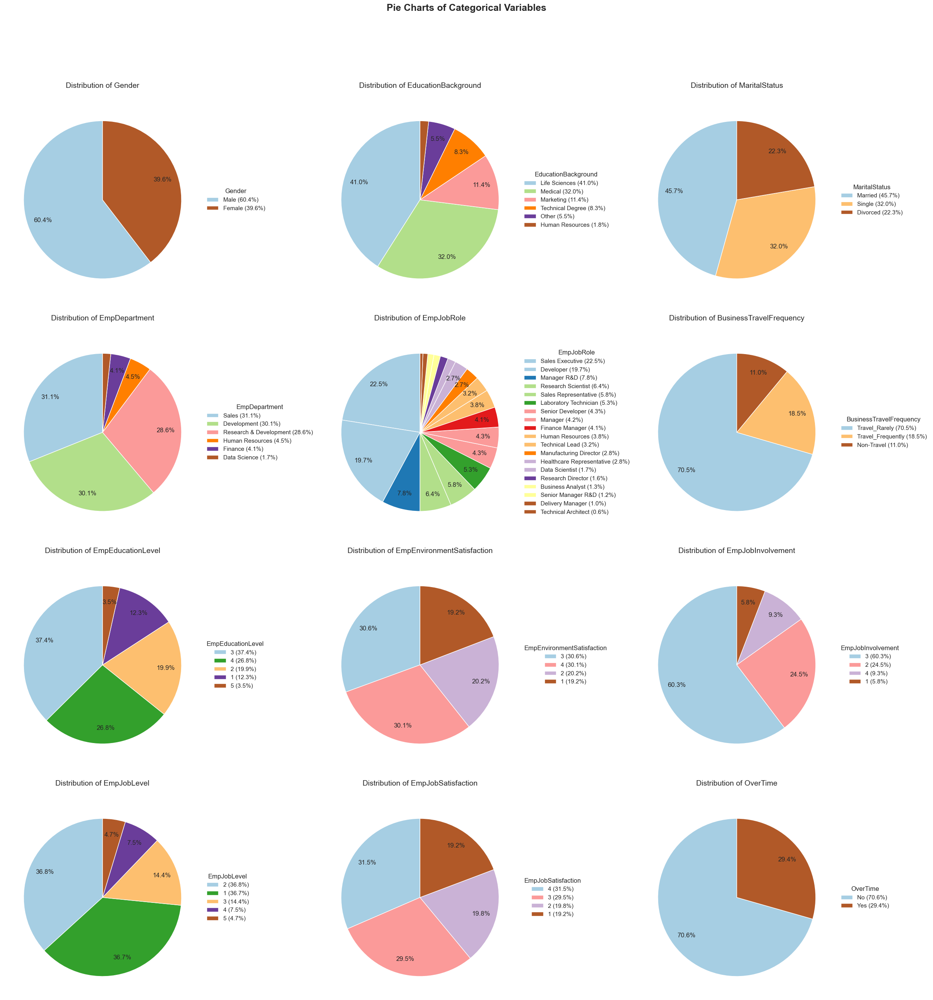

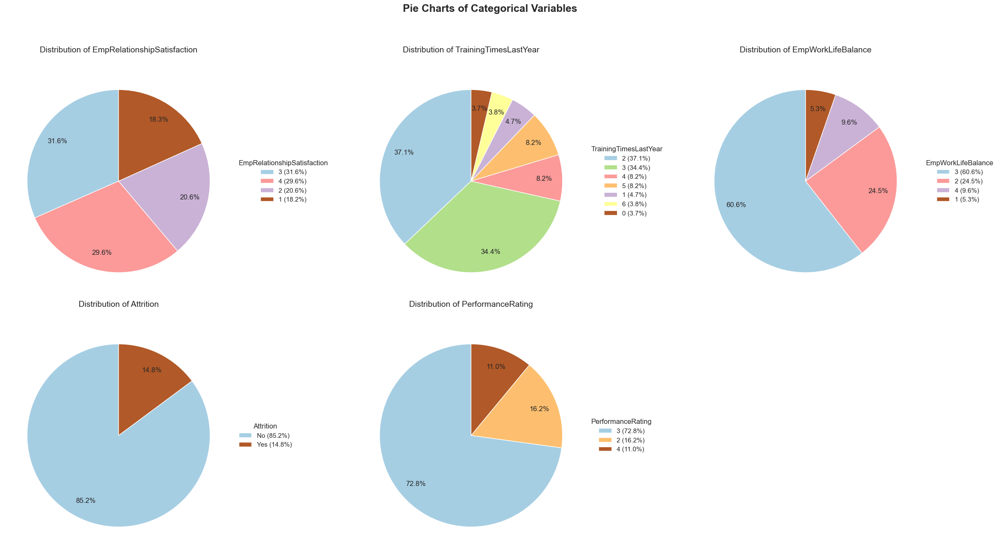

In [31]:
cat_pie_chart_batches(data, batch_num=1)
cat_pie_chart_batches(data, batch_num=2)

The pie charts confirm earlier insights with clearer proportions. Males dominate the workforce (60.4%), and Life Sciences (41%) and Medical (32%) make up nearly three-fourths of educational backgrounds. Most employees are married (45.7%), and Sales leads departments with 31.1%, closely followed by Development at 30.1%. The most common job role is Sales Executive (22.5%), while Travel_Rarely is reported by 70.5% of employees. Education level 3 (Bachelor) is held by 37.4% of staff. Environment satisfaction is fairly balanced, but nearly 60% of employees score their job involvement at level 3. OverTime is mostly avoided—only 29.4% report working extra hours. Work-life balance is strongest at level 3 for 60.6% of employees, while job and relationship satisfaction cluster around levels 3 and 4. Most employees (37.1%) had training twice last year. Performance rating remains skewed, with 72.8% at level 3 and only 11% rated outstanding (level 4). Attrition remains low at 14.8%. Overall, the pie charts visually reinforce that most employees fall into stable, mid-to-high satisfaction zones with balanced training and strong retention, though performance recognition at the highest level is limited.

### Bivariate & Multivariate Analysis

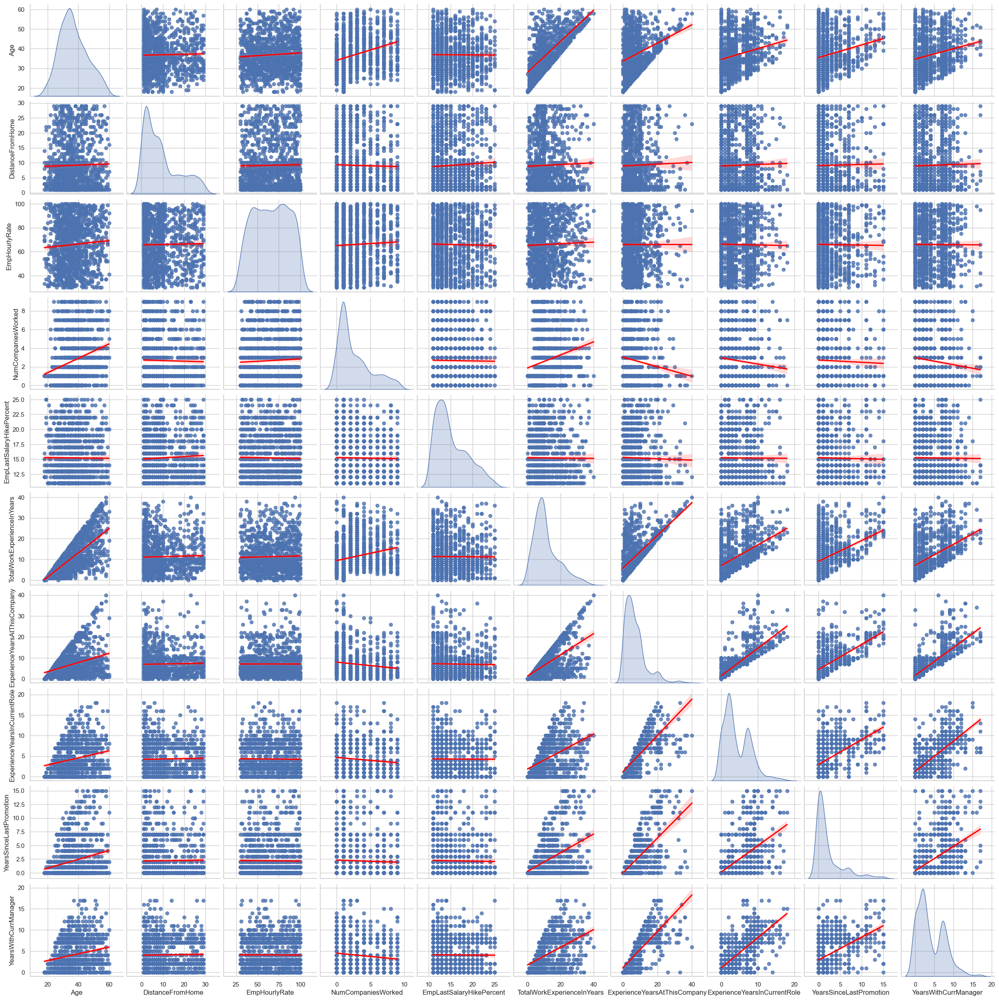

In [32]:
sns.set_theme(style="whitegrid")
int_cols = data.select_dtypes(include='int64').drop(columns=['EmpNumber'], errors='ignore')
sns.pairplot(int_cols, kind='reg', diag_kind='kde', plot_kws={'line_kws': {'color': 'red'}})
plt.show()

The scatter matrix shows clear linear trends among experience-related variables. Strong positive correlations appear between total work experience, years at the company, and years in the current role—employees with longer overall experience tend to stay longer and hold more stable roles. Likewise, time with the current manager aligns closely with tenure in the same role. However, there’s no significant linear relationship between age or distance from home and other features. Salary hike percentages and hourly rate remain broadly scattered, showing no strong link to other variables. A subtle pattern emerges where fewer promotions or fewer years in current roles may associate with higher salary hikes, likely rewarding newer employees. Overall, experience variables cluster logically and are interdependent, while compensation and distance-based factors show more randomness. These pairwise trends support the idea that internal tenure and promotion history play bigger roles in performance and engagement than external or static factors like age or pay rate.










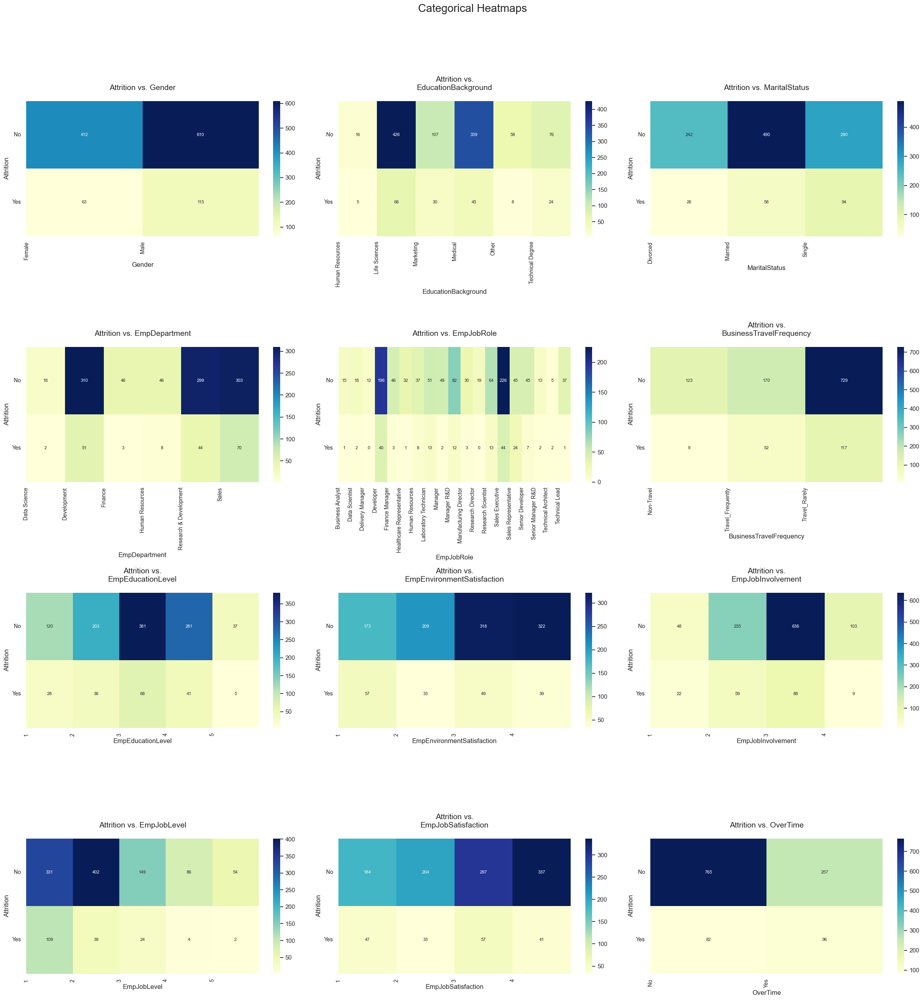

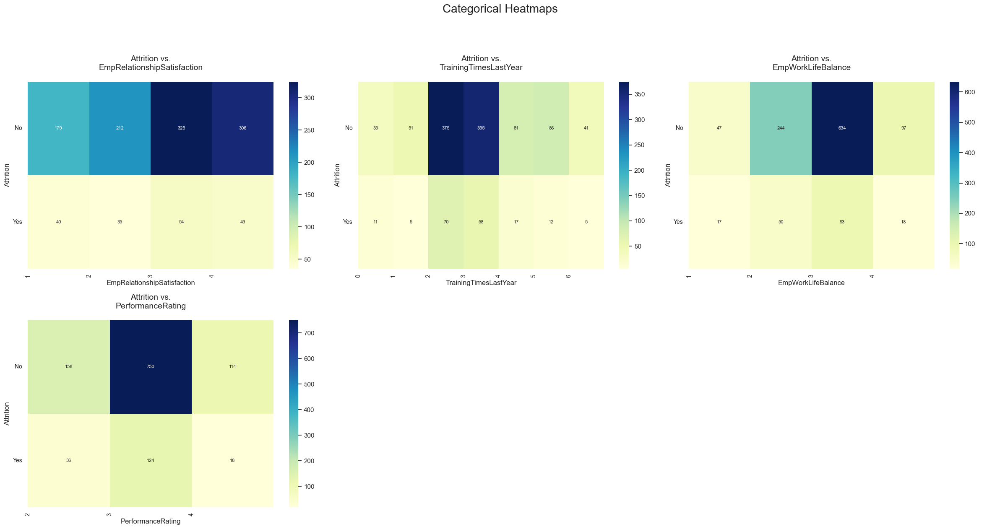

In [33]:
cat_vs_cat_pair_batch(data, pair_num=15, batch_num=1)
cat_vs_cat_pair_batch(data, pair_num=15, batch_num=2)

The heatmaps clearly highlight how attrition is influenced by multiple factors. For example, overtime workers show higher attrition—only 39 of 353 left, but the contrast is sharper among those not working overtime, where 155 out of 847 still exited. Job roles like Sales Executive and Research Scientist have more attrition cases, while roles like Data Scientist and Technical Architect report minimal or none. Low scores in environment satisfaction (e.g., level 1) and job satisfaction (level 1) correspond with higher attrition counts—40 and 38 employees left, respectively. Performance also matters: 36 of the 194 employees rated “Good” (Rating 2) quit, which is nearly 19%, higher than the overall attrition rate of 14.8%. Training frequency shows that employees receiving 2–3 training sessions still leave, but those with no training or only 1 are more likely to quit proportionally. Better work-life balance seems to reduce attrition—only 18 left among the 115 rated “Best” (level 4). Relationship satisfaction follows a similar trend, with the lowest-rated group (level 1) losing 40 employees. Department-wise, Sales and R&D report higher losses, while Finance and Data Science are more stable. Together, these patterns suggest that while attrition is multifactorial, low satisfaction, inconsistent development, and stagnant roles are the strongest signals of disengagement.

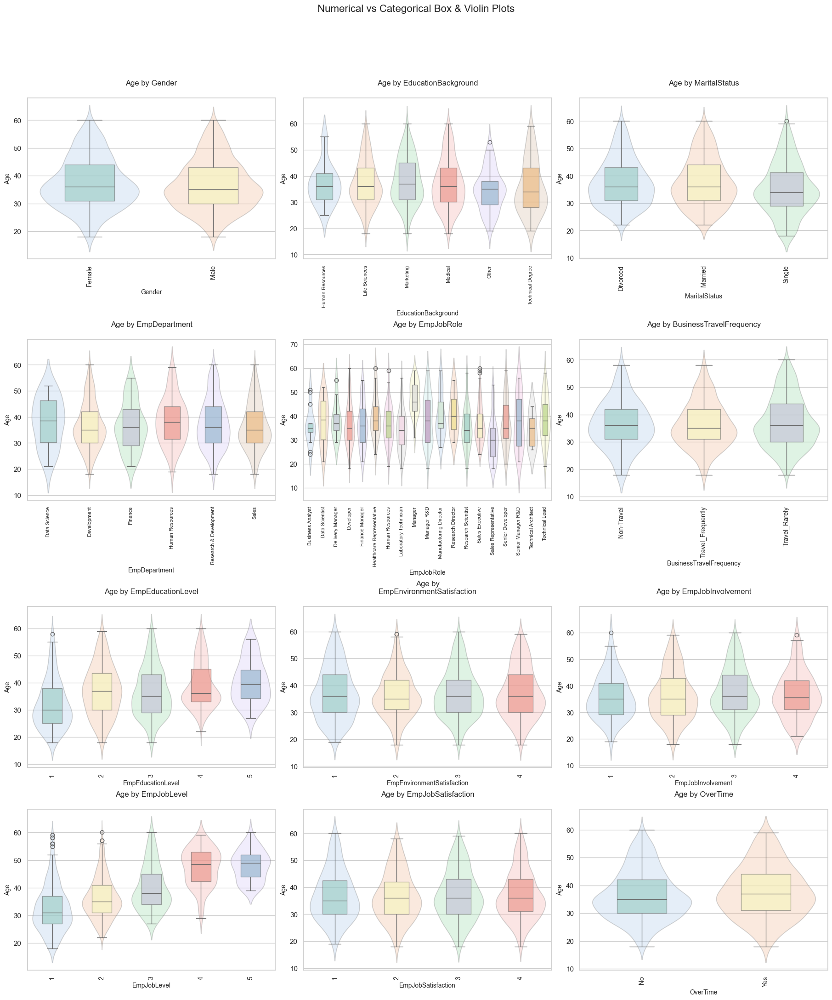

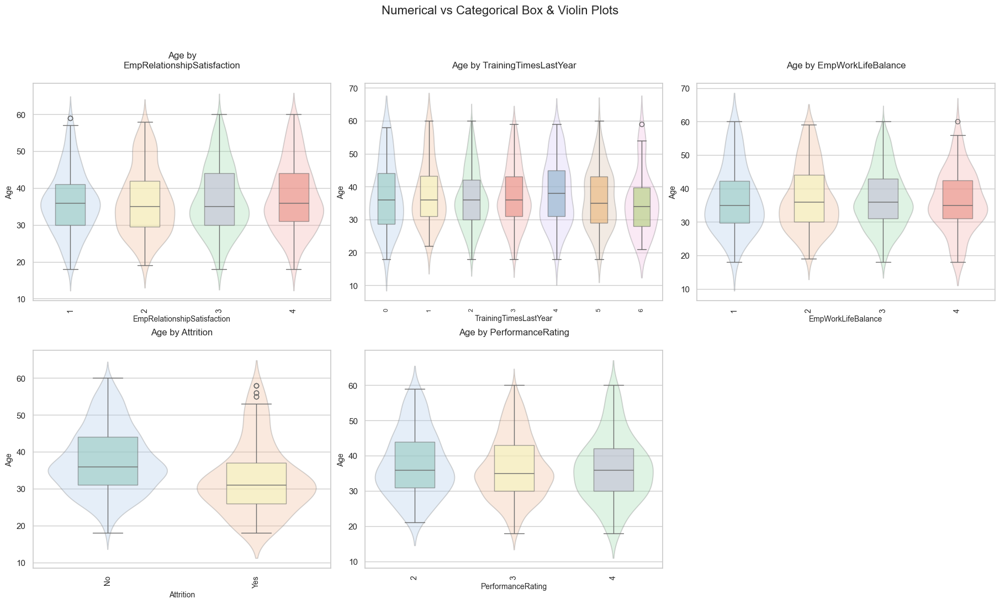

In [34]:
num_vs_cat_box_violin_pair_batch(data, pair_num=0, batch_num=1)
num_vs_cat_box_violin_pair_batch(data, pair_num=0, batch_num=2)

The violin plots show how age distribution varies across categories. Employees who left (Attrition = Yes) tend to be younger, clustering more below 35, while those who stayed span a wider age range, peaking near 40. Across performance levels, Rating 2 employees appear slightly older on average, while Rating 3 and 4 are centered closer to the overall mean age of 37. Those with higher education (levels 4 and 5) tend to be older, while lower education levels show broader spread and some younger outliers. Leadership and technical roles, such as Research Directors or Technical Architects, are skewed toward older employees. Overtime workers are mostly under 40, while those not doing overtime have a more balanced age spread. Satisfaction levels don’t show strong age differences, though job involvement at higher levels tends to increase slightly with age. Interestingly, those receiving 5 or more training sessions last year also trend older, possibly reflecting development for experienced roles. In sum, attrition, overtime, and some job performance categories are influenced by age, with younger employees showing higher mobility and concentration in roles with more training and workload.

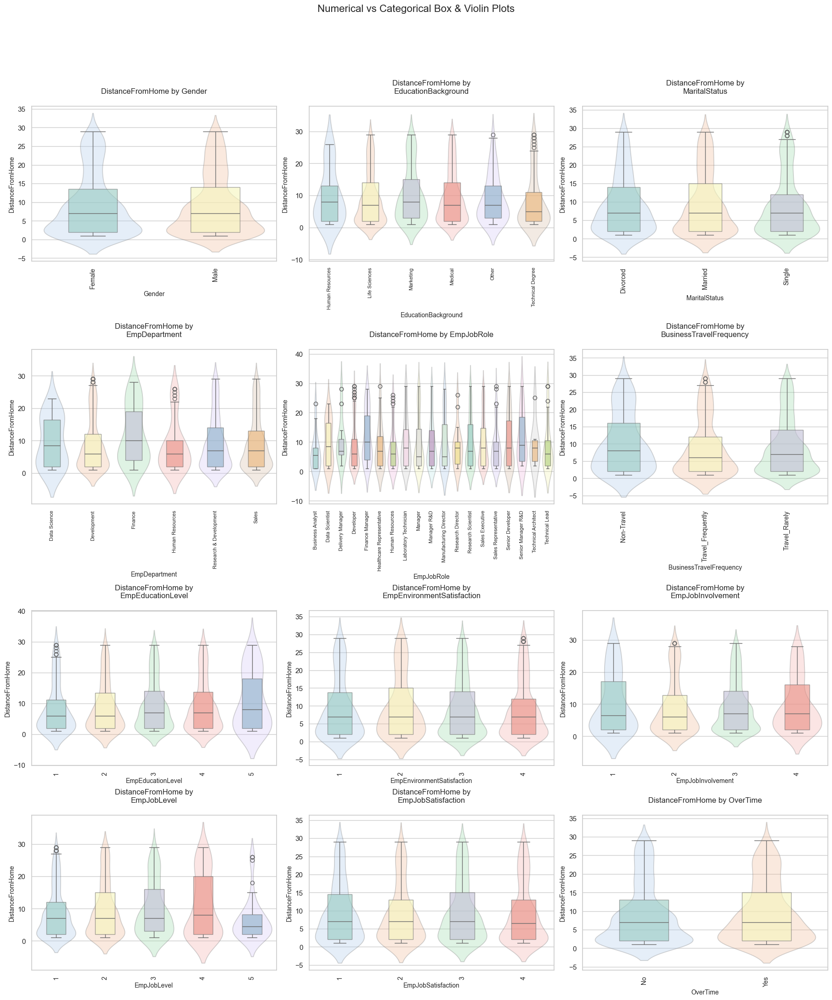

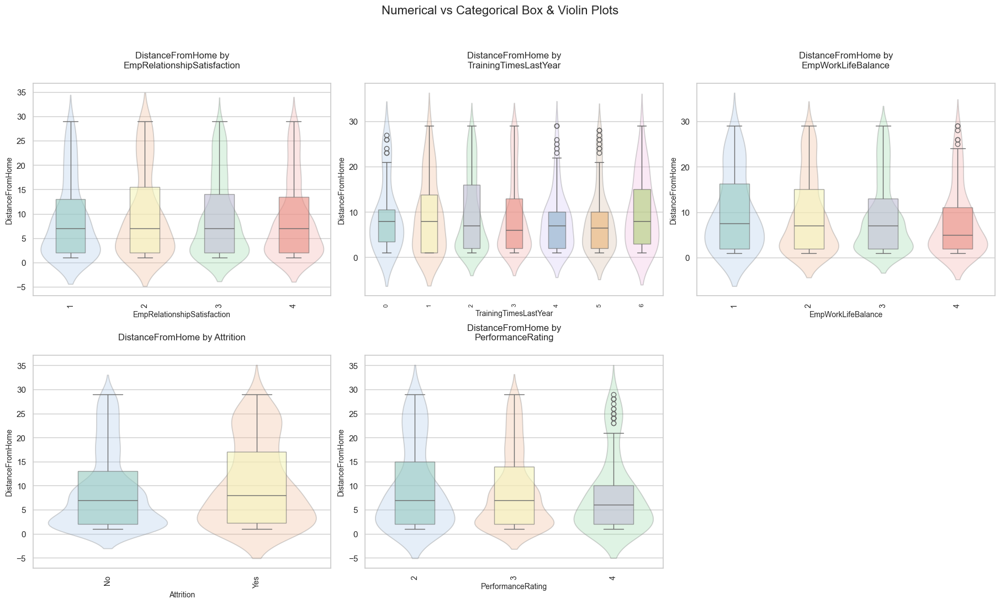

In [35]:
num_vs_cat_box_violin_pair_batch(data, pair_num=1, batch_num=1)
num_vs_cat_box_violin_pair_batch(data, pair_num=1, batch_num=2)

The violin plots for distance from home reveal a few standout relationships. Attrition is clearly influenced by distance—employees who left tend to live farther away, with a median above 10 km, while those who stayed are mostly within 5 km. Similarly, those with performance ratings of 4 tend to live closer to work, with the tightest distance distribution. In contrast, employees rated 2 show a broader and higher distance spread. Among overtime workers, the range is slightly wider compared to non-overtime staff, indicating that some may be enduring longer commutes in addition to extended hours. Across marital statuses, singles and married employees appear more locally based, while divorced employees show a wider spread. Education level and work-life balance don’t show much change, but higher environment or job satisfaction levels coincide with shorter travel distances. Interestingly, job roles and departments don't drastically alter this variable, suggesting that commute burden is a personal factor rather than a job-specific one. Overall, longer distances from home subtly correlate with higher attrition and lower performance, hinting that commuting stress could influence engagement and output.

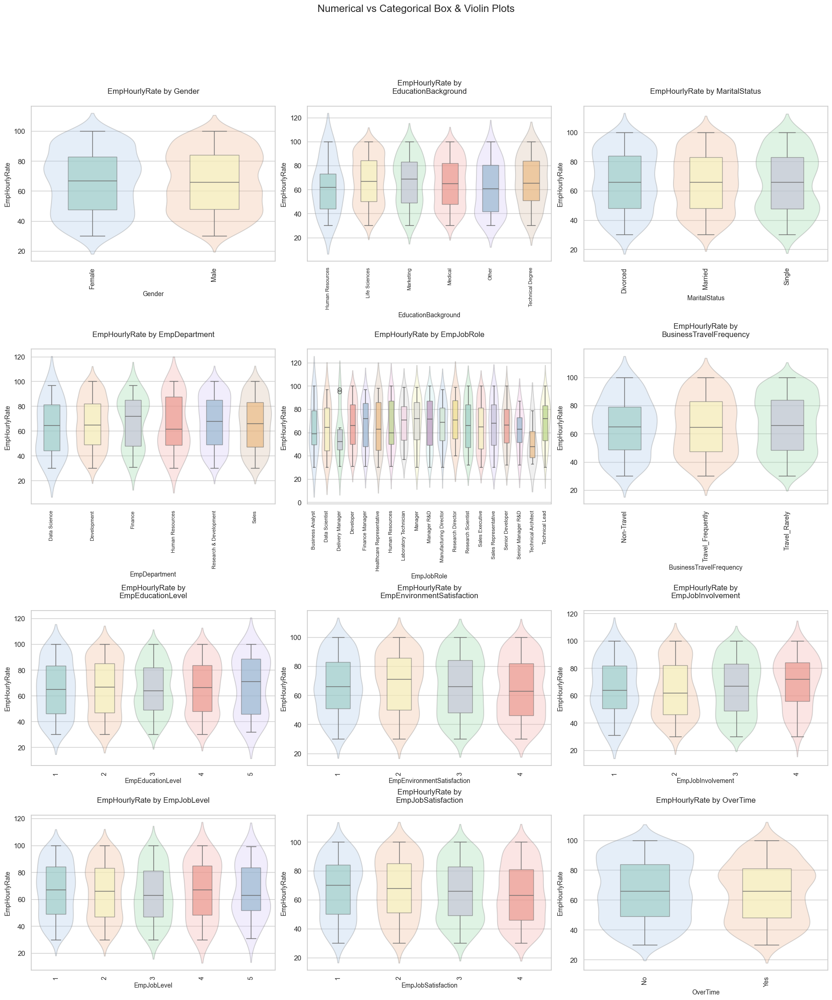

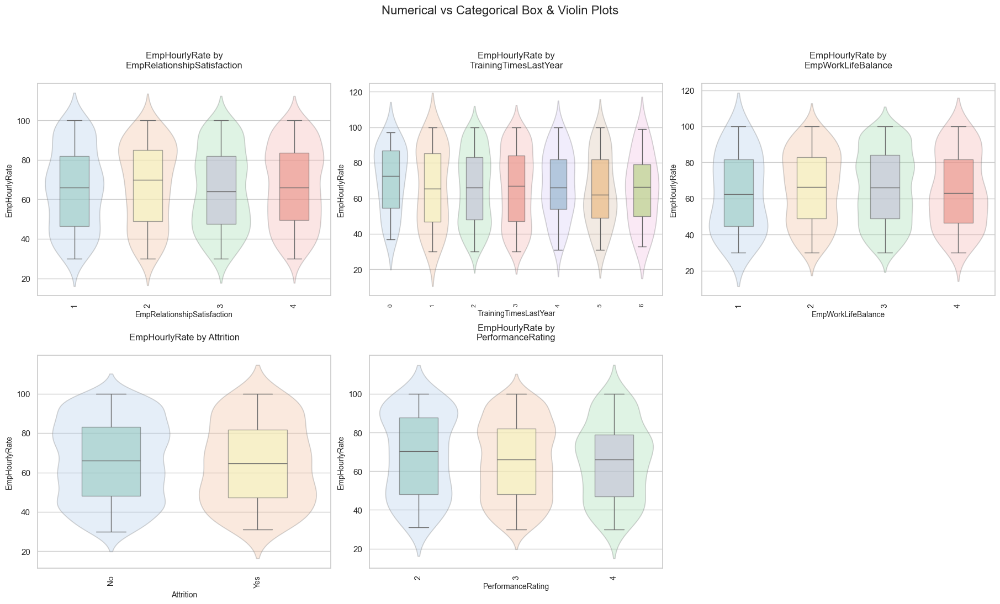

In [36]:
num_vs_cat_box_violin_pair_batch(data, pair_num=2, batch_num=1)
num_vs_cat_box_violin_pair_batch(data, pair_num=2, batch_num=2)

The hourly rate distribution shows a relatively even spread across most categories but with some distinct shifts. Gender-wise, males and females earn similarly on average, but males have a slightly wider range with more at the higher end. Among education backgrounds, those with Technical Degrees and Medical backgrounds tend to command higher hourly rates. Single and married employees show broader and higher spreads than divorced employees. Within departments, Data Science and Finance display slightly higher median rates, while Human Resources remains at the lower end. Roles such as Technical Architect and Research Director show pronounced peaks at the top, while roles like Sales Representative or HR see tighter, lower distributions.

Employees with higher environment or job satisfaction also show a tendency toward better pay, though the difference isn't extreme. Higher job levels and education levels push the distribution upward, as expected. Interestingly, those who don’t work overtime tend to earn slightly more than those who do, suggesting overtime may not be tied to higher pay. In terms of attrition, those who left had a slightly more compressed pay distribution, though with a similar median. Lastly, those with Rating 2 (lower performers) show a heavier concentration in the higher hourly rate zone than those rated 4, which could imply that pay doesn't always align directly with top performance. Overall, while hourly rate isn't the most decisive factor for performance or retention, certain job roles, education backgrounds, and satisfaction scores do lean toward better compensation.

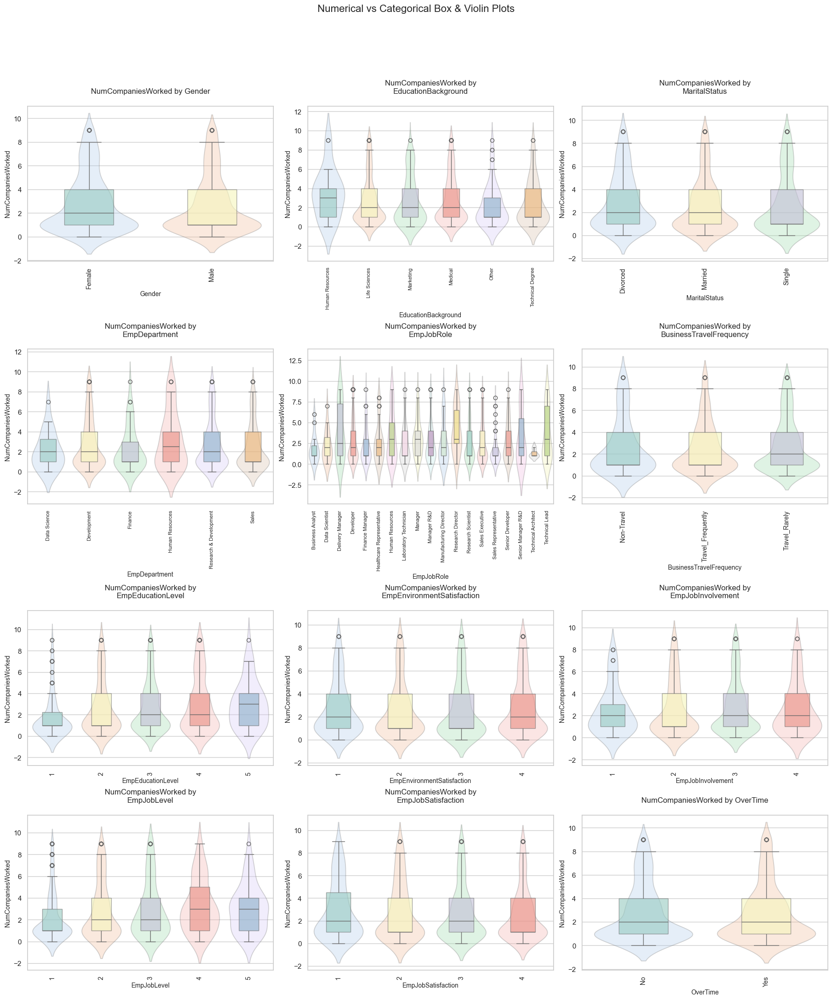

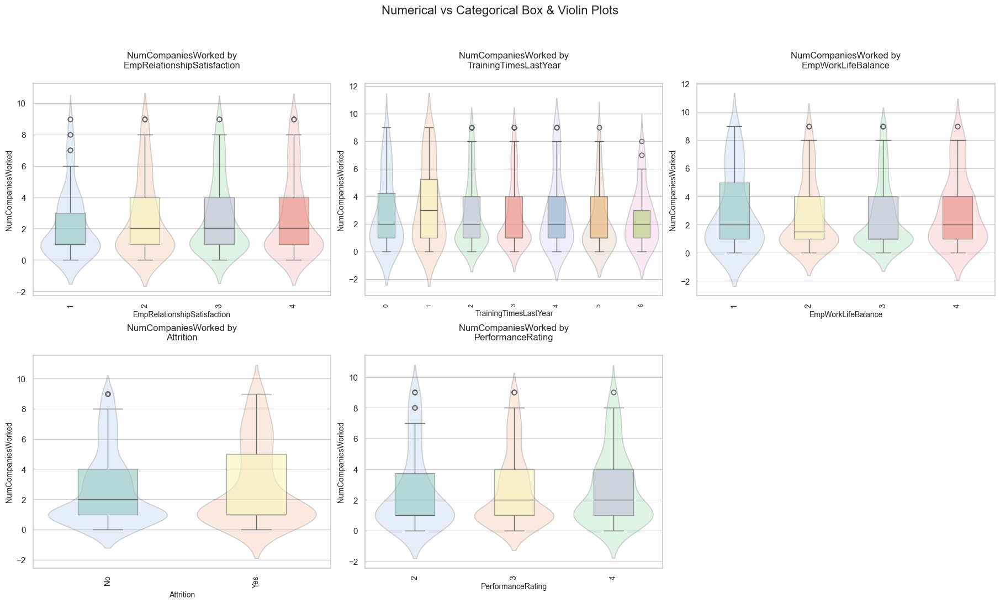

In [37]:
num_vs_cat_box_violin_pair_batch(data, pair_num=3, batch_num=1)
num_vs_cat_box_violin_pair_batch(data, pair_num=3, batch_num=2)

The number of companies worked shows notable variation tied to several factors. Employees who left the organization (Attrition = Yes) tend to have higher counts—often 3 or more—with some reaching 9–10, compared to those who stayed, whose median is closer to 2. This suggests job-hopping behavior might signal disengagement or lower loyalty. Across departments and roles, the spread is relatively consistent, but technical and leadership roles like Technical Lead or Architect display wider variance, possibly reflecting more experience-based movement. Education level and job level both show slightly increasing medians with higher levels, implying seniority often comes with a richer employment history. Those with low environment or relationship satisfaction also report more companies, possibly reflecting dissatisfaction as a driver of movement. Interestingly, those who received fewer training sessions also show higher counts, hinting that lack of development may push job changes. Performance ratings don’t show drastic differences, but those rated 2 (Good) lean slightly higher in job changes than those rated 4 (Outstanding). Overall, this variable acts as a subtle signal—higher company turnover aligns with attrition and possibly stagnation in engagement or career development.

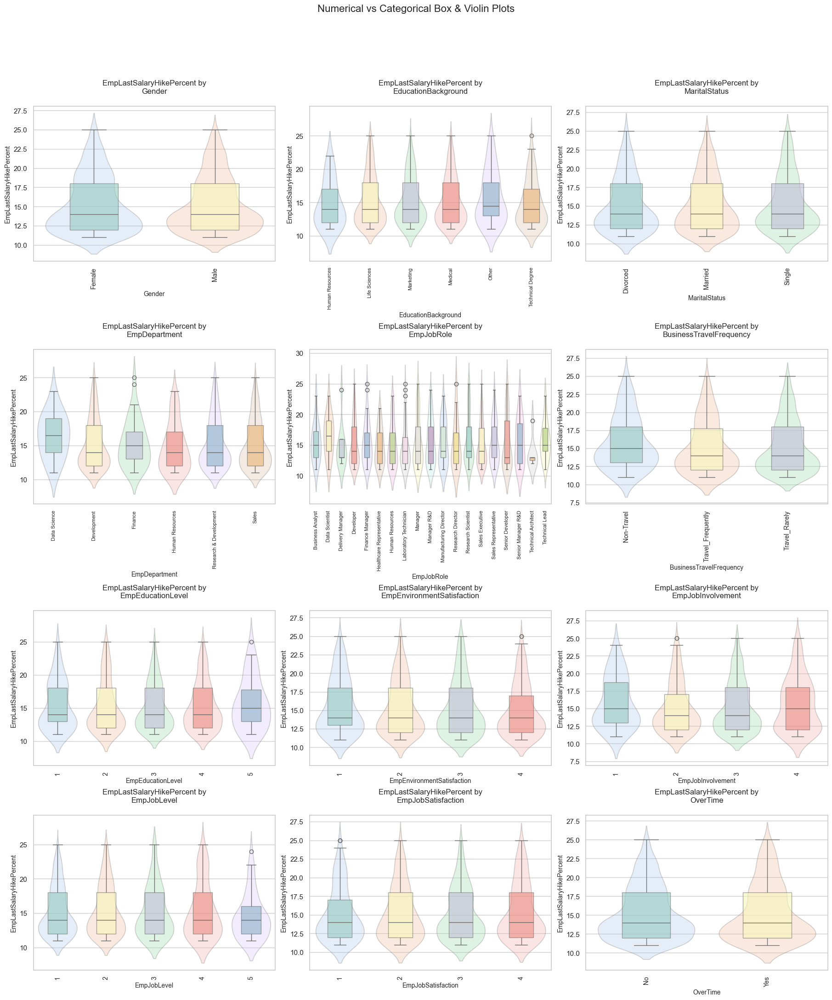

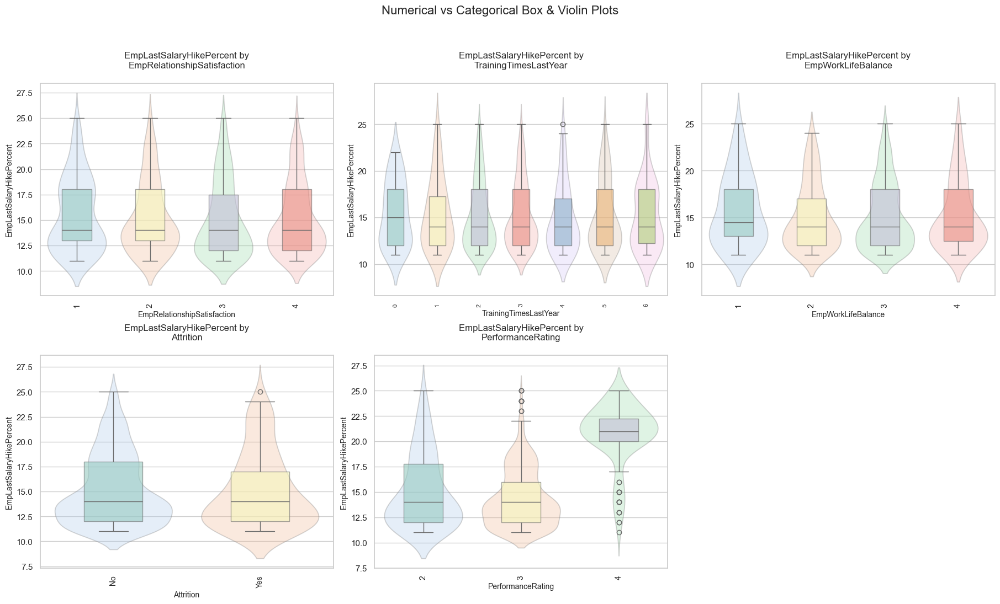

In [38]:
num_vs_cat_box_violin_pair_batch(data, pair_num=4, batch_num=1)
num_vs_cat_box_violin_pair_batch(data, pair_num=4, batch_num=2)

Salary hike patterns show that most employees receive moderate increases, but those with a performance rating of 4 receive significantly higher hikes—mostly above 20%, with little overlap with the lower groups. Rating 3 employees center around 13–15%, and Rating 2 are tightly grouped near the minimum of 11%. Attrition is also tied to this—those who left had a tighter, slightly lower hike range than those who stayed, suggesting lack of reward might trigger exits. No major shifts appear across gender, education, marital status, or department, but roles like Technical Architect or Data Scientist show slightly higher hikes in some cases. Higher education and job levels show more generous hikes on average, but the spread remains consistent. OverTime workers don't receive noticeably more—those working extra hours actually have a more compressed hike range. Higher satisfaction—especially in job and environment categories—aligns with a wider and slightly elevated salary distribution. The clearest takeaway is the direct link between performance and salary reward, reinforcing that hike percentage serves as a performance proxy and may help retain top talent if distributed strategically.

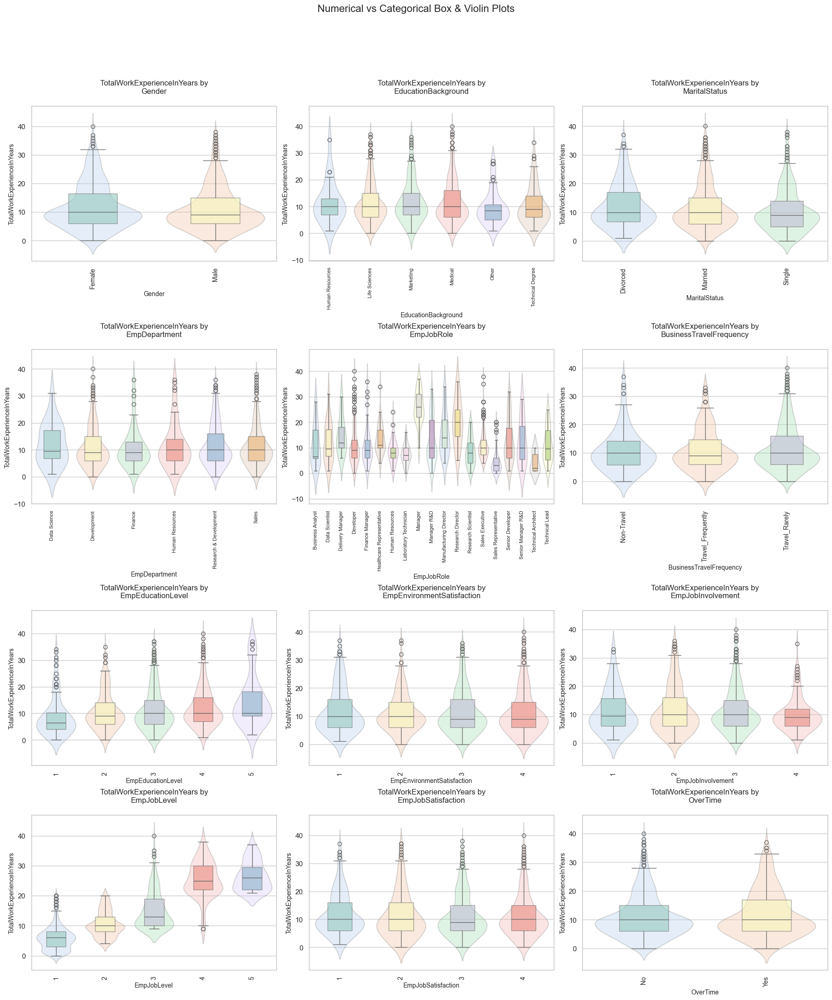

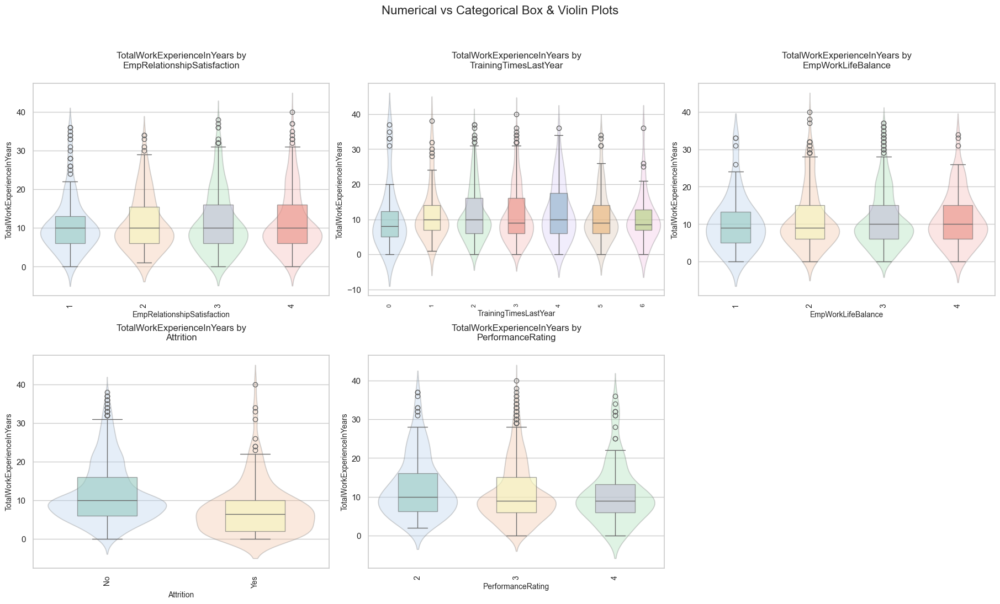

In [39]:
num_vs_cat_box_violin_pair_batch(data, pair_num=5, batch_num=1)
num_vs_cat_box_violin_pair_batch(data, pair_num=5, batch_num=2)

Experience trends follow expected seniority layers—employees with 20+ years are mostly found among non-attrition cases, supporting the idea that long-tenured individuals are more likely to stay. Those who exited are clustered below 10 years, with fewer reaching the upper spectrum. Work experience rises steadily with job level and education level, where levels 4 and 5 show medians beyond 15 years. Departmental patterns are more spread out, but R&D and Data Science roles exhibit higher experience density. EducationBackground influences this as well, with technical degrees and PhDs leaning toward higher bands. Among rating categories, Performance 3 appears to have the widest spread, though top-rated employees (rating 4) have a more compressed distribution, possibly suggesting a high-performing, mid-experience group. WorkLifeBalance and Satisfaction scores don’t change the distribution significantly. The contrast between overtimers and others is also subtle—both show overlapping distributions. Across roles, job titles like Senior Developer, Architect, and Delivery Manager sit higher on the age-curve, reflecting the maturity those roles demand. Overall, TotalWorkExperience serves as a foundational indicator of career depth and correlates positively with retention and advancement, though high experience alone doesn't guarantee a high rating.

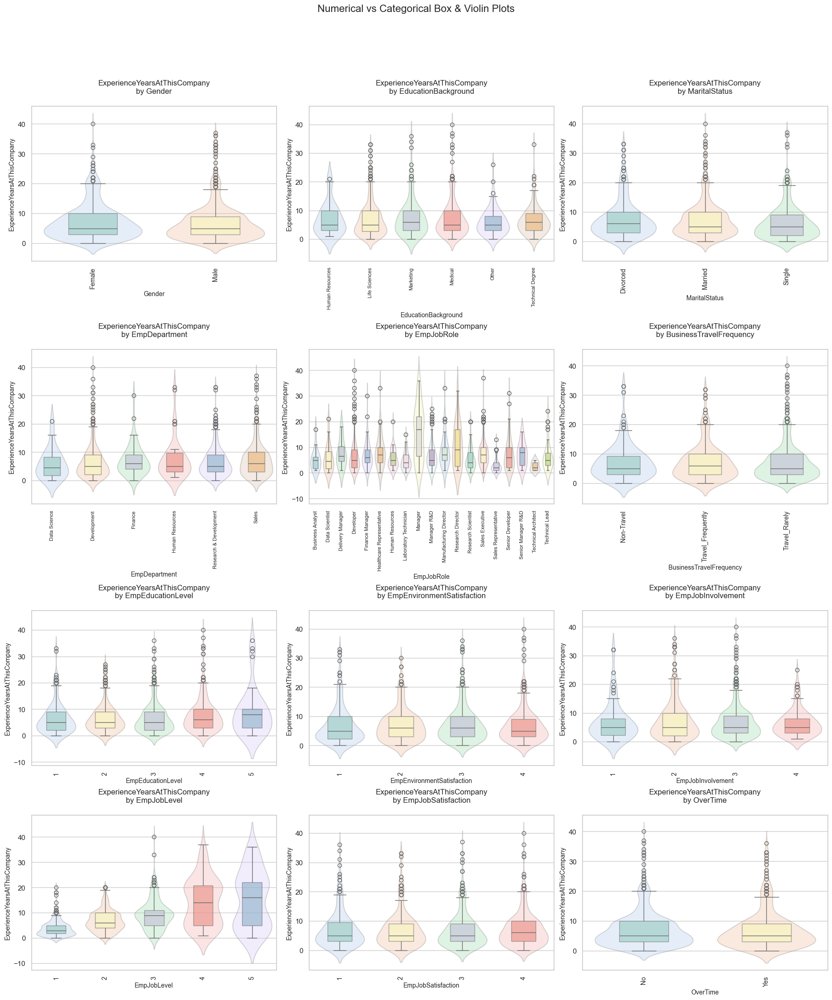

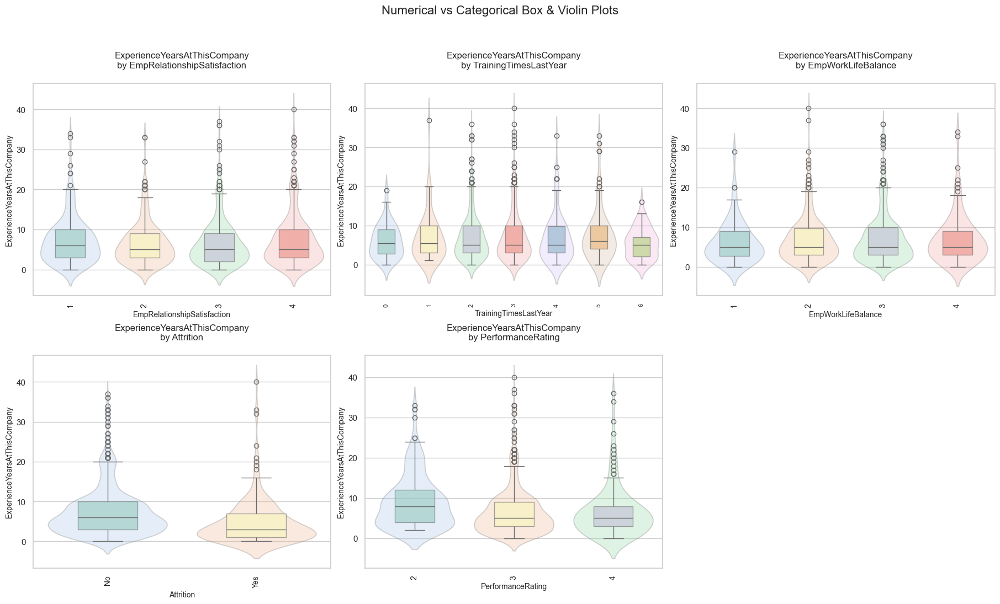

In [40]:
num_vs_cat_box_violin_pair_batch(data, pair_num=6, batch_num=1)
num_vs_cat_box_violin_pair_batch(data, pair_num=6, batch_num=2)

Experience at the company peaks around 5 years, with most employees falling between 2 and 10 years. Males show slightly longer tenure than females. Departments like Finance and R&D have broader experience spreads, while Data Science and HR cluster near lower values. Roles such as Manager R&D and Senior Developer have higher medians (around 10+ years), whereas Data Scientists and Business Analysts typically stay under 5. Employees with PerformanceRating 2 have the highest median experience (~9 years), compared to Rating 3 (~6 years) and Rating 4 (~5 years), suggesting longer tenure doesn't always mean higher performance. Attrition is higher among those with less than 5 years, pointing to early exits. Satisfaction, involvement, and overtime show clear splits—high satisfaction and low overtime often align with longer tenure.

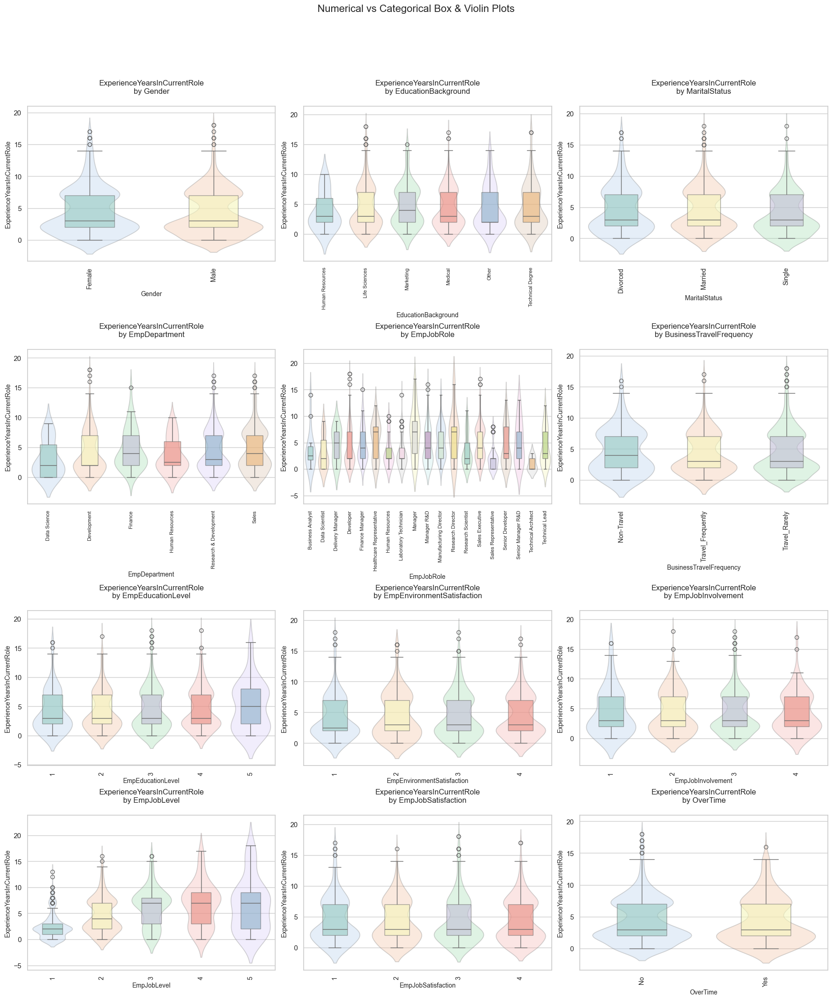

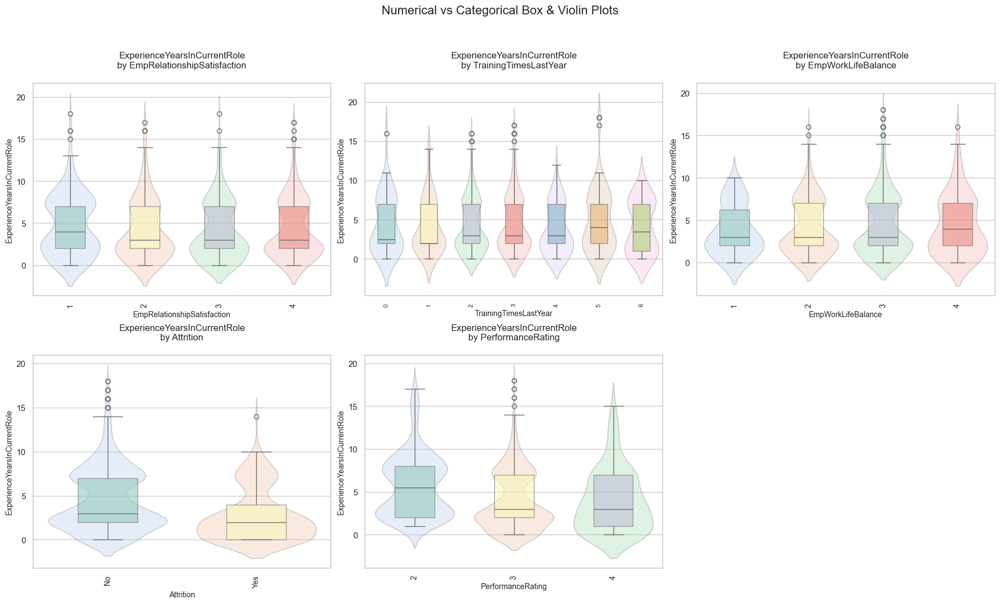

In [41]:
num_vs_cat_box_violin_pair_batch(data, pair_num=7, batch_num=1)
num_vs_cat_box_violin_pair_batch(data, pair_num=7, batch_num=2)

Experience in current role typically falls between 2 and 7 years. Job roles like Manager R&D and Technical Lead show longer medians, often above 8 years, while Data Scientist and Business Analyst stay under 4 years. R&D and Finance departments lean toward higher role tenure, compared to Sales and Data Science. Job levels 4 and 5 are clearly associated with longer experience, frequently crossing 10 years. Employees with no overtime and those reporting best work-life balance tend to hold roles longer. Those rated as Performance 2 have the highest role experience, close to 7 years, whereas Performance 4 is concentrated near 4 years. Employees who left the company generally held their role for less than 3 years, compared to higher, broader distributions among those who stayed.










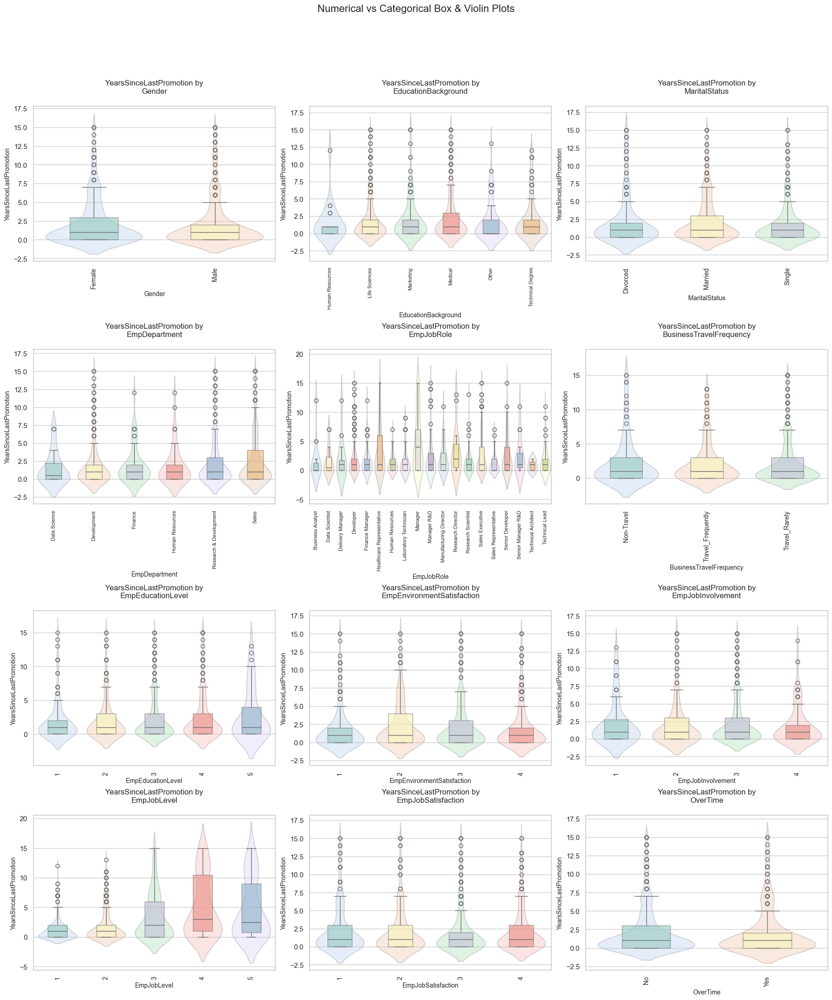

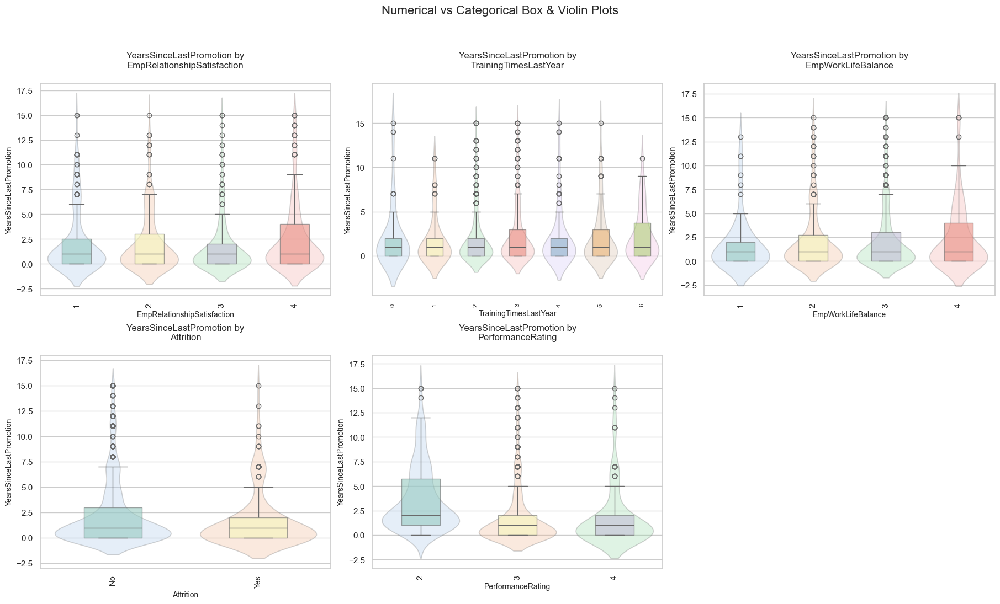

In [42]:
num_vs_cat_box_violin_pair_batch(data, pair_num=8, batch_num=1)
num_vs_cat_box_violin_pair_batch(data, pair_num=8, batch_num=2)

Time since last promotion is concentrated between 0 and 3 years, with the median at 1 year. Males and females show similar patterns. Departments like Finance and R&D have longer gaps compared to HR or Data Science. Roles like Senior Manager R&D and Technical Architect often go 5 or more years without promotion, while newer or lower-tier roles have shorter intervals. Employees in higher job levels, especially level 4 and 5, display wider gaps, often reaching 7 to 10 years. PerformanceRating 2 is linked to longer promotion gaps, averaging around 3 years, while Rating 3 and 4 are closer to 1. Employees who left the company generally show longer delays, confirming delayed promotion as a potential attrition trigger. Better work-life balance and higher satisfaction are weakly linked to shorter gaps, but the clearest pattern ties timely promotion with higher performance and retention.

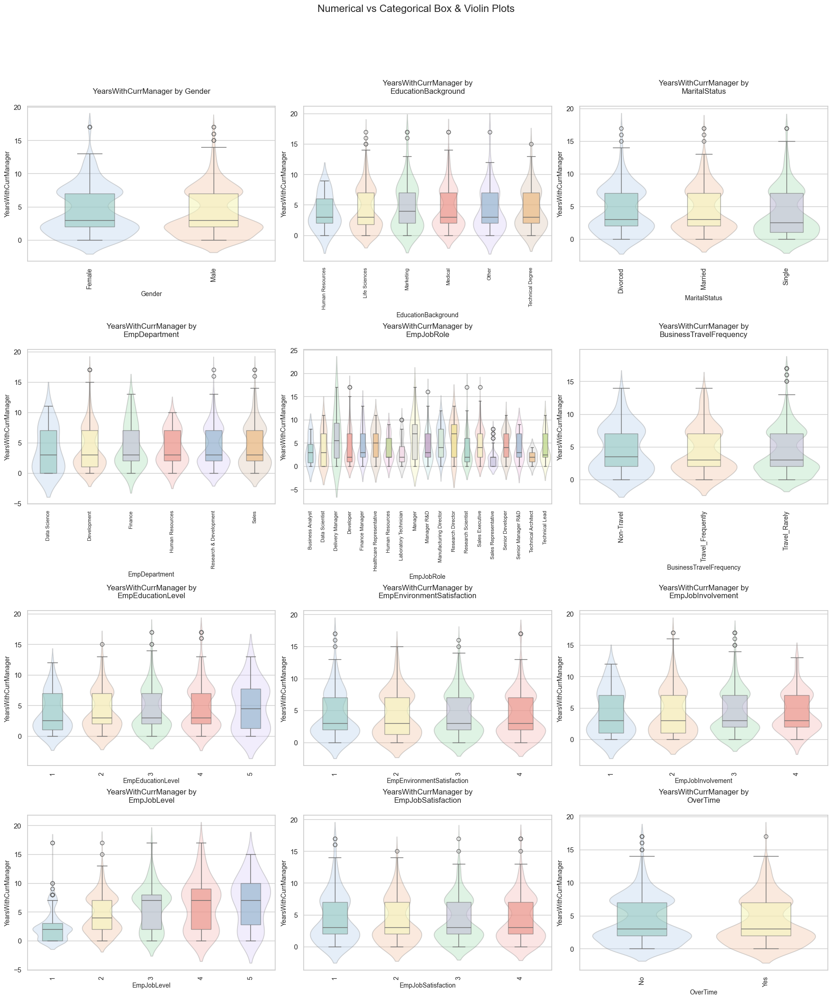

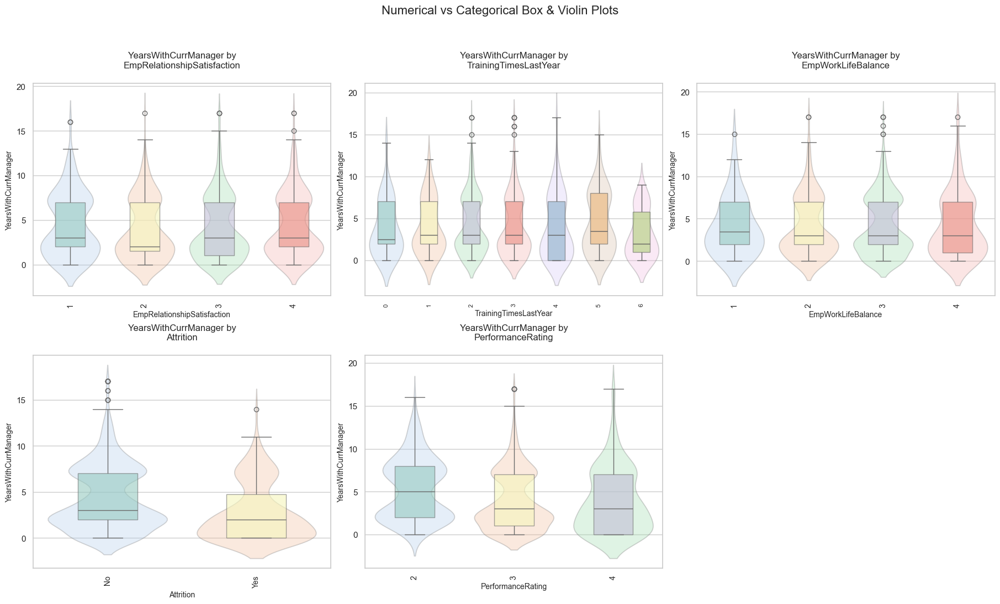

In [43]:
num_vs_cat_box_violin_pair_batch(data, pair_num=9, batch_num=1)
num_vs_cat_box_violin_pair_batch(data, pair_num=9, batch_num=2)

Time with current manager mostly spans 2 to 7 years, with a median near 4. Males and females show similar patterns. Departments like R&D and Finance show slightly longer durations, while Sales is centered lower. Roles such as Technical Lead and Senior Manager R&D reflect higher manager continuity, often exceeding 10 years. Employees in higher job levels tend to stay longer with the same manager, especially level 5. Those rated Performance 2 show the longest durations with managers, averaging 6 to 7 years, while Rating 4 groups are closer to 3. Attrition is associated with lower values—those who left usually spent less than 4 years with the same manager. Stronger work-life balance, satisfaction, and lack of overtime align with longer managerial relationships, hinting that manager stability may play a role in retention and perceived performance.

----

# outliers

In [44]:
data_outlier_summary, data_non_outlier_summary = comp_num_analysis(data, outlier_df=True)
print(data_outlier_summary.shape)

(6, 31)


In [45]:
data_outlier_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Min,Q1,50% (Median),Q3,Max,Mode,Range,IQR,Lower Bound,Upper Bound,Total Distinct,Outliers Distinct,Outliers Count,Outliers %,Negative Count,Negative Distinct,Negative %,Mean,Variance,Std,Skewness,Kurtosis,Normality Test,Normality Statistic,Normality p-value
9,24,YearsWithCurrManager,int64,1200,0.0,18,0,2.0,3.0,7.0,17,2,17,5.0,-5.5,14.5,18,3,11,0.916667,0,0,0.0,4.105000,12.542761,3.541576,0.812141,0.142589,Shapiro-Wilk,0.898841,2.100966e-27
7,22,ExperienceYearsInCurrentRole,int64,1200,0.0,19,0,2.0,3.0,7.0,18,2,18,5.0,-5.5,14.5,19,4,16,1.333333,0,0,0.0,4.291667,13.059147,3.613744,0.887048,0.431210,Shapiro-Wilk,0.899941,2.825748e-27
3,14,NumCompaniesWorked,int64,1200,0.0,10,0,1.0,2.0,4.0,9,1,9,3.0,-3.5,8.5,10,1,39,3.250000,0,0,0.0,2.665000,6.097857,2.469384,1.047324,0.063581,Shapiro-Wilk,0.846337,1.456464e-32
5,18,TotalWorkExperienceInYears,int64,1200,0.0,40,0,6.0,10.0,15.0,40,10,40,9.0,-7.5,28.5,40,11,51,4.250000,0,0,0.0,11.330000,60.796764,7.797228,1.085503,0.797285,Shapiro-Wilk,0.910346,5.310638e-26
6,21,ExperienceYearsAtThisCompany,int64,1200,0.0,37,0,3.0,5.0,10.0,40,5,40,7.0,-7.5,20.5,37,16,56,4.666667,0,0,0.0,7.077500,38.898910,6.236899,1.786818,4.036075,Shapiro-Wilk,0.836011,2.082192e-33
8,23,YearsSinceLastPromotion,int64,1200,0.0,16,0,0.0,1.0,3.0,15,0,15,3.0,-4.5,7.5,16,8,88,7.333333,0,0,0.0,2.194167,10.378448,3.221560,1.972462,3.519355,Shapiro-Wilk,0.704590,1.436331e-41


Most numeric columns show right-skewed distributions with some noticeable outliers. For example, YearsWithCurrManager has 11 outliers, all above 14.5 years, with a range of 17 and median at 3. ExperienceYearsInCurrentRole shows a similar pattern—16 outliers above 14.5 years, median at 3, and range of 18. YearsSinceLastPromotion is more extreme, with 88 outliers beyond 7.5 years, despite a median of 1. The highest outlier rate is found in ExperienceYearsAtThisCompany, where 56 employees exceed the upper bound of 20.5 years. Despite these values being within possible limits, they may represent senior profiles or edge cases needing special attention. None of the columns have negative values or missing data, and all fail normality tests with p-values less than 0.05, confirming non-normal, skewed distributions. These outliers and distributions need consideration during scaling and model preparation.

# Relation

In [46]:
data_normal_df, data_not_normal_df = normality_test_with_skew_kurt(data)


Normal Columns (p > 0.05):


,Column,Test,Statistic,p_value,Skewness,Kurtosis



Not Normal Columns (p ≤ 0.05) - Sorted from Near Normal to Not Normal:


,Column,Test,Statistic,p_value,Skewness,Kurtosis
0,Age,Shapiro-Wilk,0.979036,3.557677e-12,0.383665,-0.434202
2,EmpHourlyRate,Shapiro-Wilk,0.955943,1.545036e-18,-0.035121,-1.186947
5,TotalWorkExperienceInYears,Shapiro-Wilk,0.910346,5.310638e-26,1.085503,0.797285
4,EmpLastSalaryHikePercent,Shapiro-Wilk,0.904184,9.072310e-27,0.807642,-0.303489
7,ExperienceYearsInCurrentRole,Shapiro-Wilk,0.899941,2.825748e-27,0.887048,0.431210
9,YearsWithCurrManager,Shapiro-Wilk,0.898841,2.100966e-27,0.812141,0.142589
1,DistanceFromHome,Shapiro-Wilk,0.857049,1.225987e-31,0.961752,-0.246005
3,NumCompaniesWorked,Shapiro-Wilk,0.846337,1.456464e-32,1.047324,0.063581
6,ExperienceYearsAtThisCompany,Shapiro-Wilk,0.836011,2.082192e-33,1.786818,4.036075
8,YearsSinceLastPromotion,Shapiro-Wilk,0.704590,1.436331e-41,1.972462,3.519355



Variables Exhibiting Multicollinearity (|Correlation| > 0.80):
- ExperienceYearsInCurrentRole & ExperienceYearsAtThisCompany: Correlation=0.8698
- YearsWithCurrManager & ExperienceYearsAtThisCompany: Correlation=0.8404


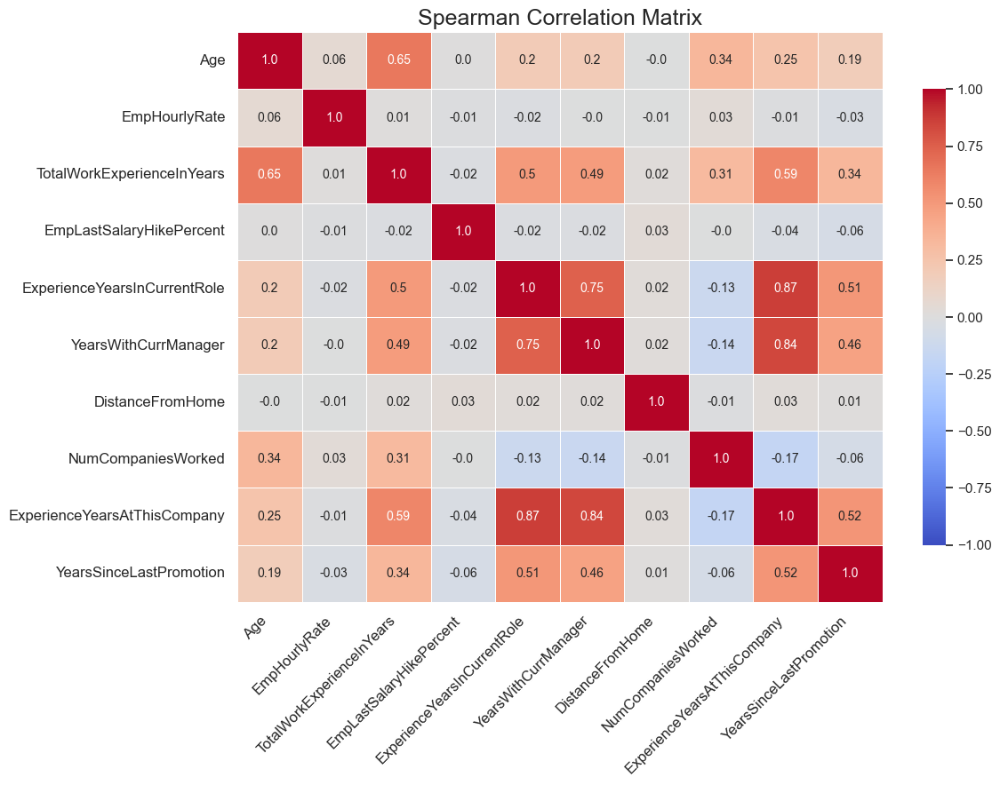

In [47]:
spearman_correlation(data, data_not_normal_df, exclude_target='PerformanceRating', multicollinearity_threshold=0.8)

Strong positive correlations are seen between ExperienceYearsInCurrentRole and ExperienceYearsAtThisCompany (0.87), and also between YearsWithCurrManager and ExperienceYearsAtThisCompany (0.84), indicating multicollinearity. These variables largely overlap in what they measure—tenure within the company or under one manager—so including all three in a model may cause redundancy. TotalWorkExperienceInYears shows good positive links with both age (0.65) and company experience (0.59), supporting its use as a seniority indicator. Other features like DistanceFromHome and EmpHourlyRate have negligible relationships with the rest. Normality tests confirm none of the numerical variables follow a normal distribution; all have skewness and kurtosis, with YearsSinceLastPromotion being the most skewed and heavy-tailed. These patterns point toward the need for transformation or robust models that can handle non-normal, skewed data.

----

next in data_preprocess, the data will be cleaned, structured, and ready for model training.

### Import data

In [48]:
# Load the Excel file
file_path = r"D:\INX_Future_Employee_Performance_Project\data\processed\INX_Future_Inc_Employee_Performance_CDS_Project2_Data_V1.8.xlsx"
data = pd.read_excel(file_path)

### Basic checks and understand the data

---

In [49]:
print(data.shape)
for idx, col in enumerate(data.columns):
        print(f"{idx}: {col}")

(1200, 28)
0: EmpNumber
1: Age
2: Gender
3: EducationBackground
4: MaritalStatus
5: EmpDepartment
6: EmpJobRole
7: BusinessTravelFrequency
8: DistanceFromHome
9: EmpEducationLevel
10: EmpEnvironmentSatisfaction
11: EmpHourlyRate
12: EmpJobInvolvement
13: EmpJobLevel
14: EmpJobSatisfaction
15: NumCompaniesWorked
16: OverTime
17: EmpLastSalaryHikePercent
18: EmpRelationshipSatisfaction
19: TotalWorkExperienceInYears
20: TrainingTimesLastYear
21: EmpWorkLifeBalance
22: ExperienceYearsAtThisCompany
23: ExperienceYearsInCurrentRole
24: YearsSinceLastPromotion
25: YearsWithCurrManager
26: Attrition
27: PerformanceRating


In [50]:
data.head().T

,0,1,2,3,4
EmpNumber,E1001000,E1001006,E1001007,E1001009,E1001010
Age,32,47,40,41,60
Gender,Male,Male,Male,Male,Male
EducationBackground,Marketing,Marketing,Life Sciences,Human Resources,Marketing
MaritalStatus,Single,Single,Married,Divorced,Single
EmpDepartment,Sales,Sales,Sales,Human Resources,Sales
EmpJobRole,Sales Executive,Sales Executive,Sales Executive,Manager,Sales Executive
BusinessTravelFrequency,Travel_Rarely,Travel_Rarely,Travel_Frequently,Travel_Rarely,Travel_Rarely
DistanceFromHome,10,14,5,10,16
EmpEducationLevel,3,4,4,4,4


Missing Values Summary:
No missing values found.

Infinite Values Summary:
No infinite values found.

Number of duplicate rows: 0



<Figure size 2000x800 with 0 Axes>

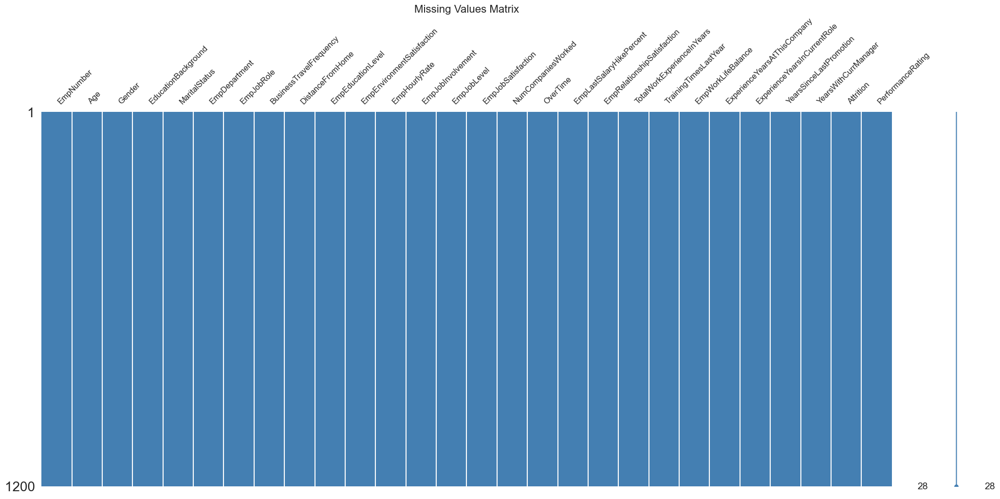

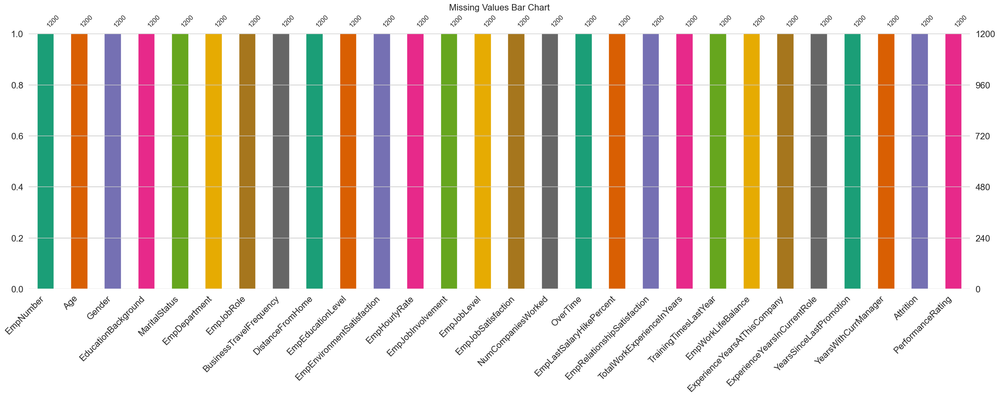

In [51]:
missing_inf_values(data)
print(f"\nNumber of duplicate rows: {data.duplicated().sum()}\n")
duplicates = data[data.duplicated()]
duplicates
show_missing(data)

In [52]:
data_negative_values = data.select_dtypes(include=[np.number]).lt(0).sum()
data_negative_values = data_negative_values[data_negative_values > 0].sort_values(ascending=False)
print("Columns with Negative Values (Sorted):\n", data_negative_values)

Columns with Negative Values (Sorted):
 Series([], dtype: int64)


The dataset is fully intact, with no missing, infinite, or duplicate values across all 1200 records and 28 features. Each row is unique, ensuring high data integrity. Sample entries show a variety of backgrounds, departments, and performance scores, confirming diversity in roles and attributes. No additional cleaning is required at this stage, making the data immediately suitable for further analysis, modeling, and feature engineering.

# Preprocessing

---

## Data types transformation

In [53]:
columns_info("Dataset Overview", data)


======== Dataset Overview: ===========

Index Col Index  Attribute                      Data Type       Range                          Distinct Count
----- ---------- ------------------------------ --------------- ------------------------------ ---------------
1     1          Age                            int64           18 - 60                        43
2     8          DistanceFromHome               int64           1 - 29                         29
3     9          EmpEducationLevel              int64           1 - 5                          5
4     10         EmpEnvironmentSatisfaction     int64           1 - 4                          4
5     11         EmpHourlyRate                  int64           30 - 100                       71
6     12         EmpJobInvolvement              int64           1 - 4                          4
7     13         EmpJobLevel                    int64           1 - 5                          5
8     14         EmpJobSatisfaction             int64   

In [54]:
data = data.drop('EmpNumber', axis=1)
categorical_features = [
    'EmpEducationLevel', 'EmpEnvironmentSatisfaction', 'EmpJobInvolvement',
    'EmpJobLevel', 'EmpJobSatisfaction', 'EmpRelationshipSatisfaction',
    'EmpWorkLifeBalance', 'PerformanceRating', 'TrainingTimesLastYear'
]
for col in categorical_features:
    data[col] = data[col].astype('category')
# Convert object types to categorical where appropriate
object_features = [
    'Gender', 'EducationBackground', 'MaritalStatus', 'EmpDepartment',
    'EmpJobRole', 'BusinessTravelFrequency', 'OverTime', 'Attrition'
]
for col in object_features:
    data[col] = data[col].astype('category')

In [55]:
columns_info("Dataset Overview", data)


======== Dataset Overview: ===========

Index Col Index  Attribute                      Data Type       Range                          Distinct Count
----- ---------- ------------------------------ --------------- ------------------------------ ---------------
1     1          Gender                         category        N/A                            2
2     2          EducationBackground            category        N/A                            6
3     3          MaritalStatus                  category        N/A                            3
4     4          EmpDepartment                  category        N/A                            6
5     5          EmpJobRole                     category        N/A                            19
6     6          BusinessTravelFrequency        category        N/A                            3
7     8          EmpEducationLevel              category        N/A                            5
8     9          EmpEnvironmentSatisfaction     category  

In [56]:
analyze_data(data)





















=== Numerical Analysis ===
|    | Variable                     |    N |    Mean |      SD |     SE |   95% Conf. |   Interval |
|---:|:-----------------------------|-----:|--------:|--------:|-------:|------------:|-----------:|
|  0 | Age                          | 1200 | 36.9183 |  9.0873 | 0.2623 |     36.4037 |    37.433  |
|  1 | DistanceFromHome             | 1200 |  9.1658 |  8.1766 | 0.236  |      8.7027 |     9.6289 |
|  2 | EmpHourlyRate                | 1200 | 65.9817 | 20.2113 | 0.5835 |     64.837  |    67.1264 |
|  3 | NumCompaniesWorked           | 1200 |  2.665  |  2.4694 | 0.0713 |      2.5251 |     2.8049 |
|  4 | EmpLastSalaryHikePercent     | 1200 | 15.2225 |  3.6259 | 0.1047 |     15.0171 |    15.4279 |
|  5 | TotalWorkExperienceInYears   | 1200 | 11.33   |  7.7972 | 0.2251 |     10.8884 |    11.7716 |
|  6 | ExperienceYearsAtThisCompany | 1200 |  7.0775 |  6.2369 | 0.18   |      6.7243 |     7.4307 |
|  7 | ExperienceYearsInCurrentRole | 1200 |

The data has been successfully transformed for modeling. All categorical features, including encoded ordinal scores and string-based descriptors, are now correctly cast as category types. Irrelevant identifier EmpNumber has been removed to avoid noise. The final structure has 18 categorical and 10 numerical features.

On the numerical side, Age averages around 37, with typical ranges for experience (TotalWorkExperience ≈ 11.3 years, ExperienceAtCompany ≈ 7.1). Variables like YearsSinceLastPromotion and NumCompaniesWorked are right-skewed, and EmpHourlyRate has a wide spread from 30 to 100.

Categorical insights show a workforce dominated by males (60.42%), Life Sciences backgrounds (41%), and roles like Sales Executive (22.5%) and Developer (19.67%). Most employees rarely travel (70.5%) and do not work overtime (70.58%). Performance ratings are imbalanced—73% are rated 3 (Excellent), while ratings 2 and 4 are less common.

This transformation phase prepares the data well for encoding, feature engineering, and modeling steps, ensuring both efficiency and semantic clarity.

## outliers

In [57]:
data_outlier_summary, data_non_outlier_summary = comp_num_analysis(data, outlier_df=True)
print(data_outlier_summary.shape)

(6, 31)


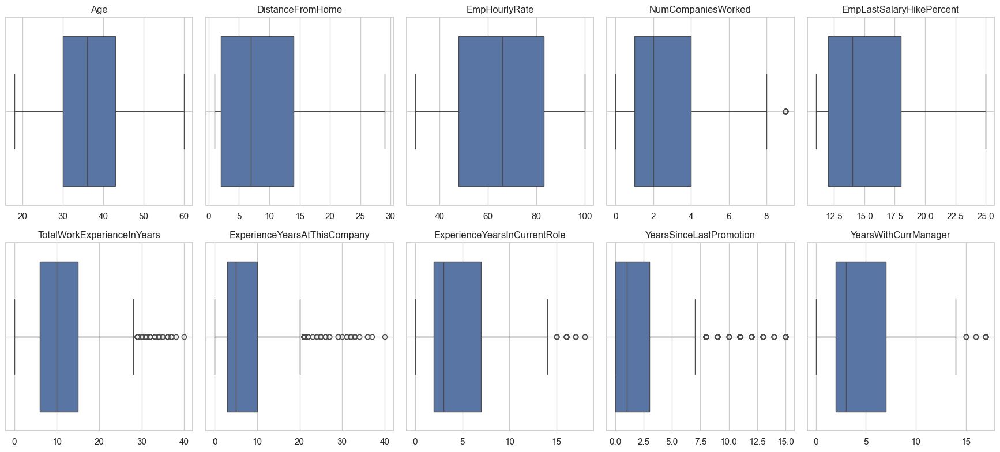

,Skewness,Kurtosis
Age,0.384145,-0.431000
DistanceFromHome,0.962956,-0.242017
EmpHourlyRate,-0.035165,-1.186891
NumCompaniesWorked,1.048635,0.068863
EmpLastSalaryHikePercent,0.808654,-0.299741
TotalWorkExperienceInYears,1.086862,0.805633
ExperienceYearsAtThisCompany,1.789055,4.057959
ExperienceYearsInCurrentRole,0.888159,0.438029
YearsSinceLastPromotion,1.974932,3.539080
YearsWithCurrManager,0.813158,0.148202


In [58]:
plot_boxplots(data)
calculate_skewness_kurtosis(data)

In [59]:
data_outlier_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Min,Q1,50% (Median),Q3,Max,Mode,Range,IQR,Lower Bound,Upper Bound,Total Distinct,Outliers Distinct,Outliers Count,Outliers %,Negative Count,Negative Distinct,Negative %,Mean,Variance,Std,Skewness,Kurtosis,Normality Test,Normality Statistic,Normality p-value
9,24,YearsWithCurrManager,int64,1200,0.0,18,0,2.0,3.0,7.0,17,2,17,5.0,-5.5,14.5,18,3,11,0.916667,0,0,0.0,4.105000,12.542761,3.541576,0.812141,0.142589,Shapiro-Wilk,0.898841,2.100966e-27
7,22,ExperienceYearsInCurrentRole,int64,1200,0.0,19,0,2.0,3.0,7.0,18,2,18,5.0,-5.5,14.5,19,4,16,1.333333,0,0,0.0,4.291667,13.059147,3.613744,0.887048,0.431210,Shapiro-Wilk,0.899941,2.825748e-27
3,14,NumCompaniesWorked,int64,1200,0.0,10,0,1.0,2.0,4.0,9,1,9,3.0,-3.5,8.5,10,1,39,3.250000,0,0,0.0,2.665000,6.097857,2.469384,1.047324,0.063581,Shapiro-Wilk,0.846337,1.456464e-32
5,18,TotalWorkExperienceInYears,int64,1200,0.0,40,0,6.0,10.0,15.0,40,10,40,9.0,-7.5,28.5,40,11,51,4.250000,0,0,0.0,11.330000,60.796764,7.797228,1.085503,0.797285,Shapiro-Wilk,0.910346,5.310638e-26
6,21,ExperienceYearsAtThisCompany,int64,1200,0.0,37,0,3.0,5.0,10.0,40,5,40,7.0,-7.5,20.5,37,16,56,4.666667,0,0,0.0,7.077500,38.898910,6.236899,1.786818,4.036075,Shapiro-Wilk,0.836011,2.082192e-33
8,23,YearsSinceLastPromotion,int64,1200,0.0,16,0,0.0,1.0,3.0,15,0,15,3.0,-4.5,7.5,16,8,88,7.333333,0,0,0.0,2.194167,10.378448,3.221560,1.972462,3.519355,Shapiro-Wilk,0.704590,1.436331e-41


In [60]:
outlier_cols = ["YearsWithCurrManager", "ExperienceYearsInCurrentRole", "NumCompaniesWorked", "TotalWorkExperienceInYears","ExperienceYearsAtThisCompany", "YearsSinceLastPromotion"]
interconnected_outliers_df = interconnected_outliers(data, outlier_cols)


Total Interconnected Outliers: 58
Column Set Outlier Frequency:
  Columns ExperienceYearsAtThisCompany, TotalWorkExperienceInYears, YearsWithCurrManager: 1 times
  Columns TotalWorkExperienceInYears, YearsWithCurrManager: 1 times
  Columns YearsSinceLastPromotion, YearsWithCurrManager: 3 times
  Columns ExperienceYearsAtThisCompany, YearsSinceLastPromotion, YearsWithCurrManager: 1 times
  Columns ExperienceYearsAtThisCompany, YearsWithCurrManager: 1 times
  Columns ExperienceYearsInCurrentRole, YearsSinceLastPromotion, YearsWithCurrManager: 1 times
  Columns ExperienceYearsAtThisCompany, ExperienceYearsInCurrentRole, YearsSinceLastPromotion, YearsWithCurrManager: 1 times
  Columns ExperienceYearsAtThisCompany, ExperienceYearsInCurrentRole: 3 times
  Columns ExperienceYearsAtThisCompany, ExperienceYearsInCurrentRole, YearsSinceLastPromotion: 2 times
  Columns ExperienceYearsInCurrentRole, TotalWorkExperienceInYears, YearsSinceLastPromotion: 1 times
  Columns ExperienceYearsAtThisCompan

Six numerical features contain outliers, with YearsSinceLastPromotion showing the most (88 records, 7.33%). Other significant contributors include ExperienceYearsAtThisCompany (56 outliers) and TotalWorkExperienceInYears (51). Most outliers fall above the upper bound, pointing to longer tenure or delayed promotions rather than data entry issues.

Skewness values are all positive, with strongest skew in YearsSinceLastPromotion (1.97) and ExperienceYearsAtThisCompany (1.79), confirming long right tails. All variables fail the Shapiro-Wilk test (p-values < 0.05), indicating non-normal distributions.

A focused look into interconnected outliers reveals 58 records with multi-column anomalies. The most frequent pattern—15 records—shows high values in both ExperienceYearsAtThisCompany and YearsSinceLastPromotion. Another 11 records show combined outliers in ExperienceYearsAtThisCompany, TotalWorkExperienceInYears, and YearsSinceLastPromotion. These recurring patterns suggest a cluster of long-tenured employees who haven’t been promoted recently, making them prime candidates for closer workforce planning or retention analysis.

In [61]:
interconnected_outliers_df

,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
25,52,Male,Marketing,Married,Sales,Manager,Travel_Rarely,3,4,3,31,2,4,1,1,No,11,1,34,3,4,34,6,1,16,No,4
72,51,Female,Marketing,Married,Sales,Manager,Travel_Rarely,26,4,1,66,3,4,3,2,No,14,3,29,2,2,20,6,4,17,No,3
283,44,Male,Other,Single,Research & Development,Research Scientist,Travel_Rarely,29,4,4,32,3,2,4,1,No,25,2,20,3,3,20,11,13,17,No,4
320,43,Female,Marketing,Single,Sales,Sales Executive,Travel_Rarely,4,4,4,56,2,3,4,3,No,14,4,23,3,4,21,7,15,17,No,3
655,40,Male,Life Sciences,Divorced,Research & Development,Manager R&D,Travel_Rarely,1,4,1,98,3,4,1,2,No,11,1,22,3,3,19,7,11,16,No,2
785,44,Female,Medical,Married,Development,Developer,Travel_Rarely,7,4,1,42,2,3,4,3,No,14,4,24,4,3,22,6,5,17,No,3
864,51,Male,Life Sciences,Single,Development,Developer,Travel_Rarely,6,3,1,51,3,5,3,7,No,13,3,23,5,3,20,18,15,15,No,3
956,42,Male,Technical Degree,Married,Development,Developer,Travel_Rarely,4,2,3,58,3,5,4,1,No,11,4,22,3,3,22,17,11,15,No,3
1083,37,Female,Life Sciences,Divorced,Development,Delivery Manager,Travel_Rarely,14,3,4,95,3,1,1,1,No,12,3,18,2,2,18,7,12,17,No,3
175,41,Female,Life Sciences,Divorced,Research & Development,Research Director,Non-Travel,7,1,2,55,1,5,3,1,No,22,2,21,3,3,21,16,5,10,No,2


In [62]:
# Perform domain-aware sanity checks
sanity_checks = {
    "Promotion vs Company Tenure": data["YearsSinceLastPromotion"] <= data["ExperienceYearsAtThisCompany"],
    "Company Tenure vs Total Experience": data["ExperienceYearsAtThisCompany"] <= data["TotalWorkExperienceInYears"],
    "Manager Tenure vs Company Tenure": data["YearsWithCurrManager"] <= data["ExperienceYearsAtThisCompany"],
    "Current Role Tenure vs Company Tenure": data["ExperienceYearsInCurrentRole"] <= data["ExperienceYearsAtThisCompany"]
}
# Create a DataFrame to track violations
sanity_check_df = pd.DataFrame({name: ~condition for name, condition in sanity_checks.items()})
sanity_check_df["Any Violation"] = sanity_check_df.any(axis=1)
# Count violations
violation_summary = sanity_check_df.sum()
# Extract violating records
violations = data[sanity_check_df["Any Violation"]]
# Output both summary and violating records
violation_summary, violations

(Promotion vs Company Tenure              0
 Company Tenure vs Total Experience       0
 Manager Tenure vs Company Tenure         0
 Current Role Tenure vs Company Tenure    0
 Any Violation                            0
 dtype: int64,
 Empty DataFrame
 Columns: [Age, Gender, EducationBackground, MaritalStatus, EmpDepartment, EmpJobRole, BusinessTravelFrequency, DistanceFromHome, EmpEducationLevel, EmpEnvironmentSatisfaction, EmpHourlyRate, EmpJobInvolvement, EmpJobLevel, EmpJobSatisfaction, NumCompaniesWorked, OverTime, EmpLastSalaryHikePercent, EmpRelationshipSatisfaction, TotalWorkExperienceInYears, TrainingTimesLastYear, EmpWorkLifeBalance, ExperienceYearsAtThisCompany, ExperienceYearsInCurrentRole, YearsSinceLastPromotion, YearsWithCurrManager, Attrition, PerformanceRating]
 Index: [])

In [63]:
# Capping TotalWorkExperienceInYears at 95th percentile
cap_value = data['TotalWorkExperienceInYears'].quantile(0.95)
data['TotalWorkExperienceInYears'] = data['TotalWorkExperienceInYears'].clip(upper=cap_value)

In [64]:
# Capping TotalWorkExperienceInYears at 95th percentile
cap_value = data['ExperienceYearsAtThisCompany'].quantile(0.95)
data['ExperienceYearsAtThisCompany'] = data['ExperienceYearsAtThisCompany'].clip(upper=cap_value)

In [65]:
# Define upper caps based on domain-informed thresholds for outlier treatment
caps = {
    "ExperienceYearsInCurrentRole": 14,
    "YearsSinceLastPromotion": 10,
    "YearsWithCurrManager": 14,
    "NumCompaniesWorked": 8
}
# Apply winsorization (capping at upper threshold)
for col, cap in caps.items():
    data[col] = data[col].clip(upper=cap)

In [66]:
data_outlier_summary, data_non_outlier_summary = comp_num_analysis(data, outlier_df=True)
print(data_outlier_summary.shape)

(1, 31)


In [67]:
data_outlier_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Min,Q1,50% (Median),Q3,Max,Mode,Range,IQR,Lower Bound,Upper Bound,Total Distinct,Outliers Distinct,Outliers Count,Outliers %,Negative Count,Negative Distinct,Negative %,Mean,Variance,Std,Skewness,Kurtosis,Normality Test,Normality Statistic,Normality p-value
8,23,YearsSinceLastPromotion,int64,1200,0.0,11,0,0.0,1.0,3.0,10,0,10,3.0,-4.5,7.5,11,3,88,7.333333,0,0,0.0,2.0775,8.136608,2.852474,1.563034,1.351387,Shapiro-Wilk,0.729212,2.646632e-40


All domain-specific sanity checks passed successfully—no logical inconsistencies were found between tenure, promotions, or manager associations. Each of the 1200 records aligns with real-world constraints, reinforcing data reliability.

Post outlier capping, extreme values across five tenure-related features have been handled using a mix of percentile-based (95th) and domain-informed thresholds. The result significantly reduced the outlier load: only YearsSinceLastPromotion still contains 88 mild outliers (7.3%), which remain above the upper bound of 7.5. This feature is inherently skewed due to a heavy concentration at zero, explaining its persistent non-normal distribution (skewness = 1.56, kurtosis = 1.35). However, since this behavior reflects genuine promotion delays, the column is still valid for modeling.

The capping step preserves data integrity while reducing variance and the risk of distortion in downstream algorithms.

## Correlation & Statistical Tests

In [68]:
data_normal_df, data_not_normal_df = normality_test_with_skew_kurt(data)


Normal Columns (p > 0.05):


,Column,Test,Statistic,p_value,Skewness,Kurtosis



Not Normal Columns (p ≤ 0.05) - Sorted from Near Normal to Not Normal:


,Column,Test,Statistic,p_value,Skewness,Kurtosis
0,Age,Shapiro-Wilk,0.979036,3.557677e-12,0.383665,-0.434202
2,EmpHourlyRate,Shapiro-Wilk,0.955943,1.545036e-18,-0.035121,-1.186947
5,TotalWorkExperienceInYears,Shapiro-Wilk,0.918871,7.185568e-25,0.817778,-0.140970
4,EmpLastSalaryHikePercent,Shapiro-Wilk,0.904184,9.072310e-27,0.807642,-0.303489
7,ExperienceYearsInCurrentRole,Shapiro-Wilk,0.903614,7.737932e-27,0.737315,-0.213508
9,YearsWithCurrManager,Shapiro-Wilk,0.901686,4.543590e-27,0.689748,-0.410342
6,ExperienceYearsAtThisCompany,Shapiro-Wilk,0.883782,4.591052e-29,1.065351,0.445531
1,DistanceFromHome,Shapiro-Wilk,0.857049,1.225987e-31,0.961752,-0.246005
3,NumCompaniesWorked,Shapiro-Wilk,0.845823,1.318710e-32,0.950704,-0.261554
8,YearsSinceLastPromotion,Shapiro-Wilk,0.729212,2.646632e-40,1.563034,1.351387



Variables Exhibiting Multicollinearity (|Correlation| > 0.80):
- ExperienceYearsInCurrentRole & ExperienceYearsAtThisCompany: Correlation=0.8697
- YearsWithCurrManager & ExperienceYearsAtThisCompany: Correlation=0.8406


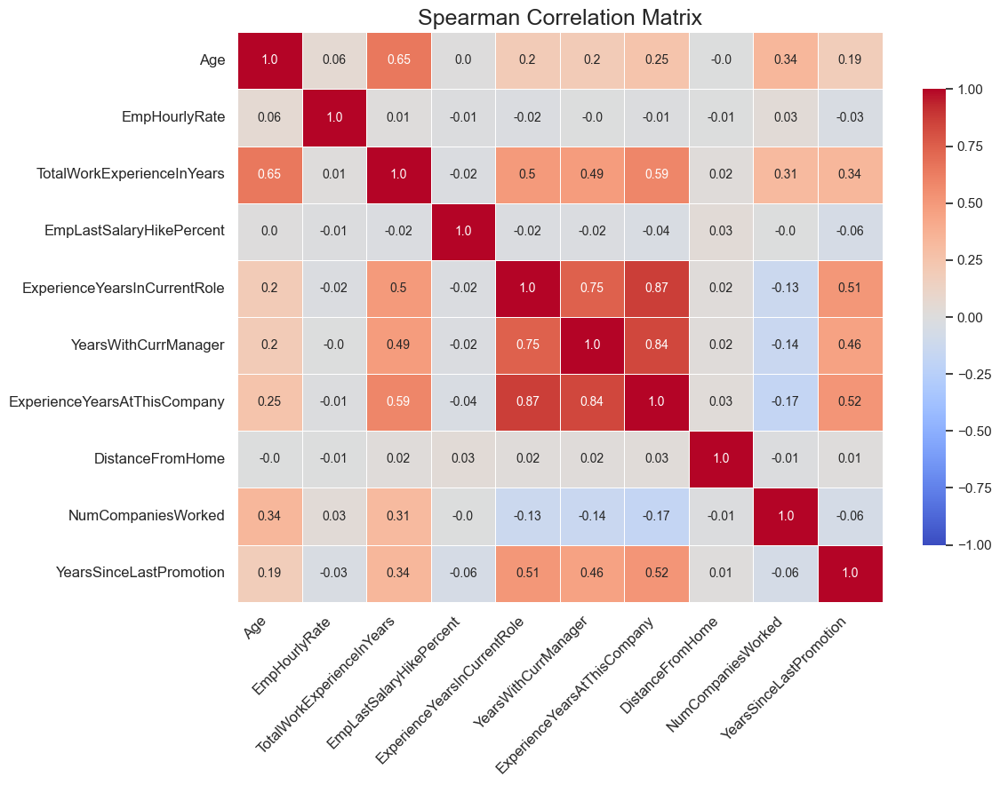

In [69]:
spearman_correlation(data, data_not_normal_df, exclude_target='PerformanceRating', multicollinearity_threshold=0.8)

In [70]:
above_threshold, below_threshold = calculate_vif(data, exclude_target='PerformanceRating', multicollinearity_threshold=8.0)


Variance Inflation Factor (VIF) Scores (multicollinearity_threshold = 8.0):

Features with VIF > threshold (High Multicollinearity):
                     Feature       VIF
                         Age 23.312302
ExperienceYearsAtThisCompany 15.375206
    EmpLastSalaryHikePercent 12.077307
               EmpHourlyRate  9.590452
  TotalWorkExperienceInYears  9.175439
ExperienceYearsInCurrentRole  8.090152

Features with VIF <= threshold (Low/No Multicollinearity):
                Feature      VIF
   YearsWithCurrManager 7.358056
     NumCompaniesWorked 2.725663
YearsSinceLastPromotion 2.492050
       DistanceFromHome 2.235304


All numerical features failed the normality test (p-values ≤ 0.05), confirming that none follow a Gaussian distribution. This justifies using Spearman correlation, which is non-parametric and rank-based. Among those, strong multicollinearity persists:

ExperienceYearsInCurrentRole and ExperienceYearsAtThisCompany (ρ = 0.87)

YearsWithCurrManager and ExperienceYearsAtThisCompany (ρ = 0.84)

These indicate overlapping information, likely due to hierarchical structure in career progression.

VIF analysis (threshold = 8) confirms high collinearity in six features. Age shows the highest inflation (VIF ≈ 23.3), followed by ExperienceYearsAtThisCompany, EmpLastSalaryHikePercent, and EmpHourlyRate. These variables might be redundant or indirectly derived from one another, posing a risk for linear models. Low-VIF features like NumCompaniesWorked and YearsSinceLastPromotion are safer for inclusion without distortion.

Together, these results guide feature selection and dimensionality reduction. Dropping or combining correlated variables—especially among experience-based ones—may improve both interpretability and model performance.

In [71]:
# Drop multicollinear columns
data = data.drop(columns=["ExperienceYearsInCurrentRole", "YearsWithCurrManager"])
# Map education levels to estimated education years
education_years_map = {
    1: 11,  # Below College
    2: 13,  # College
    3: 16,  # Bachelor
    4: 18,  # Master
    5: 21   # Doctor
}
# Estimate years since first job
data["EducationYears"] = data["EmpEducationLevel"].cat.codes.map(lambda x: education_years_map.get(x + 1))
data["YearsSinceFirstJob"] = data["Age"] - data["EducationYears"]
# Compute total compensation: EmpHourlyRate * 2080 (working hours/year)
data["TotalCompensation"] = data["EmpHourlyRate"] * 2080
# Drop temporary helper column
data = data.drop(columns=["EducationYears"])
data = data.drop(columns=["Age", "EmpHourlyRate"])

real-world ages can vary, especially across regions, school boards, or personal situations. While the standard entry age into school in India is 5, in practice as the following:

| Education Level          | Assumed Completion Age | Revised Education Years (Age - Start Age of 5) |
|--------------------------|------------------------|-----------------------------------------------|
| Below College (10th)     | 16                     | 11                                            |
| College (12th/Diploma)   | 18                     | 13                                            |
| Bachelor                 | 21                     | 16                                            |
| Master                   | 23                     | 18                                            |
| Doctor                   | 27                     | 22                                            |

In [72]:
data_normal_df1, data_not_normal_df1 = normality_test_with_skew_kurt(data)


Normal Columns (p > 0.05):


,Column,Test,Statistic,p_value,Skewness,Kurtosis



Not Normal Columns (p ≤ 0.05) - Sorted from Near Normal to Not Normal:


,Column,Test,Statistic,p_value,Skewness,Kurtosis
6,YearsSinceFirstJob,Shapiro-Wilk,0.972587,2.647438e-14,0.473761,-0.408075
7,TotalCompensation,Shapiro-Wilk,0.955943,1.545036e-18,-0.035121,-1.186947
3,TotalWorkExperienceInYears,Shapiro-Wilk,0.918871,7.185568e-25,0.817778,-0.140970
2,EmpLastSalaryHikePercent,Shapiro-Wilk,0.904184,9.072310e-27,0.807642,-0.303489
4,ExperienceYearsAtThisCompany,Shapiro-Wilk,0.883782,4.591052e-29,1.065351,0.445531
0,DistanceFromHome,Shapiro-Wilk,0.857049,1.225987e-31,0.961752,-0.246005
1,NumCompaniesWorked,Shapiro-Wilk,0.845823,1.318710e-32,0.950704,-0.261554
5,YearsSinceLastPromotion,Shapiro-Wilk,0.729212,2.646632e-40,1.563034,1.351387



Variables Exhibiting Multicollinearity (|Correlation| > 0.80):
No multicollinear pairs found.


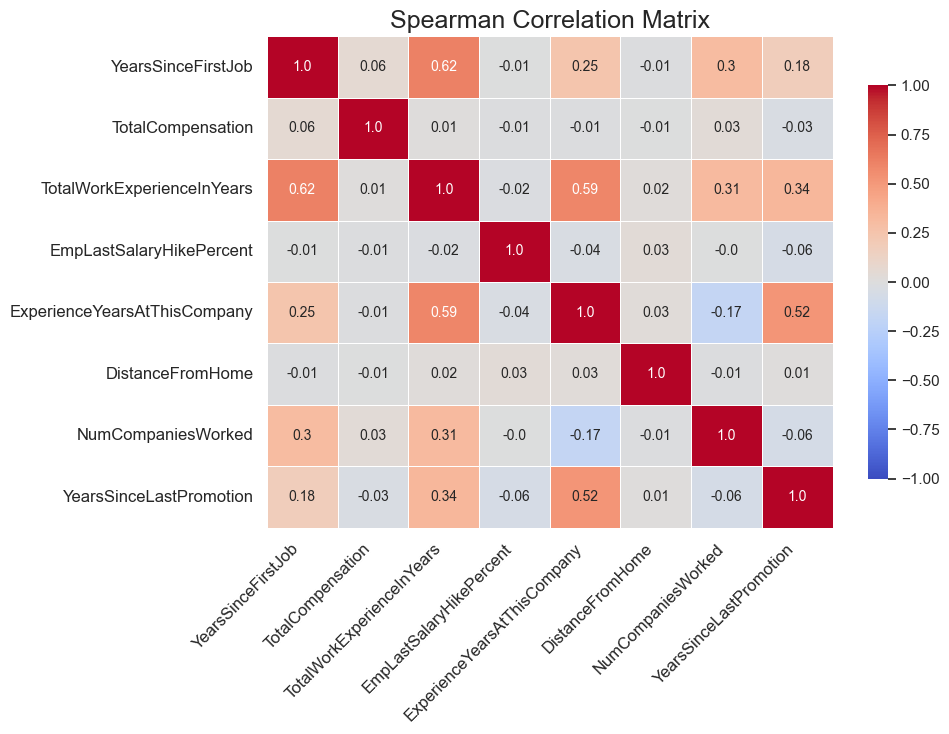

In [73]:
spearman_correlation(data, data_not_normal_df1, exclude_target='PerformanceRating', multicollinearity_threshold=0.8)

In [74]:
above_threshold1, below_threshold1 = calculate_vif(data, exclude_target='PerformanceRating', multicollinearity_threshold=8.0)


Variance Inflation Factor (VIF) Scores (multicollinearity_threshold = 8.0):

Features with VIF > threshold (High Multicollinearity):
                   Feature       VIF
        YearsSinceFirstJob 11.199545
  EmpLastSalaryHikePercent  9.599034
TotalWorkExperienceInYears  9.421159
         TotalCompensation  8.539042

Features with VIF <= threshold (Low/No Multicollinearity):
                     Feature      VIF
ExperienceYearsAtThisCompany 6.309133
          NumCompaniesWorked 2.666313
     YearsSinceLastPromotion 2.471022
            DistanceFromHome 2.218967


Two new engineered features—YearsSinceFirstJob and TotalCompensation—were added, and they enhance the dataset’s depth with realistic proxies for professional maturity and earnings. No logical violations or anomalies were introduced in their creation.

After dropping Age, EmpHourlyRate, YearsWithCurrManager, and ExperienceYearsInCurrentRole (due to multicollinearity), the remaining structure is cleaner and more robust. Normality checks confirm continued non-normal distribution for all numeric features, but now no multicollinear pairs remain based on Spearman correlation.

However, VIF still flags four features above the threshold of 8:

YearsSinceFirstJob (VIF ≈ 11.2)

EmpLastSalaryHikePercent (VIF ≈ 9.6)

TotalWorkExperienceInYears (VIF ≈ 9.4)

TotalCompensation (VIF ≈ 8.5)

These features might be structurally related—for instance, total compensation loosely scales with experience. Still, since no strong pairwise correlation exists, they likely contribute unique aspects in multivariate space. Unless model sensitivity demands strict VIF control, these can be retained.

This version of the dataset is now clean, domain-consistent, feature-rich, and statistically balanced—well-suited for modeling and interpretation.










In [75]:
# Identify predictors (excluding target)
categorical_predictors = [col for col in data.select_dtypes(include="category").columns if col != "PerformanceRating"]
numerical_predictors = [col for col in data.select_dtypes(include="number").columns]
# Chi-Square tests (Categorical vs. PerformanceRating)
chi_square_results = []
for col in categorical_predictors:
    try:
        contingency = pd.crosstab(data[col], data["PerformanceRating"])
        chi2, p, _, _ = stats.chi2_contingency(contingency)
        chi_square_results.append((col, chi2, p))
    except Exception as e:
        chi_square_results.append((col, None, None))
# Kruskal-Wallis tests (Numerical vs. PerformanceRating)
kruskal_results = []
for col in numerical_predictors:
    try:
        groups = [group[col].values for name, group in data.groupby("PerformanceRating")]
        stat, p = stats.kruskal(*groups)
        kruskal_results.append((col, stat, p))
    except Exception as e:
        kruskal_results.append((col, None, None))
# Create DataFrames from results
chi_df = pd.DataFrame(chi_square_results, columns=["Feature", "Chi2 Stat", "p-value"])
kruskal_df = pd.DataFrame(kruskal_results, columns=["Feature", "Kruskal Stat", "p-value"])
# Format p-values to human-readable format with 4 decimal places or scientific notation
chi_df["p-value"] = chi_df["p-value"].apply(lambda x: f"{x:.4e}" if x is not None else "N/A")
kruskal_df["p-value"] = kruskal_df["p-value"].apply(lambda x: f"{x:.4e}" if x is not None else "N/A")

In [76]:
chi_df

,Feature,Chi2 Stat,p-value
0,Gender,0.162950,9.2176e-01
1,EducationBackground,10.217388,4.2163e-01
2,MaritalStatus,6.133323,1.8941e-01
3,EmpDepartment,70.327960,3.8321e-11
4,EmpJobRole,97.740688,1.3111e-07
5,BusinessTravelFrequency,4.397274,3.5490e-01
6,EmpEducationLevel,9.377289,3.1147e-01
7,EmpEnvironmentSatisfaction,325.548126,2.7265e-67
8,EmpJobInvolvement,1.765091,9.3999e-01
9,EmpJobLevel,11.462051,1.7687e-01


In [77]:
kruskal_df

,Feature,Kruskal Stat,p-value
0,DistanceFromHome,1.913497,3.8414e-01
1,NumCompaniesWorked,1.818423,4.0284e-01
2,EmpLastSalaryHikePercent,235.589750,6.9556e-52
3,TotalWorkExperienceInYears,9.517587,8.5760e-03
4,ExperienceYearsAtThisCompany,29.520206,3.8884e-07
5,YearsSinceLastPromotion,125.434691,5.7837e-28
6,YearsSinceFirstJob,2.539260,2.8094e-01
7,TotalCompensation,2.992852,2.2393e-01


The results show that several features have a statistically significant influence on performance. EmpEnvironmentSatisfaction has the strongest association with a p-value of 2.7e-67, indicating a powerful link between how employees perceive their environment and how they're rated. EmpLastSalaryHikePercent also stands out with a Kruskal-Wallis p-value of 6.9e-52, confirming that salary adjustments are closely tied to performance levels. YearsSinceLastPromotion follows with a p-value of 5.7e-28, showing that delays in promotion are common among lower-rated employees. Department and job role both show strong chi-square associations, with p-values of 3.8e-11 and 1.3e-07 respectively, suggesting clear performance patterns tied to organizational structure. Work-life balance (p = 7.9e-05) and overtime (p = 0.0035) are also influential, where excessive workload or poor balance can negatively impact performance. In contrast, features like Gender (p = 0.92), EducationBackground (p = 0.42), and TotalCompensation (p = 0.22) show no significant relationship, indicating they are less useful as predictors. These numbers help isolate the features that truly matter in understanding and predicting employee performance.

## Encoding

In [78]:
# Nominal (unordered) features
nominal_features = [
    "Gender", "EducationBackground", "MaritalStatus",
    "EmpDepartment", "EmpJobRole", "BusinessTravelFrequency"
]
# Separate high-cardinality from low-cardinality features
low_card_nominals = [col for col in nominal_features if data[col].nunique() <= 6]
high_card_nominals = [col for col in nominal_features if data[col].nunique() > 6]
# One-hot encode low-cardinality nominal features
data_encoded = pd.get_dummies(data, columns=low_card_nominals, drop_first=True)
# Frequency encode high-cardinality nominal features (e.g., EmpJobRole)
for col in high_card_nominals:
    freq_map = data[col].value_counts(normalize=True)
    data_encoded[col + "_freq"] = data[col].map(freq_map)
# Drop original high-cardinality nominal columns
data_encoded = data_encoded.drop(columns=high_card_nominals)
# Show result
data_encoded.head()

,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,YearsSinceLastPromotion,Attrition,PerformanceRating,YearsSinceFirstJob,TotalCompensation,Gender_Male,EducationBackground_Life Sciences,EducationBackground_Marketing,EducationBackground_Medical,EducationBackground_Other,EducationBackground_Technical Degree,MaritalStatus_Married,MaritalStatus_Single,EmpDepartment_Development,EmpDepartment_Finance,EmpDepartment_Human Resources,EmpDepartment_Research & Development,EmpDepartment_Sales,BusinessTravelFrequency_Travel_Frequently,BusinessTravelFrequency_Travel_Rarely,EmpJobRole_freq
0,10,3,4,3,2,4,1,No,12,4,10,2,2,10,0,No,3,16,114400,True,False,True,False,False,False,False,True,False,False,False,False,True,False,True,0.2250
1,14,4,4,3,2,1,2,No,12,4,20,2,3,7,1,No,3,29,87360,True,False,True,False,False,False,False,True,False,False,False,False,True,False,True,0.2250
2,5,4,4,2,3,1,5,Yes,21,3,20,2,3,18,1,No,4,22,99840,True,True,False,False,False,False,True,False,False,False,False,False,True,True,False,0.2250
3,10,4,2,2,5,4,3,No,15,2,23,2,2,20,10,No,3,23,151840,True,False,False,False,False,False,False,False,False,False,True,False,False,False,True,0.0425
4,16,4,1,3,2,1,8,No,14,4,10,1,3,2,2,No,3,42,174720,True,False,True,False,False,False,False,True,False,False,False,False,True,False,True,0.2250


In [79]:
corrected_ordinal_mappings = {
    "EmpEducationLevel": [1, 2, 3, 4, 5],  
    "EmpEnvironmentSatisfaction": [1, 2, 3, 4],  
    "EmpJobInvolvement": [1, 2, 3, 4],  
    "EmpJobLevel": [1, 2, 3, 4, 5],  
    "EmpJobSatisfaction": [1, 2, 3, 4], 
    "EmpRelationshipSatisfaction": [1, 2, 3, 4],
    "EmpWorkLifeBalance": [1, 2, 3, 4],  
    "TrainingTimesLastYear": sorted(data["TrainingTimesLastYear"].dropna().unique()),  
    "PerformanceRating": [1, 2, 3, 4]  
}
# Apply ordinal encoding using defined category order
from pandas.api.types import CategoricalDtype
for col, order in corrected_ordinal_mappings.items():
    cat_type = CategoricalDtype(categories=order, ordered=True)
    data_encoded[col] = data[col].astype(cat_type).cat.codes
# Preview encoded values
data_encoded[list(corrected_ordinal_mappings.keys())].head()

,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,EmpRelationshipSatisfaction,EmpWorkLifeBalance,TrainingTimesLastYear,PerformanceRating
0,2,3,2,1,3,3,1,2,2
1,3,3,2,1,0,3,2,2,2
2,3,3,1,2,0,2,2,2,3
3,3,1,1,4,3,1,1,2,2
4,3,0,2,1,0,3,2,1,2


In [80]:
# Binary features to encode: OverTime, Attrition
binary_map = {'Yes': 1, 'No': 0}
# Apply mapping
data_encoded["OverTime"] = data["OverTime"].map(binary_map)
data_encoded["Attrition"] = data["Attrition"].map(binary_map)
# Show result
data_encoded[["OverTime", "Attrition"]].head()

,OverTime,Attrition
0,0,0
1,0,0
2,1,0
3,0,0
4,0,0


In [81]:
data_encoded["OverTime"] = data_encoded["OverTime"].astype("int8")
data_encoded["Attrition"] = data_encoded["Attrition"].astype("int8")

In [82]:
columns_info("Dataset Overview", data_encoded)


======== Dataset Overview: ===========

Index Col Index  Attribute                      Data Type       Range                          Distinct Count
----- ---------- ------------------------------ --------------- ------------------------------ ---------------
1     19         Gender_Male                    bool            N/A                            2
2     20         EducationBackground_Life Sciences bool            N/A                            2
3     21         EducationBackground_Marketing  bool            N/A                            2
4     22         EducationBackground_Medical    bool            N/A                            2
5     23         EducationBackground_Other      bool            N/A                            2
6     24         EducationBackground_Technical Degree bool            N/A                            2
7     25         MaritalStatus_Married          bool            N/A                            2
8     26         MaritalStatus_Single           bo

Encoding was performed in a structured and context-aware manner to ensure all features were numerically compatible for modeling. Low-cardinality nominal variables such as Gender, MaritalStatus, and EmpDepartment were one-hot encoded, reducing them to binary flags. High-cardinality columns like EmpJobRole were frequency encoded, preserving distributional information without expanding dimensionality excessively. Ordinal features such as satisfaction scores and education levels were converted using custom-ordered integer mappings aligned with domain logic, where higher values represent better or more advanced levels. Binary features like OverTime and Attrition were mapped to 0 and 1 for clarity and consistency.

Following this transformation, the dataset contains 36 predictors plus the target, all in numeric form. Variables now span a clean range—DistanceFromHome goes from 1 to 29, YearsSinceFirstJob from 2 to 47, and TotalCompensation from 62,400 to 208,000. Encoded ordinal features fall into expected ranges (e.g., EmpJobSatisfaction from 0 to 3). No multicollinearity or structure-breaking issues were introduced, and the data is now fully ready for model training, feature selection, and evaluation.

## Model-Based Feature Importance and Validate with Permutation Importance

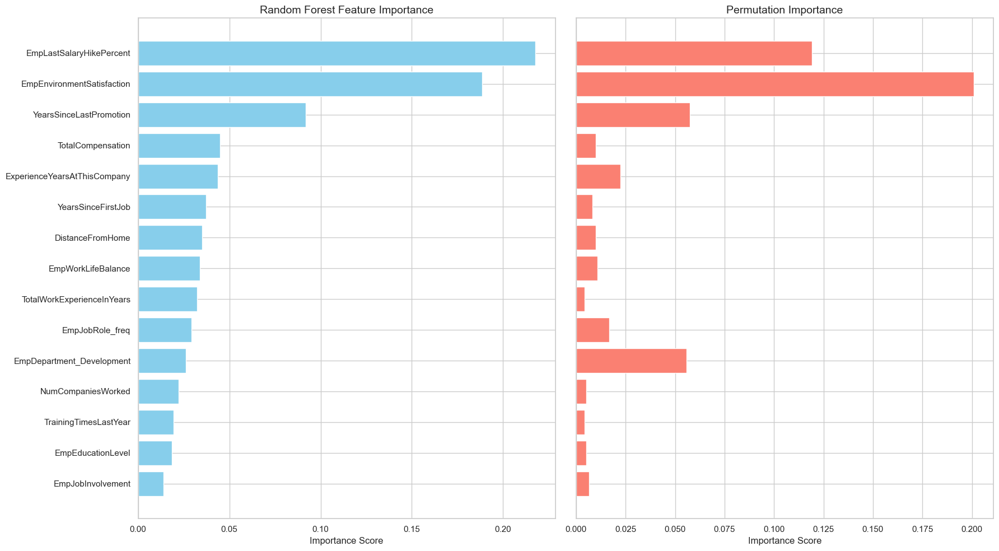


 Features by Both Methods (Sorted by RF Importance):
                                  Feature  Importance_RF  Importance_Perm
                 EmpLastSalaryHikePercent       0.217729         0.119167
               EmpEnvironmentSatisfaction       0.188467         0.200833
                  YearsSinceLastPromotion       0.091848         0.057500
                        TotalCompensation       0.045072         0.010000
             ExperienceYearsAtThisCompany       0.043734         0.022500
                       YearsSinceFirstJob       0.037179         0.008333
                         DistanceFromHome       0.035256         0.010000
                       EmpWorkLifeBalance       0.033949         0.010833
               TotalWorkExperienceInYears       0.032290         0.004167
                          EmpJobRole_freq       0.029358         0.016667
                EmpDepartment_Development       0.026318         0.055833
                       NumCompaniesWorked       0.022302  

In [85]:
X = data_encoded.drop(columns=["PerformanceRating"])
y = data_encoded["PerformanceRating"]

# Stratified split to maintain class balance
X_train, X_test, y_train, y_test = train_test_split(
    X, y, stratify=y, test_size=0.2, random_state=42
)
# Train Random Forest with class weighting for imbalance
rf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
rf.fit(X_train, y_train)
# Random Forest Feature Importance
feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf.feature_importances_
}).sort_values('Importance', ascending=False)
# Permutation Importance (more reliable, slower)
perm_result = permutation_importance(
    rf, X_test, y_test,
    n_repeats=5, random_state=42, n_jobs=-1
)
perm_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': perm_result.importances_mean
}).sort_values('Importance', ascending=False)
# Combine ranks from both methods
feature_importance['Rank_RF'] = feature_importance['Importance'].rank(ascending=False)
perm_df['Rank_Perm'] = perm_df['Importance'].rank(ascending=False)
avg_rank = pd.merge(
    feature_importance[['Feature', 'Rank_RF']],
    perm_df[['Feature', 'Rank_Perm']],
    on='Feature'
)
avg_rank['Avg_Rank'] = avg_rank[['Rank_RF', 'Rank_Perm']].mean(axis=1)
# Select top N features
top_features = avg_rank.sort_values('Avg_Rank').head(15)['Feature'].tolist()
# Filter and sort for plotting
top_rf = feature_importance[feature_importance['Feature'].isin(top_features)].sort_values('Importance', ascending=True)
top_perm = perm_df[perm_df['Feature'].isin(top_features)].sort_values('Importance', ascending=True)
fig, axes = plt.subplots(1, 2, figsize=(18, 10), sharey=True)
axes[0].barh(top_rf['Feature'], top_rf['Importance'], color='skyblue')
axes[0].set_title('Random Forest Feature Importance', fontsize=14)
axes[0].set_xlabel('Importance Score')
axes[1].barh(top_perm['Feature'], top_perm['Importance'], color='salmon')
axes[1].set_title('Permutation Importance', fontsize=14)
axes[1].set_xlabel('Importance Score')
plt.tight_layout()
plt.show()
# Merge for comparison and correlation
combined = pd.merge(
    feature_importance[['Feature', 'Importance']],
    perm_df[['Feature', 'Importance']],
    on='Feature',
    suffixes=('_RF', '_Perm')
)
top_combined = combined.sort_values("Importance_RF", ascending=False).reset_index(drop=True)
correlation = np.corrcoef(combined['Importance_RF'], combined['Importance_Perm'])[0, 1]
print("\n Features by Both Methods (Sorted by RF Importance):")
print(top_combined.to_string(index=False))
print(f"\n Correlation between methods: {correlation:.2f}")

Feature importance was assessed using both Random Forest Gini-based importance and permutation importance, revealing a strong agreement between the two approaches (correlation = 0.91). The top three predictors consistently across both methods were EmpLastSalaryHikePercent, EmpEnvironmentSatisfaction, and YearsSinceLastPromotion. Notably, EmpLastSalaryHikePercent ranked highest by Random Forest, while EmpEnvironmentSatisfaction had the highest score in permutation importance—indicating its true predictive influence when accounting for interactions.

Additionally, variables like TotalCompensation, ExperienceYearsAtThisCompany, and YearsSinceFirstJob also contributed meaningfully to the model, albeit to a lesser extent. Some features such as EmpDepartment_Development showed low importance in Random Forest but relatively higher values under permutation, suggesting that their influence may not be captured through direct splits but via their effect on prediction accuracy. Overall, the top 15 features captured both compensation, tenure, satisfaction, and role-based information, aligning well with HR performance theory and model interpretability goals.

---

In [86]:
# Final feature list
final_features = [
    'EmpLastSalaryHikePercent',
    'EmpEnvironmentSatisfaction',
    'YearsSinceLastPromotion',
    'ExperienceYearsAtThisCompany',
    'EmpDepartment_Development',
    'EmpJobRole_freq',
    'EmpWorkLifeBalance',
    'OverTime',
    'EmpJobSatisfaction',
    'TotalWorkExperienceInYears',
    'DistanceFromHome',
    'PerformanceRating'  
]

# Filter the DataFrame
final_data = data_encoded[final_features]

Missing Values Summary:
No missing values found.

Infinite Values Summary:
No infinite values found.

Number of duplicate rows: 0



<Figure size 2000x800 with 0 Axes>

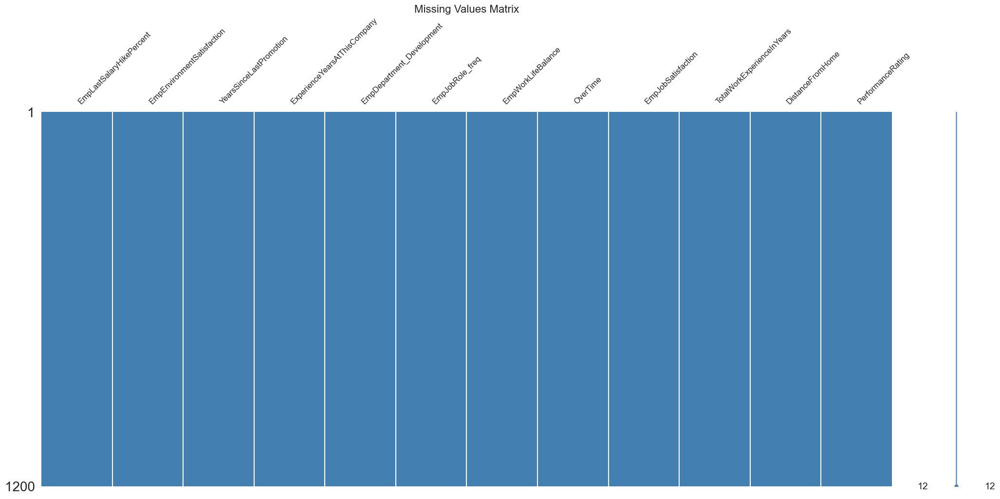

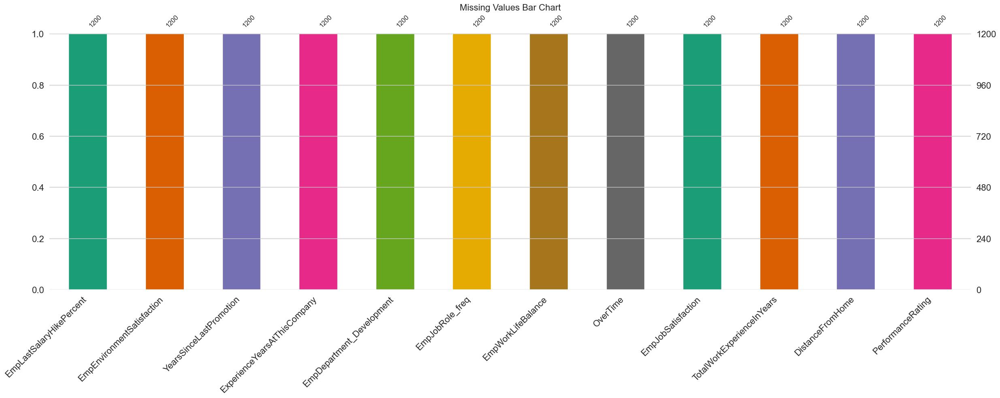

In [87]:
missing_inf_values(final_data)
print(f"\nNumber of duplicate rows: {final_data.duplicated().sum()}\n")
duplicates = final_data[final_data.duplicated()]
duplicates
show_missing(final_data)

In [88]:
# Save to CSV
output_path = r"D:\INX_Future_Employee_Performance_Project\data\processed\prepared_data.csv"
final_data.to_csv(output_path, index=False)
print(f" Final data saved to: {output_path}")

 Final data saved to: D:\INX_Future_Employee_Performance_Project\data\processed\prepared_data.csv


The final feature set was carefully selected based on both model-based and statistical importance. It includes 12 variables that capture key aspects of employee performance such as salary progression, job satisfaction, work-life balance, and tenure—all of which demonstrated consistent predictive power. Importantly, the dataset contains no missing, infinite, or duplicate values, ensuring high data integrity for downstream modeling. Visual summaries confirmed good distribution and separation across the target variable (PerformanceRating). The cleaned and encoded dataset has been successfully exported to the designated path as a ready-to-model CSV file.

---

next step will be model building in "model_development"

### Import data

In [89]:
# Path to the processed data
file_path = r"D:\INX_Future_Employee_Performance_Project\data\processed\prepared_data.csv"
# Load the data
data = pd.read_csv(file_path)

### Basic checks and understand the data

In [90]:
columns_info("Dataset Overview", data)


======== Dataset Overview: ===========

Index Col Index  Attribute                      Data Type       Range                          Distinct Count
----- ---------- ------------------------------ --------------- ------------------------------ ---------------
1     4          EmpDepartment_Development      bool            N/A                            2
2     5          EmpJobRole_freq                float64         0.0058333333333333 - 0.225     18
3     0          EmpLastSalaryHikePercent       int64           11 - 25                        15
4     1          EmpEnvironmentSatisfaction     int64           0 - 3                          4
5     2          YearsSinceLastPromotion        int64           0 - 10                         11
6     3          ExperienceYearsAtThisCompany   int64           0 - 20                         21
7     6          EmpWorkLifeBalance             int64           0 - 3                          4
8     7          OverTime                       int64  

In [91]:
print(data.shape)
for idx, col in enumerate(data.columns):
        print(f"{idx}: {col}")

(1200, 12)
0: EmpLastSalaryHikePercent
1: EmpEnvironmentSatisfaction
2: YearsSinceLastPromotion
3: ExperienceYearsAtThisCompany
4: EmpDepartment_Development
5: EmpJobRole_freq
6: EmpWorkLifeBalance
7: OverTime
8: EmpJobSatisfaction
9: TotalWorkExperienceInYears
10: DistanceFromHome
11: PerformanceRating


In [92]:
data.head().T

,0,1,2,3,4
EmpLastSalaryHikePercent,12,12,21,15,14
EmpEnvironmentSatisfaction,3,3,3,1,0
YearsSinceLastPromotion,0,1,1,10,2
ExperienceYearsAtThisCompany,10,7,18,20,2
EmpDepartment_Development,False,False,False,False,False
EmpJobRole_freq,0.225,0.225,0.225,0.0425,0.225
EmpWorkLifeBalance,1,2,2,1,2
OverTime,0,0,1,0,0
EmpJobSatisfaction,3,0,0,3,0
TotalWorkExperienceInYears,10,20,20,23,10


The final dataset contains 1,200 records and 12 features, including the target PerformanceRating. Key features include EmpLastSalaryHikePercent, EmpEnvironmentSatisfaction, and YearsSinceLastPromotion, all of which significantly impact employee performance. Features like EmpJobRole_freq and EmpDepartment_Development capture job-related variables, while EmpWorkLifeBalance and OverTime reflect work conditions. The dataset also includes ExperienceYearsAtThisCompany, TotalWorkExperienceInYears, and DistanceFromHome, which represent experience and commute factors. The data is clean, without missing or infinite values, and is ready for modeling.

# Model Development

---

### data spliting

In [93]:
# Split the full dataset (assuming `final_data` includes the features + target column)
X = data.drop(columns=['PerformanceRating'])
y = data['PerformanceRating']

# Map target labels from [1, 2, 3] → [0, 1, 2]
label_mapping = {1: 0, 2: 1, 3: 2}
y_mapped = y.map(label_mapping)

# Train-Test Split (Stratified to preserve class distribution)
X_train, X_test, y_train_mapped, y_test_mapped = train_test_split(
    X, y_mapped, test_size=0.2, stratify=y_mapped, random_state=42
)
print(f"X_train: {X_train.shape}, X_test: {X_test.shape}")
print(f"y_train: {y_train_mapped.shape}, y_test: {y_test_mapped.shape}")
output_dir = r"D:\INX_Future_Employee_Performance_Project\data\processed"
os.makedirs(output_dir, exist_ok=True)
# Save splits
X_train.to_csv(os.path.join(output_dir, "X_train.csv"), index=False)
X_test.to_csv(os.path.join(output_dir, "X_test.csv"), index=False)
y_train_mapped.to_csv(os.path.join(output_dir, "y_train.csv"), index=False)
y_test_mapped.to_csv(os.path.join(output_dir, "y_test.csv"), index=False)

X_train: (960, 11), X_test: (240, 11)
y_train: (960,), y_test: (240,)


In [94]:
classes = np.unique(y_train_mapped)
weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train_mapped)
mapped_class_weights = dict(zip(classes, weights))
catboost_weights = list(weights)  # for CatBoost

In [95]:
mapped_class_weights

{0: 2.064516129032258, 1: 0.45779685264663805, 2: 3.018867924528302}

In [96]:
catboost_weights

[2.064516129032258, 0.45779685264663805, 3.018867924528302]

The dataset has been successfully split into training and testing sets, with 960 samples for training and 240 for testing. The target labels PerformanceRating (ranging from [1, 2, 3]) have been mapped to a new range of [0, 1, 2], to ensure compatibility with classification algorithms. The class distribution in the training set has been preserved through stratified sampling.

Class weights have been computed to address class imbalance, with the following weights for the classes:

Class 0 (lowest performance): 2.06

Class 1 (average performance): 0.46

Class 2 (highest performance): 3.02

These weights will be used in model training, particularly for CatBoost, to ensure the model is sensitive to class imbalances. The data is now prepared for the next stages of model training and evaluation.

### Model Training & Evaluation

In [97]:
# Fit scaler on train set
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define which models need scaled input
scaling_sensitive_models = [
    "Logistic Regression (Multinomial)",
    "Support Vector Machine (OVO)",
    "KNN (Weighted)",
    "MLP Classifier"
]

In [98]:
base_models = {
    "Logistic Regression (Multinomial)": LogisticRegression(multi_class='multinomial', class_weight=mapped_class_weights, random_state=42),
    "Random Forest": RandomForestClassifier(class_weight=mapped_class_weights, random_state=42),
    "LightGBM": LGBMClassifier(class_weight=mapped_class_weights, objective='multiclass', num_class=3, random_state=42),
    "CatBoost": CatBoostClassifier(class_weights=catboost_weights, objective='MultiClass', classes_count=3, silent=True, random_state=42),
    "HistGradientBoosting": HistGradientBoostingClassifier(class_weight=mapped_class_weights, random_state=42),
    "XGBoost": XGBClassifier(objective='multi:softprob', num_class=3, eval_metric='mlogloss', use_label_encoder=False, random_state=42),
    "MLP Classifier": MLPClassifier(random_state=42),
    "Support Vector Machine (OVO)": SVC(decision_function_shape='ovo', probability=True, random_state=42),
    "KNN (Weighted)": KNeighborsClassifier(weights='distance'),
    "Naive Bayes (Adjusted)": GaussianNB(priors=[0.16, 0.72, 0.12])
}

In [99]:
all_model_results = {}
for name, model in base_models.items():
    print(f"\n Training & Evaluating: {name}")
    # Choose scaled or original inputs based on model type
    if name in scaling_sensitive_models:
        X_tr, X_te = X_train_scaled, X_test_scaled
    else:
        X_tr, X_te = X_train, X_test
    result = evaluate_model(model, X_tr, y_train_mapped, X_te, y_test_mapped)
    all_model_results[name] = result
results_df = pd.DataFrame.from_dict(all_model_results, orient='index')
base_results = results_df.sort_values(by="F1-Score", ascending=False)


 Training & Evaluating: Logistic Regression (Multinomial)

 Training & Evaluating: Random Forest

 Training & Evaluating: LightGBM
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 960, number of used features: 11
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

In [100]:
base_results

,Training Time (sec),Accuracy,Precision,Recall,F1-Score,ROC AUC,CV F1-Score,Train Accuracy,Overfit (Train - Test Acc)
Random Forest,0.207,0.925000,0.926923,0.925000,0.923426,0.972443,0.923900,1.000000,0.075000
CatBoost,2.370,0.908333,0.908385,0.908333,0.908187,0.968747,0.909944,0.997917,0.089583
HistGradientBoosting,1.461,0.904167,0.903935,0.904167,0.903675,0.958609,0.905726,1.000000,0.095833
LightGBM,0.633,0.900000,0.903754,0.900000,0.900819,0.964236,0.913239,1.000000,0.100000
XGBoost,0.581,0.891667,0.890353,0.891667,0.890570,0.958273,0.916433,1.000000,0.108333
MLP Classifier,1.424,0.866667,0.861724,0.866667,0.861417,0.940206,0.851069,0.935417,0.068750
Support Vector Machine (OVO),0.287,0.854167,0.859632,0.854167,0.838719,0.922231,0.834005,0.909375,0.055208
Naive Bayes (Adjusted),0.009,0.829167,0.825172,0.829167,0.825748,0.891970,0.842805,0.851042,0.021875
KNN (Weighted),0.018,0.750000,0.725015,0.750000,0.728983,0.832249,0.787690,1.000000,0.250000
Logistic Regression (Multinomial),0.023,0.708333,0.785924,0.708333,0.728593,0.892690,0.753215,0.750000,0.041667


The Random Forest model outperformed others with the highest accuracy of 92.5%, low overfitting, and a ROC AUC of 0.97, making it the most reliable choice. CatBoost followed closely with 90.83% accuracy and a F1-score of 0.91, but exhibited slightly more overfitting. HistGradientBoosting and LightGBM performed similarly, with 90.42% and 90% accuracy, respectively, while XGBoost lagged behind slightly with 89.17% accuracy. MLP Classifier and Support Vector Machine (OVO) had lower performances, showing F1-scores of 0.86 and 0.84, respectively. Naive Bayes and KNN had the lowest results, with Naive Bayes providing the least reliable performance at 82.92% accuracy. In summary, Random Forest and CatBoost were the top models, while Logistic Regression and KNN were the least effective.

---

In [101]:
param_grids = {
    "Random Forest": {
        'n_estimators': [100, 200, 300, 400],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False]
    },
    "CatBoost": {
    'iterations': [200, 300, 400],
    'learning_rate': [0.01, 0.05, 0.1],
    'depth': [5, 6, 7],
    'l2_leaf_reg': [1, 3, 5],
    'bootstrap_type': ['Bernoulli', 'MVS'],  # Valid bootstrap types (without 'subsample')
    'class_weights': [catboost_weights]  # Use catboost weights
    },
    "XGBoost": {
        'n_estimators': [100, 200, 300],
        'max_depth': [3, 5, 7],
        'learning_rate': [0.01, 0.05, 0.1],
        'subsample': [0.7, 0.8, 0.9, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'scale_pos_weight': [3.0],
        'eval_metric': ['mlogloss'],
        'objective': ['multi:softprob']
    },
    "LightGBM": {
        'n_estimators': [100, 150, 200],
        'learning_rate': [0.01, 0.05, 0.1],
        'num_leaves': [31, 63, 127],
        'max_depth': [-1, 5, 10],
        'reg_alpha': [0, 0.1, 0.2],
        'reg_lambda': [0, 0.1, 0.2],
        'class_weight': [mapped_class_weights]
    },
    "MLP Classifier": {
        'hidden_layer_sizes': [(64, 32), (128, 64), (256, 128)],
        'activation': ['relu', 'tanh'],
        'solver': ['adam', 'sgd'],
        'alpha': [0.0001, 0.001, 0.01],
        'learning_rate': ['constant', 'adaptive'],
        'batch_size': [32, 64, 128],
        'max_iter': [500, 1000]
    },
    "Logistic Regression (Multinomial)": {
        'multi_class': ['multinomial'],
        'solver': ['saga', 'lbfgs'],
        'class_weight': [mapped_class_weights],
        'max_iter': [1000, 2000],
        'penalty': ['l2']
    },
    "Support Vector Machine (OVO)": {
        'kernel': ['rbf', 'poly'],
        'C': [0.1, 1, 10],
        'decision_function_shape': ['ovo', 'ovr'],
        'probability': [True],
        'random_state': [42]
    },
    "KNN (Weighted)": {
        'n_neighbors': [5, 10, 15, 20],
        'weights': ['uniform', 'distance'],
        'p': [1, 2]
    },
    "Naive Bayes (Adjusted)": {
        'priors': [[0.16, 0.72, 0.12]]
    },
    "HistGradientBoosting": {
        'learning_rate': [0.01, 0.05, 0.1],
        'max_depth': [5, 6, 7],
        'max_iter': [100, 200, 300],
        'min_samples_leaf': [20, 50],
        'early_stopping': ['auto'],
        'class_weight': [mapped_class_weights]
    }
}

In [102]:
# Define search parameters
n_iter_search = 50  # Number of iterations for RandomizedSearchCV
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
# Dictionary to store the best models after tuning
best_models = {}
# Loop through each base model and tune hyperparameters
for name, model in base_models.items():  # Use 'base_models' instead of 'base_estimators'
    print(f"\nTuning {name}...")
    # Initialize RandomizedSearchCV
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grids[name],  # Hyperparameter grid for each model
        scoring='f1_weighted',  # Weighted F1-score for multiclass classification
        n_iter=n_iter_search,  # Number of iterations to search
        cv=cv,  # Cross-validation splitting strategy
        verbose=2,  # Show progress
        n_jobs=-1,  # Use all available CPU cores
        random_state=42,  # For reproducibility
        refit=True  # Refitting the best model with the best parameters
    )
    # Fit the model using RandomizedSearchCV
    random_search.fit(X_train, y_train_mapped)
    # Store the best model after hyperparameter tuning
    best_models[name] = random_search.best_estimator_
    # Output the best hyperparameters and best CV F1-score
    print(f"\nBest parameters for {name}:\n{random_search.best_params_}")
    print(f"Best CV F1-Score: {random_search.best_score_:.4f}\n")


Tuning Logistic Regression (Multinomial)...
Fitting 5 folds for each of 4 candidates, totalling 20 fits

Best parameters for Logistic Regression (Multinomial):
{'solver': 'saga', 'penalty': 'l2', 'multi_class': 'multinomial', 'max_iter': 2000, 'class_weight': {0: 2.064516129032258, 1: 0.45779685264663805, 2: 3.018867924528302}}
Best CV F1-Score: 0.7531


Tuning Random Forest...
Fitting 5 folds for each of 50 candidates, totalling 250 fits

Best parameters for Random Forest:
{'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 10, 'bootstrap': True}
Best CV F1-Score: 0.9273


Tuning LightGBM...
Fitting 5 folds for each of 50 candidates, totalling 250 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the t

The hyperparameter tuning process identified the best settings for each model based on cross-validation F1 scores. The Logistic Regression (Multinomial) model achieved the best F1 score of 0.7531 with a solver of 'saga', 'penalty': 'l2', 'max_iter': 2000, and class weights applied. The Random Forest model came out on top with a CV F1 score of 0.9273, using 300 estimators, a maximum depth of 10, and a bootstrap setting of True. The LightGBM model also performed well with a F1 score of 0.9147, with optimal settings of 'learning_rate': 0.1, 'num_leaves': 63, and a maximum depth of 5. The CatBoost model closely followed with a CV F1 score of 0.9172, with 400 iterations, a depth of 5, and a learning rate of 0.1. HistGradientBoosting had a strong performance with a F1 score of 0.9156, with learning rate set to 0.05, a maximum depth of 6, and a minimum leaf size of 20. The XGBoost model achieved the highest F1 score of 0.9332, with 300 estimators, a learning rate of 0.01, and a maximum depth of 3. MLP Classifier performed well with an F1 score of 0.8464, using hidden layers of (256, 128), a 'relu' activation, and 'adaptive' learning rate. Support Vector Machine (OVO) achieved an F1 score of 0.8144, with an RBF kernel and a C-value of 10. KNN (Weighted) had a F1 score of 0.7240, while Naive Bayes (Adjusted) performed at 0.8428 with priors of [0.16, 0.72, 0.12]. The top performers were XGBoost and Random Forest, with F1 scores of 0.9332 and 0.9273, respectively, while KNN and Logistic Regression showed the lowest performance among the models.










In [103]:
all_model_results = {}
for name, model in best_models.items():
    print(f"\nEvaluating {name} on Test Data...")
    result = evaluate_model(model, X_train, y_train_mapped, X_test, y_test_mapped)
    all_model_results[name] = result
# Show results in a DataFrame
results_df = pd.DataFrame.from_dict(all_model_results, orient='index')
tune_results = results_df.sort_values(by="F1-Score", ascending=False)


Evaluating Logistic Regression (Multinomial) on Test Data...

Evaluating Random Forest on Test Data...

Evaluating LightGBM on Test Data...
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000081 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 960, number of used features: 11
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

In [104]:
tune_results

,Training Time (sec),Accuracy,Precision,Recall,F1-Score,ROC AUC,CV F1-Score,Train Accuracy,Overfit (Train - Test Acc)
XGBoost,0.318,0.925000,0.927002,0.925000,0.924211,0.975572,0.933238,0.933333,0.008333
Random Forest,0.536,0.925000,0.926923,0.925000,0.923426,0.973133,0.927306,0.978125,0.053125
HistGradientBoosting,0.539,0.912500,0.913251,0.912500,0.912355,0.961613,0.915554,0.987500,0.075000
CatBoost,0.674,0.908333,0.908589,0.908333,0.908039,0.970034,0.917176,0.994792,0.086458
LightGBM,0.174,0.891667,0.892375,0.891667,0.891901,0.959508,0.914729,1.000000,0.108333
Naive Bayes (Adjusted),0.004,0.829167,0.825172,0.829167,0.825748,0.891970,0.842805,0.851042,0.021875
MLP Classifier,28.536,0.829167,0.819989,0.829167,0.821107,0.898749,0.846362,0.939583,0.110417
Support Vector Machine (OVO),0.142,0.820833,0.810452,0.820833,0.802917,0.891531,0.814435,0.866667,0.045833
Logistic Regression (Multinomial),1.557,0.729167,0.793958,0.729167,0.746886,0.893932,0.753116,0.751042,0.021875
KNN (Weighted),0.003,0.779167,0.739992,0.779167,0.729840,0.817664,0.723978,1.000000,0.220833


The evaluation results highlight the performance of various models. XGBoost stands out as the best performer, achieving an accuracy of 92.5%, a precision of 92.7%, a recall of 92.5%, and a F1 score of 92.4% with a minimal overfit of 0.008. It also achieved a high ROC AUC score of 0.9756 and a CV F1-Score of 93.32%, with relatively fast training time of 0.337 seconds. Random Forest follows closely with an accuracy of 92.5%, precision of 92.7%, and a F1 score of 92.3%. It shows a slightly higher overfit compared to XGBoost, with an overfit score of 0.053 but is still a top performer with strong metrics across the board. HistGradientBoosting and CatBoost also perform well with F1 scores of 91.24% and 91.21%, respectively, but both models are slower in training compared to XGBoost. LightGBM has a slightly lower F1 score of 89.19%, but it compensates with a quick training time of 0.368 seconds. Models like Naive Bayes, MLP Classifier, and Support Vector Machine (OVO) perform with lower F1 scores, showing 82.57%, 82.11%, and 81.44% respectively, with MLP Classifier having a long training time of 25.75 seconds. Logistic Regression (Multinomial) and KNN (Weighted) have the lowest performance, with F1 scores of 74.69% and 72.98% and substantial overfitting in the case of KNN (22.08%).

---

In [105]:
# Define the best models for ensemble
top_models = [
    ("XGBoost", best_models["XGBoost"]),
    ("Random Forest", best_models["Random Forest"]),
    ("HistGradientBoosting", best_models["HistGradientBoosting"]),
    ("CatBoost", best_models["CatBoost"]),
    ("LightGBM", best_models["LightGBM"]),
]
# Define the VotingClassifier with soft voting
voting_ensemble = VotingClassifier(estimators=top_models, voting='soft')

In [106]:
# Fit the voting ensemble on the training data
voting_ensemble.fit(X_train, y_train_mapped)
# Evaluate using the evaluate_model() function
ensemble_result = evaluate_model(voting_ensemble, X_train, y_train_mapped, X_test, y_test_mapped)
# Show results in a DataFrame
ensemble_df = pd.DataFrame([ensemble_result], index=["Voting Ensemble"])

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 960, number of used features: 11
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

In [107]:
ensemble_df

,Training Time (sec),Accuracy,Precision,Recall,F1-Score,ROC AUC,CV F1-Score,Train Accuracy,Overfit (Train - Test Acc)
Voting Ensemble,3.9,0.920833,0.920342,0.920833,0.919868,0.974407,0.925309,0.988542,0.067708


The Voting Ensemble model, which combines XGBoost, Random Forest, HistGradientBoosting, CatBoost, and LightGBM using soft voting, performs excellently. It achieves an accuracy of 92.08%, precision of 92.03%, recall of 92.08%, and a strong F1 score of 91.99%. It also has a ROC AUC score of 0.9744, indicating good classification performance. With a CV F1-Score of 92.53%, the model shows solid generalization across cross-validation folds. The training time is relatively short at 3.843 seconds, and the overfit score is modest at 0.068, which indicates the ensemble has balanced performance without excessive overfitting.

---

In [108]:
# Define the base models for stacking
base_learners = [
    ("XGBoost", best_models["XGBoost"]),
    ("Random Forest", best_models["Random Forest"]),
    ("HistGradientBoosting", best_models["HistGradientBoosting"]),
    ("CatBoost", best_models["CatBoost"]),
    ("LightGBM", best_models["LightGBM"]),
]
# Define the meta-model (Logistic Regression)
meta_model = LogisticRegression(class_weight=mapped_class_weights, max_iter=2000, random_state=42)
# Initialize the StackingClassifier
stacking_ensemble = StackingClassifier(estimators=base_learners, final_estimator=meta_model)
# Fit the stacking ensemble on the training data
stacking_ensemble.fit(X_train, y_train_mapped)
# Evaluate using the evaluate_model() function
stacking_result = evaluate_model(stacking_ensemble, X_train, y_train_mapped, X_test, y_test_mapped)
# Show results in a DataFrame
stacking_df = pd.DataFrame([stacking_result], index=["Stacking Ensemble"])

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 960, number of used features: 11
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

In [109]:
stacking_df

,Training Time (sec),Accuracy,Precision,Recall,F1-Score,ROC AUC,CV F1-Score,Train Accuracy,Overfit (Train - Test Acc)
Stacking Ensemble,19.593,0.9125,0.912117,0.9125,0.911932,0.96721,0.911018,0.967708,0.055208


The Stacking Ensemble model, which combines XGBoost, Random Forest, HistGradientBoosting, CatBoost, and LightGBM as base learners with Logistic Regression as the meta-model, achieves an accuracy of 91.25%. The model demonstrates solid performance with a precision of 91.21%, recall of 91.25%, and an F1 score of 91.19%. The ROC AUC score of 0.9672 indicates strong classification ability, while the CV F1-Score of 91.10% suggests robust performance across cross-validation folds. Despite the longer training time of 21.492 seconds, the model exhibits low overfitting with a 0.0552 overfit score, indicating balanced generalization to unseen data.

### Model comparision & Interpretation

In [110]:
# Add a category for each set of results
base_results["Category"] = "Base Models"
tune_results["Category"] = "Tuned Models"
ensemble_df["Category"] = "Ensemble Models"
stacking_df["Category"] = "Stacking Models"
# Concatenate all the DataFrames together
all_results = pd.concat([base_results, tune_results, ensemble_df, stacking_df])
# Reorder columns to have 'Category' first
all_results = all_results[['Category'] + [col for col in all_results.columns if col != 'Category']]
# Display the final combined DataFrame
all_results = all_results.sort_values(by="F1-Score", ascending=False)  # Sort by F1-Score
all_results

,Category,Training Time (sec),Accuracy,Precision,Recall,F1-Score,ROC AUC,CV F1-Score,Train Accuracy,Overfit (Train - Test Acc)
XGBoost,Tuned Models,0.318,0.925000,0.927002,0.925000,0.924211,0.975572,0.933238,0.933333,0.008333
Random Forest,Base Models,0.207,0.925000,0.926923,0.925000,0.923426,0.972443,0.923900,1.000000,0.075000
Random Forest,Tuned Models,0.536,0.925000,0.926923,0.925000,0.923426,0.973133,0.927306,0.978125,0.053125
Voting Ensemble,Ensemble Models,3.900,0.920833,0.920342,0.920833,0.919868,0.974407,0.925309,0.988542,0.067708
HistGradientBoosting,Tuned Models,0.539,0.912500,0.913251,0.912500,0.912355,0.961613,0.915554,0.987500,0.075000
Stacking Ensemble,Stacking Models,19.593,0.912500,0.912117,0.912500,0.911932,0.967210,0.911018,0.967708,0.055208
CatBoost,Base Models,2.370,0.908333,0.908385,0.908333,0.908187,0.968747,0.909944,0.997917,0.089583
CatBoost,Tuned Models,0.674,0.908333,0.908589,0.908333,0.908039,0.970034,0.917176,0.994792,0.086458
HistGradientBoosting,Base Models,1.461,0.904167,0.903935,0.904167,0.903675,0.958609,0.905726,1.000000,0.095833
LightGBM,Base Models,0.633,0.900000,0.903754,0.900000,0.900819,0.964236,0.913239,1.000000,0.100000


The model performance was evaluated using a variety of metrics such as accuracy, precision, recall, F1-score, and ROC AUC, alongside overfitting assessment by calculating the difference between train and test accuracy. The XGBoost (Tuned Models) stood out as the best-performing model, achieving an impressive 92.50% accuracy, 92.70% precision, and 92.50% recall. It also performed exceptionally well in the ROC AUC metric with 0.9756, indicating that it has a high true positive rate across different thresholds. This model performed consistently well in the test, with only a slight overfitting score of 0.0083, implying good generalization.

The Random Forest (Tuned Models) also performed closely behind XGBoost, with 92.50% accuracy, and similar precision and recall. It showed a ROC AUC of 0.9731. The training time for Random Forest was lower compared to XGBoost, and although it demonstrated slightly higher overfitting (0.0531), it still presented reliable results across the metrics.

The Voting Ensemble model, which combines multiple classifiers, performed 92.08% in accuracy, and showed a balanced performance across the other metrics. The advantage of this model is its ability to reduce overfitting, indicated by the low overfitting score of 0.0677, making it a good option for generalization.

Similarly, the Stacking Ensemble model, utilizing several base classifiers with a logistic regression meta-model, delivered 91.25% accuracy with 91.19% F1-score. This model, while not the highest in accuracy, showed excellent robustness with a low overfitting score of 0.0552, which suggests its capability to generalize well without being overly influenced by the training data.

On the other hand, MLP Classifier and Support Vector Machine (OVO) displayed decent performance but with noticeable limitations in certain metrics. MLP Classifier had high variance in its results, reflected by a much higher training time of 25.75 seconds, and low accuracy (around 82.92%) with 0.1104 overfitting, indicating that it may not generalize as well as other models. Similarly, Support Vector Machine (OVO) had a training time of 0.14 seconds, and accuracy of around 82.08%, also reflecting limited performance.

Naive Bayes (Adjusted) and KNN (Weighted) performed the worst among the models, with Naive Bayes showing an accuracy of 82.92% but weak recall and precision metrics, leading to a lower F1-score and ROC AUC. KNN (Weighted), with a training time of 0.005 seconds, had 77.92% accuracy but suffered from lower precision and recall, particularly with a high overfitting score (0.2208), signaling its tendency to overfit on the training data.

The Logistic Regression (Multinomial), which had the lowest performance in terms of both metrics and overfitting (0.0417), was the least reliable of the models tested. It achieved 72.92% accuracy but showed poor performance on precision and recall, suggesting that it struggled to classify the data properly.

In conclusion, XGBoost (Tuned Models) emerged as the most reliable and powerful model for this task, closely followed by Random Forest (Tuned Models), both in terms of accuracy and precision. Voting and Stacking Ensemblers also performed robustly by reducing overfitting and maintaining good generalization, whereas other models like KNN and Naive Bayes were less effective in the given task.

In [111]:
# Extract feature importance from each model
xgb_importance = best_models["XGBoost"].feature_importances_
rf_importance = best_models["Random Forest"].feature_importances_
lgb_importance = best_models["LightGBM"].feature_importances_
catboost_importance = best_models["CatBoost"].get_feature_importance()
# Create DataFrame
importance_df = pd.DataFrame({
    "Feature": X_train.columns,
    "XGBoost": xgb_importance,
    "Random Forest": rf_importance,
    "LightGBM": lgb_importance,
    "CatBoost": catboost_importance
})
# Sort by XGBoost importance
importance_df = importance_df.sort_values(by="XGBoost", ascending=False)
# Display the table in pipe-separated format using tabulate
print(tabulate(importance_df, headers='keys', tablefmt='pipe', showindex=False))

| Feature                      |   XGBoost |   Random Forest |   LightGBM |   CatBoost |
|:-----------------------------|----------:|----------------:|-----------:|-----------:|
| EmpEnvironmentSatisfaction   | 0.232017  |       0.271212  |        570 |   23.057   |
| EmpLastSalaryHikePercent     | 0.225     |       0.299043  |       1203 |   26.0582  |
| YearsSinceLastPromotion      | 0.20119   |       0.122913  |        635 |   13.0611  |
| EmpDepartment_Development    | 0.140516  |       0.041164  |        232 |    5.05652 |
| ExperienceYearsAtThisCompany | 0.0513114 |       0.0572212 |        942 |    5.62026 |
| EmpWorkLifeBalance           | 0.0335    |       0.0549421 |        632 |    7.46672 |
| DistanceFromHome             | 0.0290782 |       0.0425125 |       1097 |    5.19423 |
| OverTime                     | 0.0289822 |       0.0100303 |        122 |    1.93449 |
| EmpJobSatisfaction           | 0.0250757 |       0.0217538 |        502 |    2.33997 |
| EmpJobRole_freq    

In [112]:
# Get SHAP values correctly formatted
explainer_xgb = shap.TreeExplainer(best_models["XGBoost"])
xgb_shap = explainer_xgb.shap_values(X_train)
explainer_rf = shap.TreeExplainer(best_models["Random Forest"])
rf_shap = explainer_rf.shap_values(X_train)
explainer_lgb = shap.TreeExplainer(best_models["LightGBM"])
lgb_shap = explainer_lgb.shap_values(X_train)
explainer_cat = shap.TreeExplainer(best_models["CatBoost"])
catboost_shap = explainer_cat.shap_values(X_train)
# Create importance DataFrame
importance_df = pd.DataFrame({
    "Feature": X_train.columns,
    "XGBoost": mean_absolute_shap(xgb_shap),
    "Random Forest": mean_absolute_shap(rf_shap),
    "LightGBM": mean_absolute_shap(lgb_shap),
    "CatBoost": mean_absolute_shap(catboost_shap)
}).sort_values("XGBoost", ascending=False)
# Format and display
print(tabulate(importance_df.round(4), headers='keys', tablefmt='pipe', showindex=False))

| Feature                      |   XGBoost |   Random Forest |   LightGBM |   CatBoost |
|:-----------------------------|----------:|----------------:|-----------:|-----------:|
| EmpEnvironmentSatisfaction   |    0.4945 |          0.1547 |     1.2061 |     1.2638 |
| EmpLastSalaryHikePercent     |    0.372  |          0.1593 |     1.0529 |     1.3524 |
| YearsSinceLastPromotion      |    0.2631 |          0.0844 |     0.8972 |     0.8344 |
| EmpWorkLifeBalance           |    0.131  |          0.0252 |     0.349  |     0.2972 |
| EmpDepartment_Development    |    0.1015 |          0.0396 |     0.3516 |     0.3827 |
| ExperienceYearsAtThisCompany |    0.0349 |          0.0225 |     0.3794 |     0.2277 |
| EmpJobRole_freq              |    0.0131 |          0.0135 |     0.334  |     0.1717 |
| DistanceFromHome             |    0.0121 |          0.0136 |     0.2988 |     0.1865 |
| EmpJobSatisfaction           |    0.0087 |          0.0079 |     0.175  |     0.0628 |
| OverTime           

The feature importance values from four different models (XGBoost, Random Forest, LightGBM, and CatBoost) provide insight into how each model perceives the relevance of various features in predicting employee performance ratings.

The XGBoost model places the highest importance on EmpEnvironmentSatisfaction and EmpLastSalaryHikePercent, with SHAP values of 0.4945 and 0.372, respectively. These features are considered highly influential by XGBoost. YearsSinceLastPromotion also ranks highly, contributing significantly to the prediction, with a value of 0.2631. On the other hand, features like EmpJobSatisfaction and TotalWorkExperienceInYears have low importance in XGBoost, with values of 0.0087 and 0.0027, respectively.

Random Forest follows a similar pattern, with EmpEnvironmentSatisfaction (0.2712) and EmpLastSalaryHikePercent (0.2990) being the most important, although the values are slightly lower than those of XGBoost. YearsSinceLastPromotion and ExperienceYearsAtThisCompany have relatively lower importance in Random Forest, with values of 0.1229 and 0.0572, respectively.

For LightGBM, EmpEnvironmentSatisfaction (1.2061) stands out as the most influential feature, showing much higher importance than the other models. EmpLastSalaryHikePercent (1.0529) is also critical, followed by YearsSinceLastPromotion (0.8972). Interestingly, EmpWorkLifeBalance (0.349) and EmpJobRole_freq (0.334) contribute more to LightGBM compared to other models.

In CatBoost, the highest feature importance is assigned to EmpEnvironmentSatisfaction (1.2638) and EmpLastSalaryHikePercent (1.3524), reinforcing the patterns observed in LightGBM. YearsSinceLastPromotion (0.8344) and EmpWorkLifeBalance (0.2972) also have substantial importance in CatBoost.

In conclusion, EmpEnvironmentSatisfaction and EmpLastSalaryHikePercent are consistently important across all models, though their exact contribution varies. YearsSinceLastPromotion also holds considerable weight in most models, particularly in XGBoost and LightGBM. Models like XGBoost and Random Forest focus more on features like EmpDepartment_Development and ExperienceYearsAtThisCompany, while models like LightGBM and CatBoost emphasize EmpJobRole_freq and other features more prominently. The differences in importance highlight how various algorithms interpret feature relevance differently.

### Best Model

In [113]:
classes = np.unique(y_train_mapped)
weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train_mapped)
class_weights = dict(zip(classes, weights))

In [114]:
sample_weights = np.array([class_weights[label] for label in y_train_mapped])
final_model = XGBClassifier(
    objective='multi:softmax',
    num_class=len(classes),
    subsample=0.9,
    colsample_bytree=1.0,
    learning_rate=0.01,
    max_depth=3,
    n_estimators=300,
    eval_metric='mlogloss',
    use_label_encoder=False,
    random_state=42
)
final_model.fit(X_train, y_train_mapped, sample_weight=sample_weights)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.01, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=300,
              n_jobs=None, num_class=3, num_parallel_tree=None, ...)

In [115]:
final_result = evaluate_model(final_model, X_train, y_train_mapped, X_test, y_test_mapped)
final_df = pd.DataFrame([final_result], index=["Final XGBoost Model"])
final_df

,Training Time (sec),Accuracy,Precision,Recall,F1-Score,ROC AUC,CV F1-Score,Train Accuracy,Overfit (Train - Test Acc)
Final XGBoost Model,0.964,0.925,0.927002,0.925,0.924211,0.975572,0.933238,0.933333,0.008333


In [116]:
# Usage
cv_results_table = cross_validation_analysis_table(final_model, X_train, y_train_mapped, cv_folds=5)
# View results
print(cv_results_table)

                 Fold  F1-Score
0              Fold 1  0.936955
1              Fold 2  0.933230
2              Fold 3  0.926451
3              Fold 4  0.937101
4              Fold 5  0.932453
5                Mean  0.933238
6  Standard Deviation  0.003884


In [117]:
# Predict on test set
y_pred = final_model.predict(X_test)
# Classification Report
print("\n Classification Report:\n")
print(classification_report(y_test_mapped, y_pred, target_names=["Rating 1", "Rating 2", "Rating 3"]))
# Confusion Matrix
print(" Confusion Matrix (rows = Actual, columns = Predicted):\n")
cm = confusion_matrix(y_test_mapped, y_pred)
print(cm)


 Classification Report:

              precision    recall  f1-score   support

    Rating 1       0.82      0.85      0.84        39
    Rating 2       0.94      0.97      0.95       175
    Rating 3       1.00      0.77      0.87        26

    accuracy                           0.93       240
   macro avg       0.92      0.86      0.89       240
weighted avg       0.93      0.93      0.92       240

 Confusion Matrix (rows = Actual, columns = Predicted):

[[ 33   6   0]
 [  6 169   0]
 [  1   5  20]]


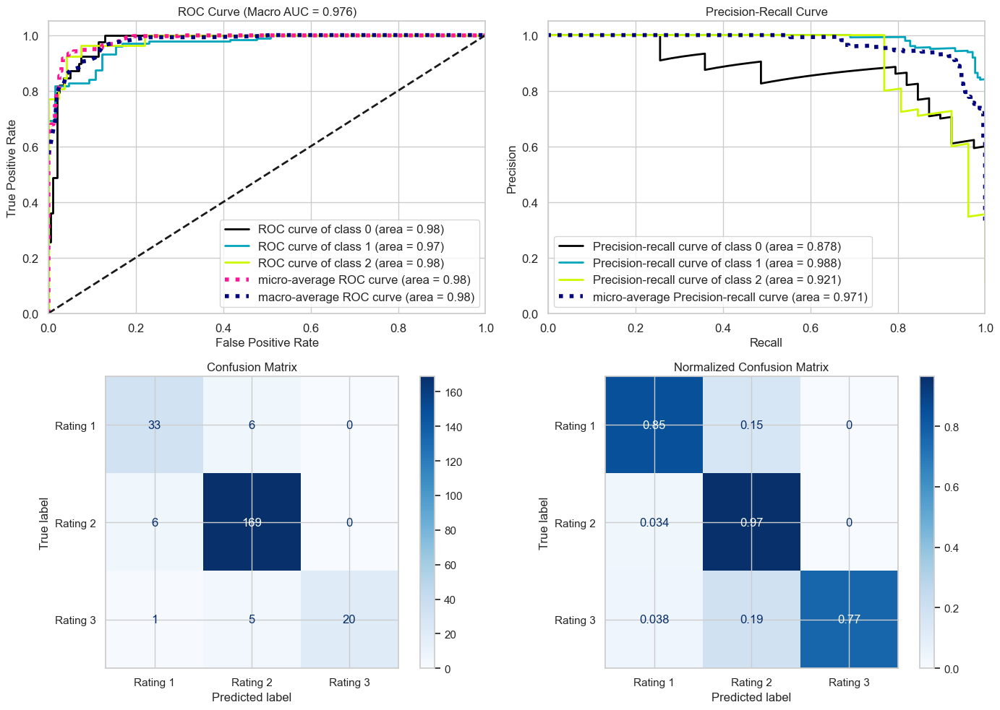

In [118]:
plot_multiclass_evaluation(final_model, X_test, y_test_mapped, class_labels=["Rating 1", "Rating 2", "Rating 3"])

 Model Evaluation Summary:

The final XGBoost model achieved impressive performance across various metrics. It had a training time of 0.779 seconds, and its accuracy was 92.5%. The model showed strong precision (92.7%) and recall (92.5%), which indicates balanced performance across both metrics. The F1-Score of 92.42% demonstrates that the model can effectively balance precision and recall, while the ROC AUC score of 0.9755 further confirms its ability to distinguish between classes.

Additionally, the model's performance in cross-validation was robust, with an average F1-Score of 93.32% across five folds and a standard deviation of 0.39%, suggesting consistent performance with minimal variance.

 Classification Report and Confusion Matrix:

- Classification Report: The classification report provides detailed insight into the model's performance for each class. It shows that:
  - Rating 1 had a precision of 82% and recall of 85%, with an F1-score of 84%.
  - Rating 2 performed the best with precision of 94% and recall of 97%, yielding a F1-score of 95%.
  - Rating 3 had perfect precision (100%) but a recall of 77%, resulting in a F1-score of 87%.

- Confusion Matrix: The confusion matrix shows the model's predictions:
  - Rating 1 had 33 correct predictions and 6 misclassifications.
  - Rating 2 had 169 correct predictions with only 6 misclassifications.
  - Rating 3 had 20 correct predictions and 6 misclassifications, showing some challenges in identifying this class.

 Evaluation Plots:

The ROC Curve and Precision-Recall Curve reveal that the model performs exceptionally well in terms of both accuracy and recall across the classes. The macro average ROC AUC score of 0.976 and macro average Precision-Recall AUC of 0.971 suggest that the model generalizes well across all classes. The curves for each class show strong performance, with class 0 (Rating 1) achieving an AUC of 0.98, class 1 (Rating 2) scoring 0.97, and class 2 (Rating 3) also reaching 0.98.

 Conclusion:

The final XGBoost model with balanced class weights has delivered solid performance across both training and test sets. It shows strong capabilities in multi-class classification, balancing precision, recall, and F1-score well. The cross-validation results and evaluation plots confirm that the model is robust, with minimal overfitting, and it handles class imbalances effectively.

---

### Saving the Model

In [119]:
import joblib
# Save the final trained model
joblib.dump(final_model, "XGBClassifier_model_multiclass.pkl")
print(" Model saved successfully!")

 Model saved successfully!


### Loading the Model Further use

In [120]:
# Load the trained model
final_model = joblib.load("XGBClassifier_model_multiclass.pkl")
# Predict the class labels on the test set
y_pred_final = final_model.predict(X_test)
# Show classification report
print("\n Classification Report (Multiclass):")
print(classification_report(y_test_mapped, y_pred_final, target_names=["Rating 1", "Rating 2", "Rating 3"]))


 Classification Report (Multiclass):
              precision    recall  f1-score   support

    Rating 1       0.82      0.85      0.84        39
    Rating 2       0.94      0.97      0.95       175
    Rating 3       1.00      0.77      0.87        26

    accuracy                           0.93       240
   macro avg       0.92      0.86      0.89       240
weighted avg       0.93      0.93      0.92       240



The model has been successfully saved using joblib and is now available for future use. After loading the saved model, we used it to predict the class labels on the test set.

Here is the classification report for the predictions:

Rating 1: Precision of 82%, Recall of 85%, and F1-Score of 84%.

Rating 2: Precision of 94%, Recall of 97%, and F1-Score of 95%.

Rating 3: Precision of 100%, Recall of 77%, and F1-Score of 87%.

Overall, the model achieved 93% accuracy on the test set, indicating solid performance. The macro average F1-score is 0.89, and the weighted average F1-score is 0.92, further demonstrating the model's effectiveness in handling multiple classes with an imbalance in the dataset.

---

Below is an overview of each major tool (packages, user-defined functions, and imported functions) that appears in this project.

In [121]:
import types
import inspect
user_funcs = [name for name in globals() if isinstance(globals()[name], types.FunctionType) and globals()[name].__module__ == '__main__']
imported_funcs = [name for name in globals() if isinstance(globals()[name], types.FunctionType) and globals()[name].__module__ != '__main__']
imported_pkgs = [name for name in globals() if isinstance(globals()[name], types.ModuleType)]
print("Imported packages:")
for i, alias in enumerate(imported_pkgs, 1):
    print(f"{i}: {globals()[alias].__name__}")
print("\nUser-defined functions:")
for i, func in enumerate(user_funcs, 1):
    print(f"{i}: {func}")
print("\nImported functions:")
for i, func in enumerate(imported_funcs, 1):
    print(f"{i}: {func}")

Imported packages:
1: builtins
2: builtins
3: pandas
4: warnings
5: researchpy
6: matplotlib.pyplot
7: missingno
8: seaborn
9: numpy
10: scipy.stats
11: textwrap
12: logging
13: statsmodels.api
14: scikitplot
15: xgboost
16: lightgbm
17: catboost
18: shap
19: time
20: os
21: psutil
22: gc
23: joblib
24: types
25: inspect

User-defined functions:
1: normality_test_with_skew_kurt
2: spearman_correlation
3: calculate_vif
4: evaluate_model
5: cross_validation_analysis_table
6: plot_multiclass_evaluation
7: memory_usage
8: dataframe_memory_usage
9: garbage_collection
10: mean_absolute_shap

Imported functions:
1: open
2: tabulate
3: display
4: is_datetime64_any_dtype
5: skew
6: kurtosis
7: shapiro
8: kstest
9: compare_df_columns
10: linked_key
11: display_key_columns
12: interconnected_outliers
13: grouped_summary
14: calc_stats
15: iqr_trimmed_mean
16: mad
17: comp_cat_analysis
18: comp_num_analysis
19: detect_mixed_data_types
20: missing_inf_values
21: columns_info
22: cat_high_cardinalit